# Unsupervised Learning: Trade & Ahead

## Problem Statement

### Context

The stock market has consistently proven to be a good place to invest in and save for the future. There are a lot of compelling reasons to invest in stocks. It can help in fighting inflation, create wealth, and also provides some tax benefits. Good steady returns on investments over a long period of time can also grow a lot more than seems possible. Also, thanks to the power of compound interest, the earlier one starts investing, the larger the corpus one can have for retirement. Overall, investing in stocks can help meet life's financial aspirations.

It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition. Having a diversified portfolio tends to yield higher returns and face lower risk by tempering potential losses when the market is down. It is often easy to get lost in a sea of financial metrics to analyze while determining the worth of a stock, and doing the same for a multitude of stocks to identify the right picks for an individual can be a tedious task. By doing a cluster analysis, one can identify stocks that exhibit similar characteristics and ones which exhibit minimum correlation. This will help investors better analyze stocks across different market segments and help protect against risks that could make the portfolio vulnerable to losses.


### Objective

Trade&Ahead is a financial consultancy firm who provide their customers with personalized investment strategies. They have hired you as a Data Scientist and provided you with data comprising stock price and some financial indicators for a few companies listed under the New York Stock Exchange. They have assigned you the tasks of analyzing the data, grouping the stocks based on the attributes provided, and sharing insights about the characteristics of each group.

### Data Dictionary

- Ticker Symbol: An abbreviation used to uniquely identify publicly traded shares of a particular stock on a particular stock market
- Company: Name of the company
- GICS Sector: The specific economic sector assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- GICS Sub Industry: The specific sub-industry group assigned to a company by the Global Industry Classification Standard (GICS) that best defines its business operations
- Current Price: Current stock price in dollars
- Price Change: Percentage change in the stock price in 13 weeks
- Volatility: Standard deviation of the stock price over the past 13 weeks
- ROE: A measure of financial performance calculated by dividing net income by shareholders' equity (shareholders' equity is equal to a company's assets minus its debt)
- Cash Ratio: The ratio of a  company's total reserves of cash and cash equivalents to its total current liabilities
- Net Cash Flow: The difference between a company's cash inflows and outflows (in dollars)
- Net Income: Revenues minus expenses, interest, and taxes (in dollars)
- Earnings Per Share: Company's net profit divided by the number of common shares it has outstanding (in dollars)
- Estimated Shares Outstanding: Company's stock currently held by all its shareholders
- P/E Ratio: Ratio of the company's current stock price to the earnings per share
- P/B Ratio: Ratio of the company's stock price per share by its book value per share (book value of a company is the net difference between that company's total assets and total liabilities)

## Importing necessary libraries and data

In [1]:
# Installing the libraries with the specified version.
# uncomment and run the following line if Google Colab is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 yellowbrick==1.5 -q --user

In [2]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.2 yellowbrick==1.5 -q --user
# !pip install --upgrade -q jinja2

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [3]:
# To help with reading and manipulating data
import numpy as np # linear algebra
import pandas as pd # data manipulation and analysis
import scipy.stats as stats # mathematical algorithms and convenience functions
from scipy.stats import zscore

# To help with data visualization
import matplotlib.pyplot as plt # data visualization
import seaborn as sns # data visualization
%matplotlib inline
sns.set_style('whitegrid') # set style for visualization
from IPython.display import display

#Statistical Tests
from statsmodels.stats.weightstats import ztest # Z-test
from scipy import stats # T-test
from scipy.stats import chisquare, chi2_contingency # Chi-Square
from scipy.stats import f_oneway # ANOVA (Analysis of Variance)
from scipy.stats import mannwhitneyu # Mann-Whitney U Test
from scipy.stats import wilcoxon # Wilcoxon Signed-Rank Test
from scipy.stats import kruskal # Kruskal-Wallis H Test
from scipy.stats import levene # Levene's Test
import statsmodels.stats.multicomp as stats_sm # statistical models, statistical tests, and statistical data exploration
import statsmodels.stats.proportion as stats_sp # statistical models, statistical tests, and statistical data exploration
import statsmodels.api as sm 

# To be used for missing value imputation
from sklearn.impute import SimpleImputer
#from sklearn.experimental import enable_iterative_imputer
#from sklearn.impute import IterativeImputer
#from fancyimpute import IterativeImputer

# For model building
from sklearn.linear_model import LinearRegression #To build linear regression_model
from statsmodels.tools.tools import add_constant #To build linear regression_model
from statsmodels.stats.outliers_influence import variance_inflation_factor #To check multicollinearity
import statsmodels.stats.api as sms #To check Heteroscedasticity
from statsmodels.compat import lzip #To check Heteroscedasticity
import pylab # QQ plot
import scipy.stats as stats # QQ plot
from sklearn.linear_model import Ridge #Regularization
from sklearn.linear_model import Lasso #Regularization
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR

from sklearn.tree import DecisionTreeClassifier #for classification
from sklearn.tree import DecisionTreeRegressor #for Regression
from sklearn import tree
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier)
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    mean_absolute_error, 
    mean_squared_error,
    r2_score,
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
    precision_recall_curve,
    roc_curve,
    make_scorer,
    classification_report)

# To undersample and oversample the data
from sklearn.datasets import make_classification
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.under_sampling import EditedNearestNeighbours 

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer

# To define maximum number of columns&rows to be displayed in a dataframe
pd.set_option("display.max_columns", None)
#pd.set_option("display.max_rows", 200)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings # ignore warnings
warnings.filterwarnings('ignore')

# to scale the data using z-score
from sklearn.preprocessing import StandardScaler

# to compute distances
from scipy.spatial.distance import cdist

# to perform k-means clustering and compute silhouette scores
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# to visualize the elbow curve and silhouette scores
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
# please uncomment and run the next line if yellowbrick library is not previously installed
#!pip install yellowbrick

# to compute distances
from scipy.spatial.distance import pdist

# to perform hierarchical clustering, compute cophenetic correlation, and create dendrograms
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet

# to perform PCA
from sklearn.decomposition import PCA


In [4]:
#dataset read
#dataset read
path1='C:\\Users\\otroc\\OneDrive\\Documents\\Carlos\\Training\\DSBA\\Python\\Datasets\\M7_P_stock_data.csv'
df = pd.read_csv(path1)

## Data Overview

- Observations
- Sanity checks

In [5]:
df.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,AAL,American Airlines Group,Industrials,Airlines,42.350,10.000,1.687,135,51,-604000000,7610000000,11.390,668129938.500,3.718,-8.784
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240,8.339,2.198,130,77,51000000,5144000000,3.150,1633015873.000,18.806,-8.750
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910,11.301,1.274,21,67,938000000,4423000000,2.940,1504421769.000,15.276,-0.394
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940,13.977,1.358,9,180,-240840000,629551000,1.260,499643650.800,74.556,4.200
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320,-1.828,1.701,14,272,315120000,696878000,0.310,2247993548.000,178.452,1.060


In [6]:
df.sample(20)

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
40,BAC,Bank of America Corp,Financials,Banks,16.830,8.441,1.419,6,99,20764000000,15888000000,4.180,845069512.200,13.005,-0.938
113,ES,Eversource Energy,Utilities,MultiUtilities,51.070,0.710,1.233,8,1,-14756000,878485000,2.770,317142599.300,18.437,-1.170
313,VRSK,Verisk Analytics,Industrials,Research & Consulting Services,76.880,-1.449,1.454,37,10,98989000,507577000,3.070,165334527.700,25.042,-13.617
330,XL,XL Capital,Financials,Property & Casualty Insurance,39.180,7.697,0.991,10,99,734422000,1201560000,4.220,284729857.800,9.284,-7.763
44,BHI,Baker Hughes Inc,Energy,Oil & Gas Equipment & Services,46.150,-12.312,2.560,12,84,584000000,-1967000000,-4.490,438084632.500,93.089,13.491
192,LUV,Southwest Airlines,Industrials,Airlines,43.060,13.855,1.536,30,41,301000000,2181000000,3.300,660909090.900,13.048,-5.117
329,XEL,Xcel Energy Inc,Utilities,MultiUtilities,35.910,1.383,1.015,9,2,5332000,984485000,1.940,507466494.800,18.510,-2.262
153,HES,Hess Corporation,Energy,Integrated Oil & Gas,48.480,-4.586,2.399,16,103,272000000,-3056000000,-10.780,283487940.600,28.408,6.265
152,HCP,HCP Inc.,Real Estate,REITs,34.827,2.219,1.282,6,47,162690000,-559235000,-1.210,462177686.000,33.652,-1.269
100,DUK,Duke Energy,Utilities,Electric Utilities,71.390,-0.833,1.097,7,8,-1179000000,2816000000,4.050,695308642.000,17.627,-4.427


In [7]:
print("There are", df.shape[0], 'rows and', df.shape[1], "columns.") # number of observations and features

There are 340 rows and 15 columns.


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ticker Symbol                 340 non-null    object 
 1   Security                      340 non-null    object 
 2   GICS Sector                   340 non-null    object 
 3   GICS Sub Industry             340 non-null    object 
 4   Current Price                 340 non-null    float64
 5   Price Change                  340 non-null    float64
 6   Volatility                    340 non-null    float64
 7   ROE                           340 non-null    int64  
 8   Cash Ratio                    340 non-null    int64  
 9   Net Cash Flow                 340 non-null    int64  
 10  Net Income                    340 non-null    int64  
 11  Earnings Per Share            340 non-null    float64
 12  Estimated Shares Outstanding  340 non-null    float64
 13  P/E R

In [9]:
df.duplicated().sum() # Checking for duplicate entries in the data

0

In [10]:
df.isnull().sum() # Checking for missing values in the data

Ticker Symbol                   0
Security                        0
GICS Sector                     0
GICS Sub Industry               0
Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

In [11]:
df.describe(include="all").T # statistical summary of the data.

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Ticker Symbol,340,340,AAL,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Security,340,340,American Airlines Group,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sector,340,11,Industrials,53,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GICS Sub Industry,340,104,Oil & Gas Exploration & Production,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Current Price,340.000,NaN,NaN,NaN,80.862,98.055,4.500,38.555,59.705,92.880,1274.950
Price Change,340.000,NaN,NaN,NaN,4.078,12.006,-47.130,-0.939,4.820,10.695,55.052
Volatility,340.000,NaN,NaN,NaN,1.526,0.592,0.733,1.135,1.386,1.696,4.580
ROE,340.000,NaN,NaN,NaN,39.597,96.548,1.000,9.750,15.000,27.000,917.000
Cash Ratio,340.000,NaN,NaN,NaN,70.024,90.421,0.000,18.000,47.000,99.000,958.000
Net Cash Flow,340.000,NaN,NaN,NaN,55537620.588,1946365312.176,-11208000000.000,-193906500.000,2098000.000,169810750.000,20764000000.000


In [12]:
num_cols = df.select_dtypes(include=[np.number]).columns # Select numerical columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist() # Making a list of all categorical variables

In [13]:
num_cols

Index(['Current Price', 'Price Change', 'Volatility', 'ROE', 'Cash Ratio',
       'Net Cash Flow', 'Net Income', 'Earnings Per Share',
       'Estimated Shares Outstanding', 'P/E Ratio', 'P/B Ratio'],
      dtype='object')

In [14]:
cat_cols

['Ticker Symbol', 'Security', 'GICS Sector', 'GICS Sub Industry']

In [15]:
df['GICS Sector'].value_counts()

Industrials                    53
Financials                     49
Health Care                    40
Consumer Discretionary         40
Information Technology         33
Energy                         30
Real Estate                    27
Utilities                      24
Materials                      20
Consumer Staples               19
Telecommunications Services     5
Name: GICS Sector, dtype: int64

In [16]:
df['GICS Sub Industry'].value_counts()

Oil & Gas Exploration & Production            16
REITs                                         14
Industrial Conglomerates                      14
Electric Utilities                            12
Internet Software & Services                  12
                                              ..
Technology Hardware, Storage & Peripherals     1
Real Estate Services                           1
Trucking                                       1
Networking Equipment                           1
Casinos & Gaming                               1
Name: GICS Sub Industry, Length: 104, dtype: int64

In [17]:
pd.set_option('display.max_rows', None)
df.groupby('GICS Sector')['GICS Sub Industry'].value_counts()

GICS Sector                  GICS Sub Industry                              
Consumer Discretionary       Hotels, Resorts & Cruise Lines                      4
                             Internet & Direct Marketing Retail                  4
                             Cable & Satellite                                   3
                             Restaurants                                         3
                             Specialty Stores                                    3
                             Advertising                                         2
                             Auto Parts & Equipment                              2
                             Automobile Manufacturers                            2
                             Broadcasting & Cable TV                             2
                             Homebuilding                                        2
                             Leisure Products                                    2
          

In [18]:
pd.reset_option('display.max_rows')

## Consolidated notes on Data Overview

* There are 340 rows and 15 columns.
* There are no missing values, duplicates nor NaN in the data
* There are 340 unique companies, distributed among 11 GICS Sectors, and 104 GICS Sub Industry.
* Relatively high order of magnitude in variables "Net Cash Flow", "Net Income" and "Estimated Shares Outstanding" require data to be scaled before clustering to avoid biased results.

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What does the distribution of stock prices look like?
2. The stocks of which economic sector have seen the maximum price increase on average?
3. How are the different variables correlated with each other?
4. Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?
5. P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?

### Functions

In [19]:
def univariate_numerical(data):
    '''
    Function to generate two plots for each numerical variable
    Histplot for variable distribution
    Boxplot for statistical summary 
    '''
    # Select numerical columns
    numerical_cols = data.select_dtypes(include=[np.number]).columns
    
    # Determine the number of rows and columns
    num_vars = len(numerical_cols)
    num_cols = 4
    num_rows = int(np.ceil(num_vars * 2 / num_cols))
    
    # Create a figure with the specified size
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5))
    
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    # Plot each variable with a histplot and a boxplot
    for i, col in enumerate(numerical_cols):
        mean_value = data[col].mean()
        
        # Histplot with KDE
        sns.histplot(data[col], kde=True, ax=axes[i*2])
        axes[i*2].axvline(mean_value, color='r', linestyle='--')
        axes[i*2].set_title(f'Distribution of {col}')
        axes[i*2].text(mean_value, axes[i*2].get_ylim()[1]*0.8, f'Mean: {mean_value:.2f}', color='r', va='baseline', ha='left',rotation=90)
        
        # Boxplot
        sns.boxplot(y=data[col], ax=axes[i*2 + 1])
        axes[i*2 + 1].axhline(mean_value, color='r', linestyle='--')
        axes[i*2 + 1].set_title(f'Boxplot of {col}')
        axes[i*2 + 1].text(axes[i*2 + 1].get_xlim()[1]*0.8, mean_value, f'mean: {mean_value:.2f}', color='r', va='baseline', ha='right')
    
    # Hide any remaining empty subplots
    for j in range(num_vars * 2, len(axes)):
        fig.delaxes(axes[j])
    
    # Adjust layout
    plt.tight_layout()
    plt.show()

In [20]:
def univariate_categorical(data):
    '''
    Function to generate countplot for each categorical variable
    Labeled with count and percentage
    '''
    # List of categorical columns
    categorical_columns = data.select_dtypes(include=['object', 'category']).columns.tolist()
    
    # Number of columns in the grid
    num_cols = 4
    
    # Calculate the number of rows needed
    num_rows = (len(categorical_columns) + num_cols - 1) // num_cols
    
    # Create the grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, num_rows * 5), constrained_layout=True)
    axes = axes.flatten()
    
    # Plot each countplot in the grid
    for i, col in enumerate(categorical_columns):
        ax = axes[i]
        plot = sns.countplot(x=col, data=data, order=data[col].value_counts().index, ax=ax)
        ax.set_title(f'Count of {col}')
           
        # Add total count and percentage annotations
        total = len(data)
        for p in plot.patches:
            height = p.get_height()
            percentage = f'{(height / total * 100):.1f}%'
            plot.text(x=p.get_x() + p.get_width() / 2,
                      y=height + 2,
                      s=f'{height:.0f}\n({percentage})',
                      ha='center')
        
        # Limit x-axis labels to avoid overlap
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    
    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    # Show the plot
    plt.show()


### Univariate Analysis

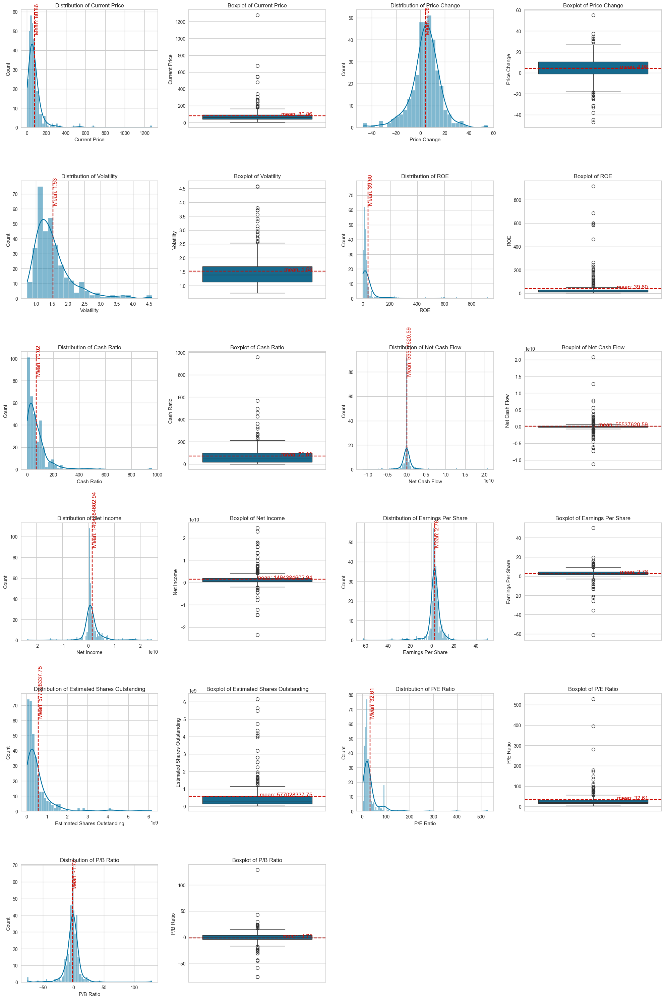

In [21]:
univariate_numerical(df)

**Notes**
* Price Change, Net Cash Flow, Net Income, Earnings Per Share, and P/B Ratio, are composed variables, having positive and negative values and  presenting a very similar to normal distribution, with outliers.
* Rest of variables presents a right skewed distribution, with outliers.
* **Answer1:** The variable "Current Price" presents a right skewed distribution, with outlies


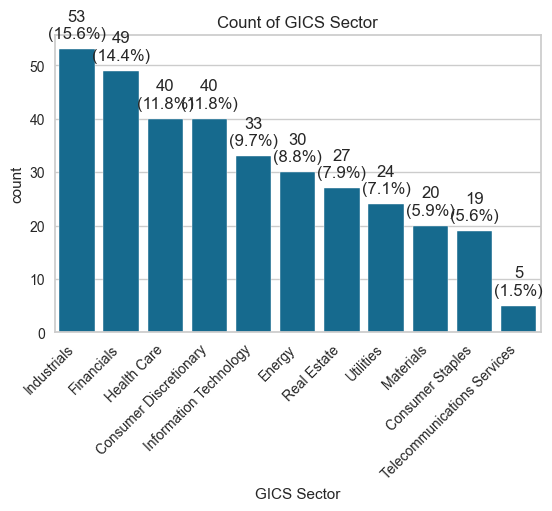

In [22]:
univariate_categorical(df.loc[:, df.columns == "GICS Sector"])

**Notes**
* The economic sector "Industrials" is represented by 53 companies (15.6%), followed by sectors "Financials" and "Healt Care" having 49 and 40 companies accordingly (14.4% and 11.8%).

### Bivariate Analysis

In [23]:
# Calculate correlation matrix
corr_matrix = df.corr()

In [24]:
# Display the sorted correlation table
corr_unstacked = corr_matrix.unstack() # Unstack the correlation matrix
corr_unstacked = corr_unstacked.reset_index() # Reset the index to get 'variable1' and 'variable2' as columns
corr_unstacked.columns = ['variable1', 'variable2', 'correlation']# Rename the columns for better understanding
corr_unstacked = corr_unstacked[corr_unstacked['variable1'] != corr_unstacked['variable2']] # Remove self-correlations by filtering out rows where variable1 == variable2
corr_unstacked = corr_unstacked.drop_duplicates(subset=['correlation']) # Drop duplicates to keep only one entry per variable pair
sorted_corr = corr_unstacked.sort_values(by='correlation', key=abs, ascending=False) # Sort the DataFrame by the absolute value of correlation

# Define a function to categorize the correlation level
def categorize_correlation(correlation):
    abs_corr = abs(correlation) * 100  # Convert to percentage for easier comparison
    if abs_corr < 30:
        return 'Negligible'
    elif 30 <= abs_corr < 50:
        return 'Low'
    elif 50 <= abs_corr < 70:
        return 'Moderate'
    elif 70 <= abs_corr < 90:
        return 'High'
    else:
        return 'Very High'

# Apply the function to create the corr_lvl column
sorted_corr['corr_lvl'] = sorted_corr['correlation'].apply(categorize_correlation)

In [25]:
sorted_corr['corr_lvl'].value_counts()

Negligible    48
Low            5
Moderate       2
Name: corr_lvl, dtype: int64

In [26]:
sorted_corr['corr_lvl'].value_counts(normalize=True)

Negligible   0.873
Low          0.091
Moderate     0.036
Name: corr_lvl, dtype: float64

**Notes**
* **Answer3:** The data variables mainly present a Negligible correlation (87.3% of the data pairs have a correlation less than 30%), with a pair of cases with Low (5/55) and Moderate (2/55) correlation (9.1% less than 50% and 3.6% less than 70%). There are no pairs of variables with High correlation (greater than 70%) nor pairs of variables with Very High correlation (greater than 90%).

In [27]:
def boxplot_by_group(df, group, var, outliers):
    # Calculate the average for the variable
    var_avg = df[var].mean()
    
    # Calculate variable mean per 'GICS Sector'
    var_means = df.groupby(group)[var].mean()
    
    # Sort by means and get the sorted order
    var_sorted = var_means.sort_values(ascending=False).index
    
    # Reorder the DataFrame by the sorted 'GICS Sector'
    df[group] = pd.Categorical(df[group], categories=var_sorted, ordered=True)
    
    # Create the boxplot with the reordered sectors
    ax = sns.boxplot(data=df, x=group, y=var, order=var_sorted, showfliers=outliers)
    
    # Add horizontal line for average variable value
    plt.axhline(var_avg, color='red', linestyle='--', label=f'Avg {var}: {var_avg:.2f}')
    
    # Scatter plot for means
    x_positions = range(len(var_means.sort_values(ascending=False)))
    plt.scatter(x=x_positions, y=var_means.sort_values(ascending=False), color='red', label='Mean', zorder=5)
    
    # Add labels to each red dot with the mean value
    for i, mean in enumerate(var_means.sort_values(ascending=False)):
        plt.text(i, mean, f'{mean:.2f}', color='red', ha='center', va='bottom')
    
    # Rotate x-axis labels
    plt.xticks(ticks=x_positions, labels=var_means.sort_values(ascending=False).index, rotation=90)
    
    # Add a legend
    plt.legend()
    plt.xlabel('')  # Remove x-axis title
    
    # Adjust layout
    plt.tight_layout()
    
    # Display the plot
    plt.show()


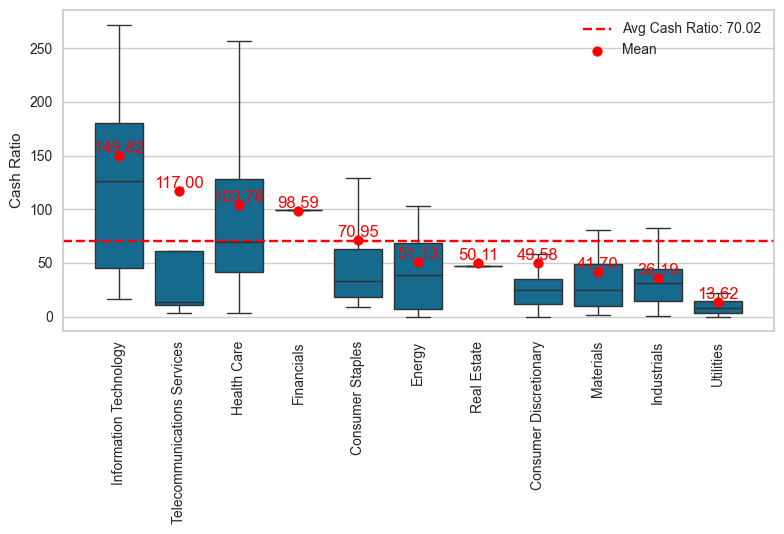

In [28]:
boxplot_by_group(df, 'GICS Sector', 'Cash Ratio',False)

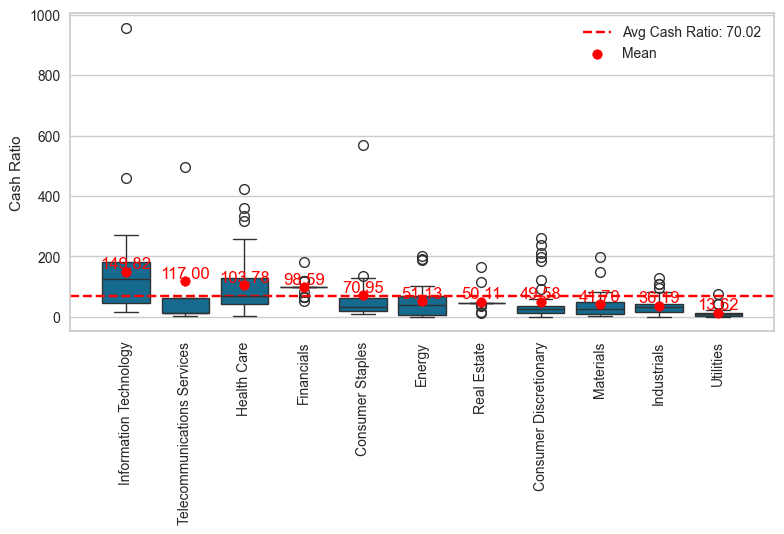

In [29]:
boxplot_by_group(df, 'GICS Sector', 'Cash Ratio',True)

In [30]:
#double-check the boxplot
df.groupby('GICS Sector')['Cash Ratio'].mean().sort_values(ascending=False)

GICS Sector
Information Technology        149.818
Telecommunications Services   117.000
Health Care                   103.775
Financials                     98.592
Consumer Staples               70.947
Energy                         51.133
Real Estate                    50.111
Consumer Discretionary         49.575
Materials                      41.700
Industrials                    36.189
Utilities                      13.625
Name: Cash Ratio, dtype: float64

In [31]:
#double-check the boxplot
df.groupby('GICS Sector')['Cash Ratio'].describe().sort_values(by='mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
GICS Sector,,,,,,,,
Information Technology,33.000,149.818,174.231,16.000,45.000,126.000,180.000,958.000
Telecommunications Services,5.000,117.000,213.083,3.000,11.000,14.000,61.000,496.000
Health Care,40.000,103.775,104.118,3.000,41.500,70.000,128.250,425.000
Financials,49.000,98.592,17.907,51.000,99.000,99.000,99.000,183.000
Consumer Staples,19.000,70.947,125.833,9.000,18.000,33.000,63.000,568.000
Energy,30.000,51.133,55.939,0.000,7.000,38.500,68.500,201.000
Real Estate,27.000,50.111,28.251,12.000,47.000,47.000,47.000,164.000
Consumer Discretionary,40.000,49.575,69.208,0.000,11.500,25.000,35.500,260.000
Materials,20.000,41.700,50.396,2.000,10.000,25.000,49.500,198.000


**Notes**
* Created function "boxplot_by_group()" to support bivariate analysis comparing stocks performance metrics by groups.

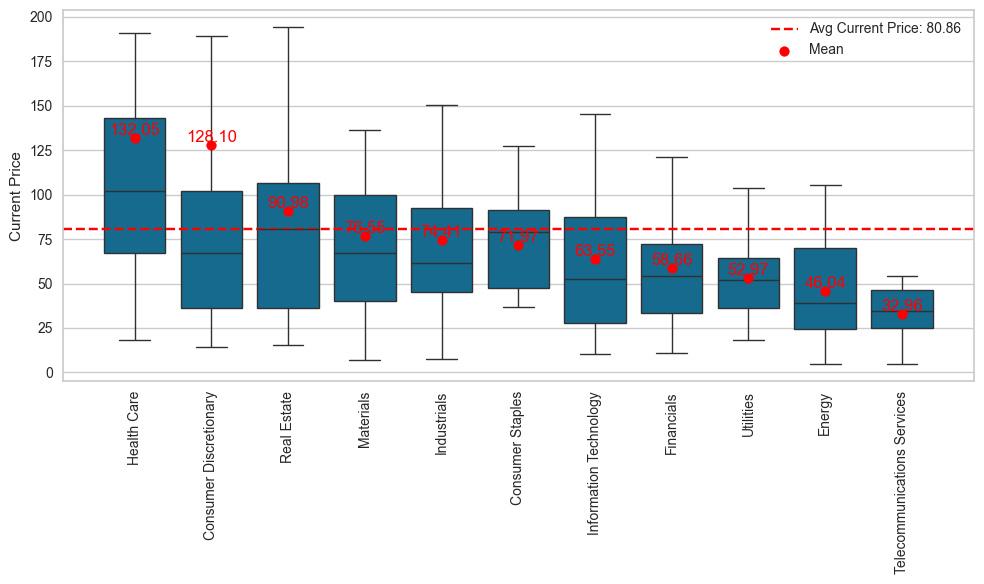

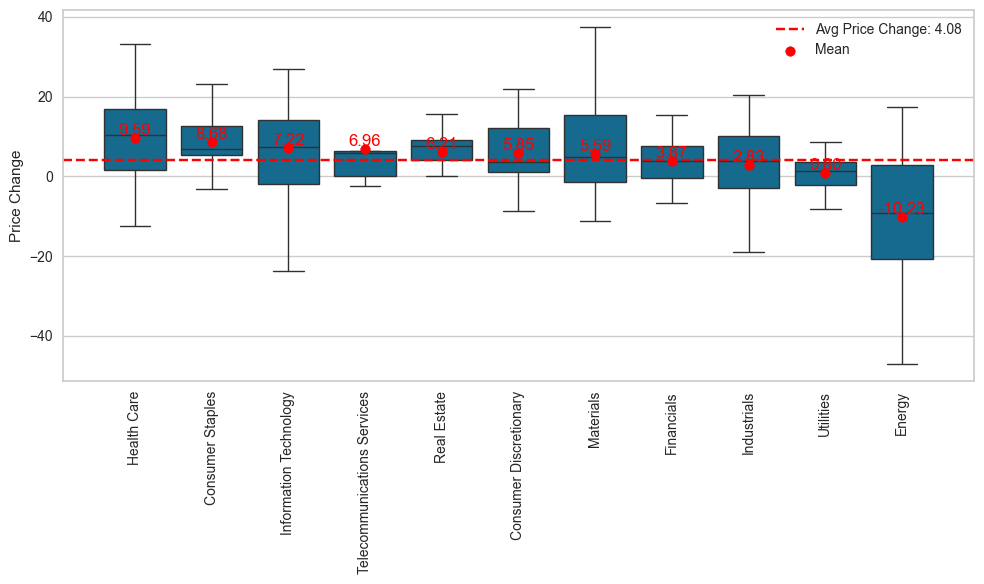

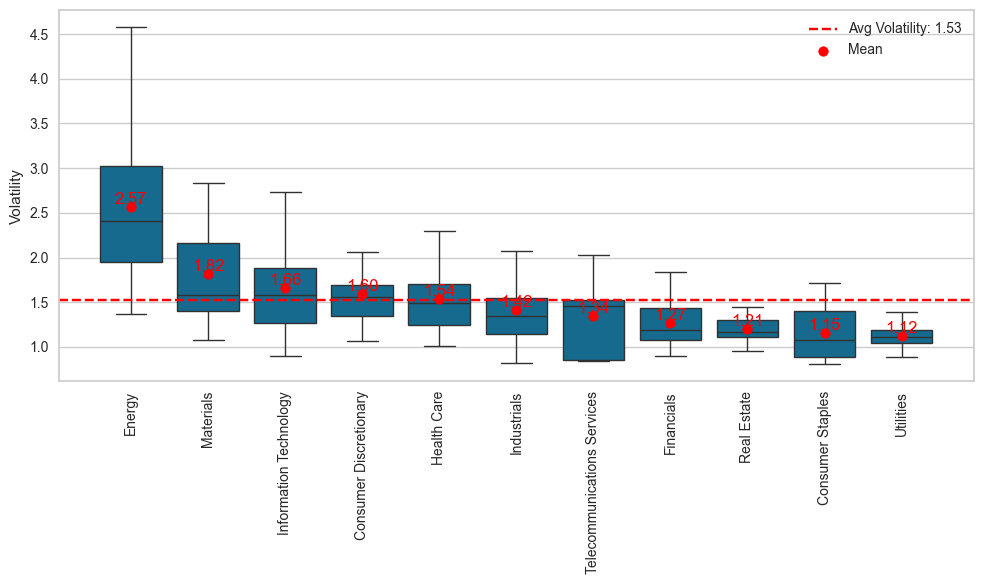

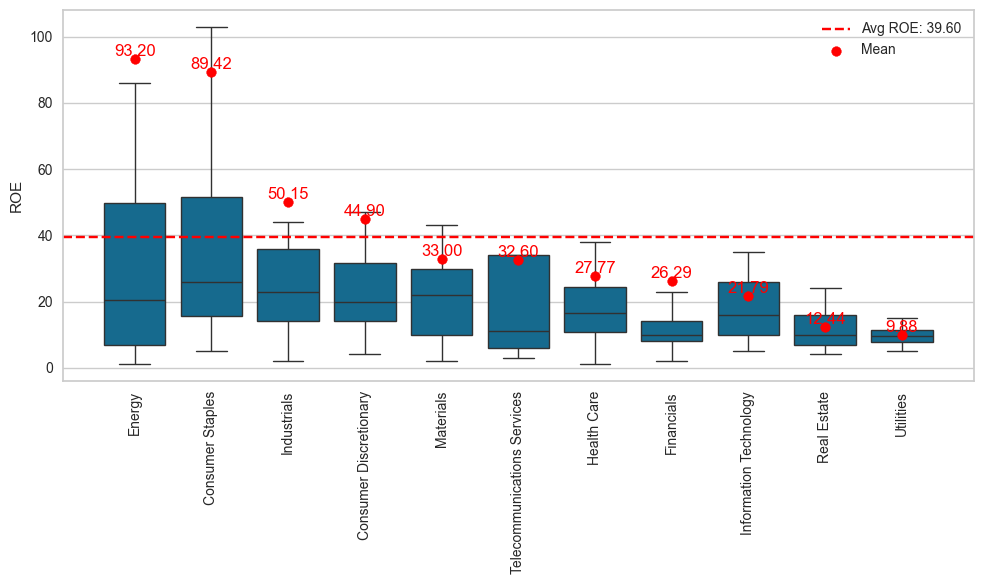

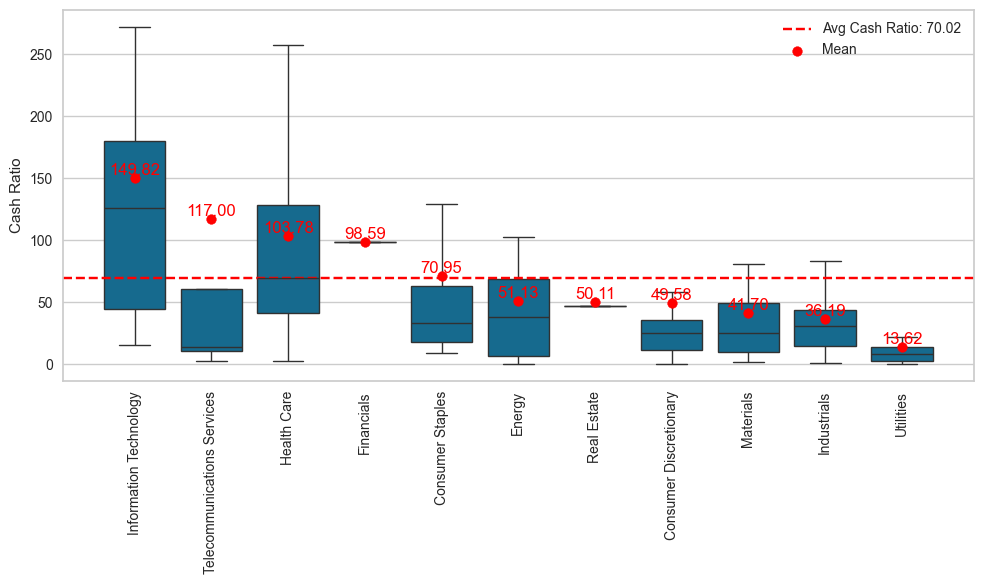

...

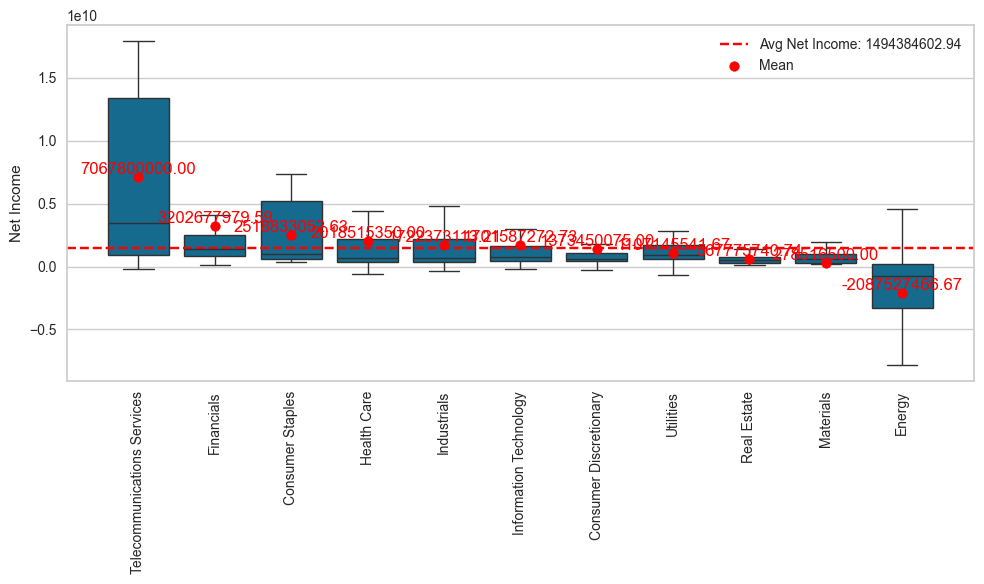

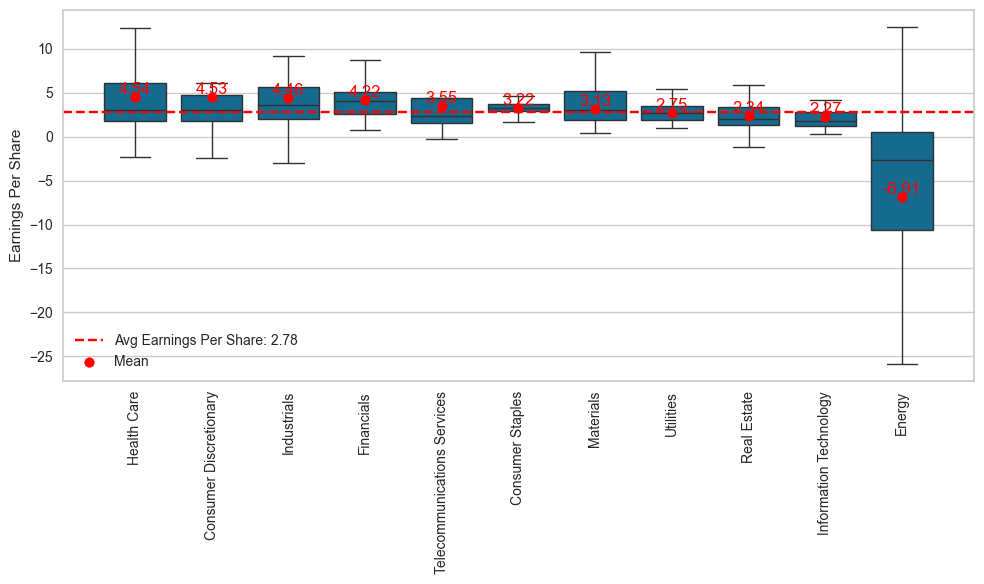

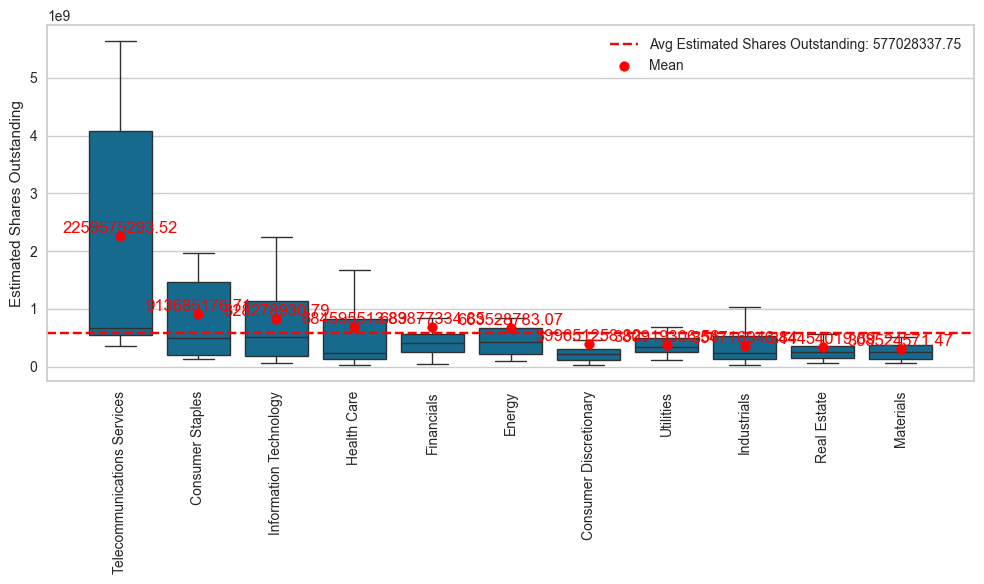

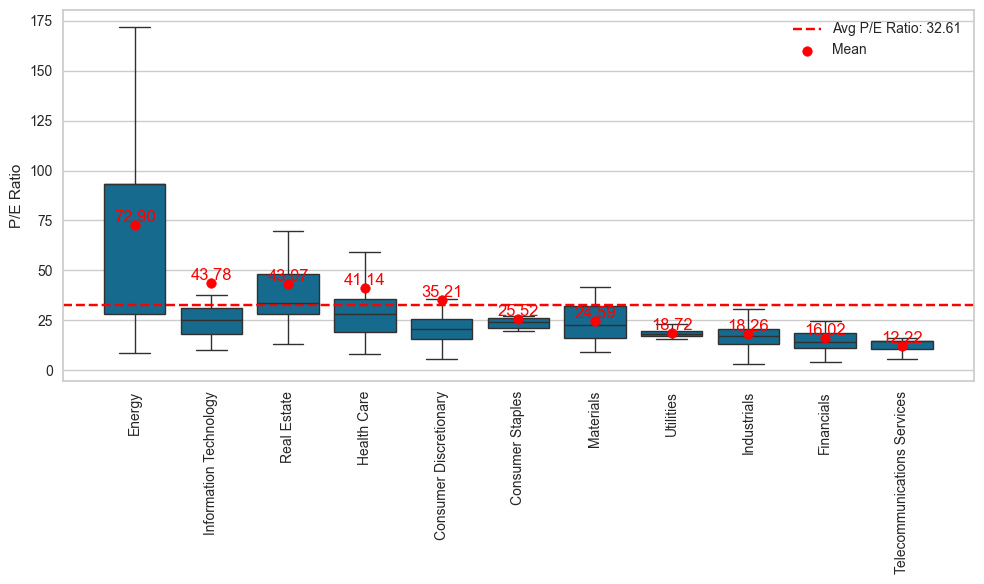

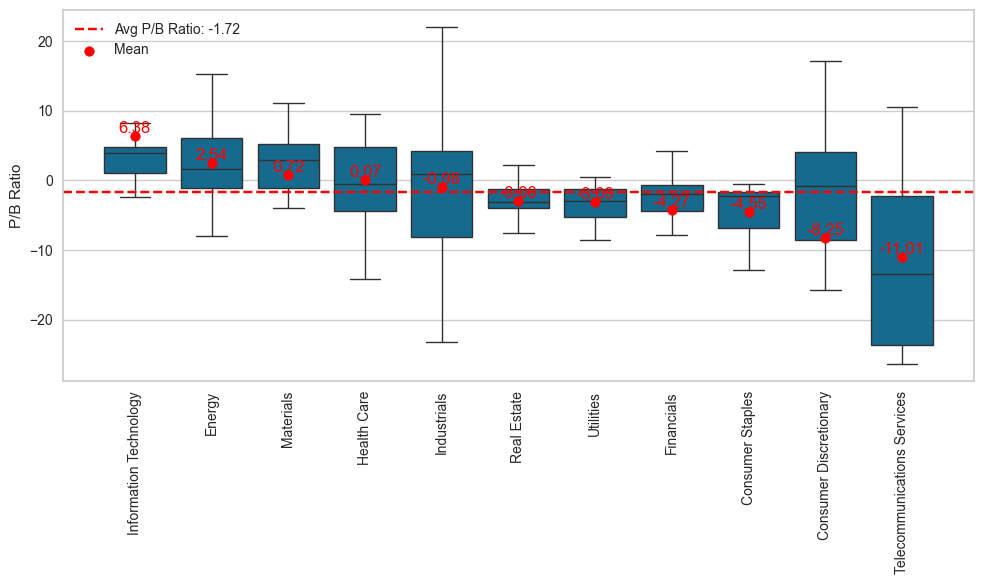

In [32]:
for i in num_cols:
    plt.figure(figsize=(10, 6))
    boxplot_by_group(df, 'GICS Sector', i, False)

**Notes**
* **Answer2:** The "Health Care" sector have seen the maximum price increase on average
* **Answer4:** 5 out of 11 sectors present an Avg Cash Ratio over the average. Infomation Technology presents the bigest avg Cash Ratio at 149.82 followed by Telecommunications Services, but those sectors average is influenced by outliers. The Health Care sector, having the third best avg Cash Ratio and have lower influence by outliers
* **Answer5:** Energy sector stands out over the rest with an average P/E Ratio close to twice all sectors average, while rest of the economic sectors present an average P/E Ratio close to all sectors average


In [33]:
def boxplot_by_label(df, column, label, outliers):
    
    df_category = df[df[column]==label]
    
    # Melt the dataframe to long format for easier plotting with seaborn
    df_category_melted = df_category.melt(id_vars=['Ticker Symbol'], value_vars=num_cols, var_name='Metrics', value_name='Value')
    
    # Create the boxplot
    sns.boxplot(x='Metrics', y='Value', data=df_category_melted, showfliers=outliers)
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.title(f'{label} Performance')
    plt.xlabel('')  # Remove x-axis title
    plt.show()
    #display(df_category_melted)

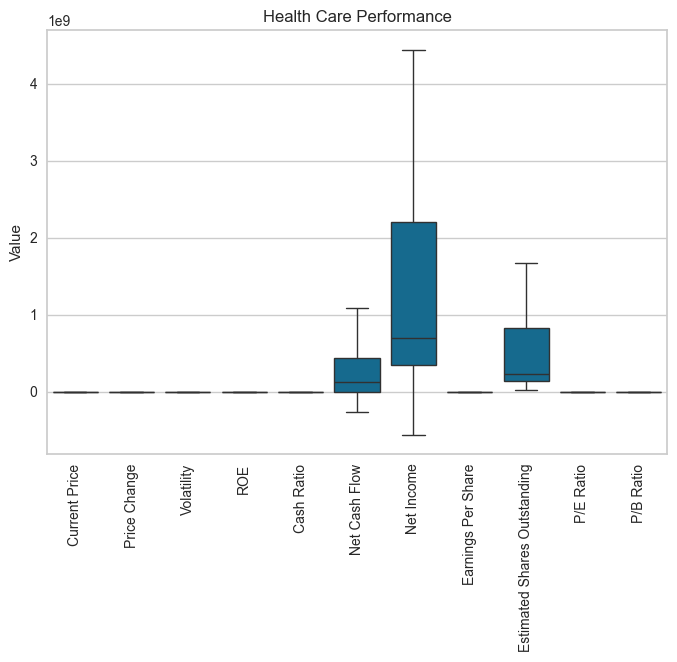

In [34]:
boxplot_by_label(df,'GICS Sector','Health Care', False)

**Notes**
* Created function "boxplot_by_label()" to support bivariate analysis comparing stocks performance metrics for a given label. Data transformed from a wide DataFrame into a long (or "tidy") format. This long format is useful to make a boxplot or other visualizations that need data to be grouped by categories.

In [35]:
df['GICS Sector'].unique()

['Industrials', 'Health Care', 'Information Technology', 'Consumer Staples', 'Utilities', ..., 'Real Estate', 'Materials', 'Consumer Discretionary', 'Energy', 'Telecommunications Services']
Length: 11
Categories (11, object): ['Information Technology' < 'Telecommunications Services' < 'Health Care' < 'Financials' ... 'Consumer Discretionary' < 'Materials' < 'Industrials' < 'Utilities']

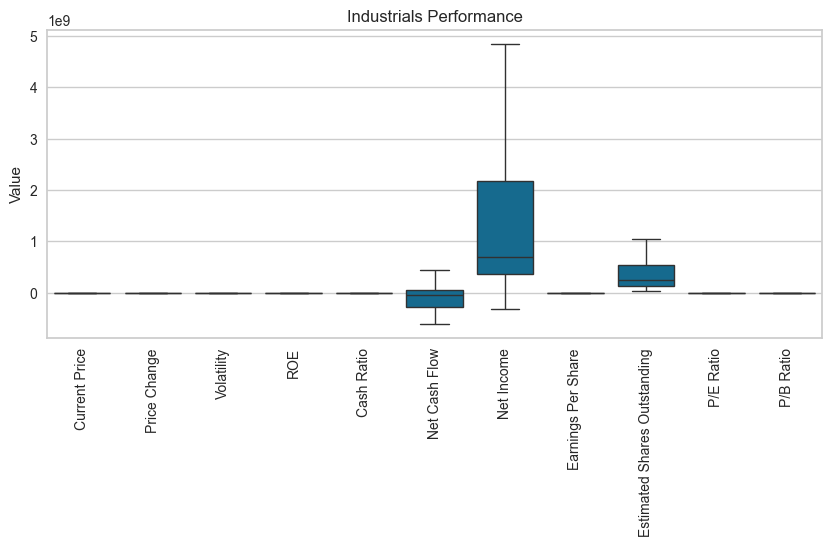

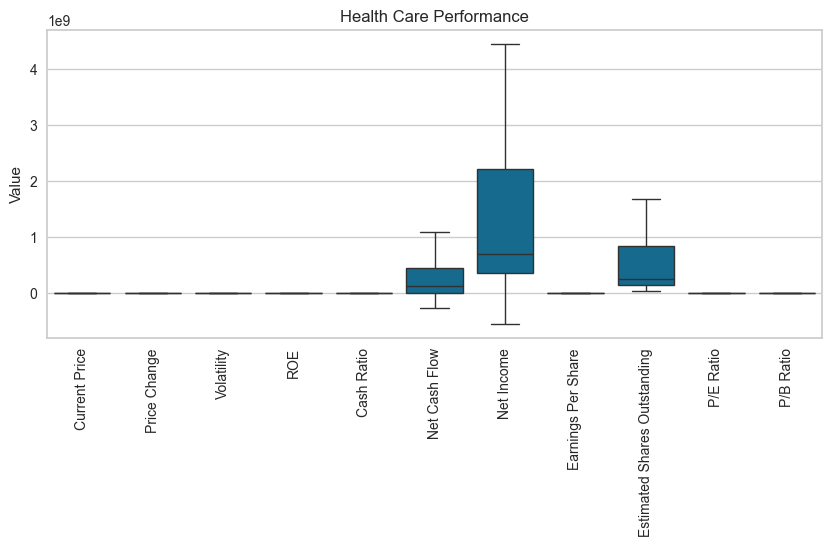

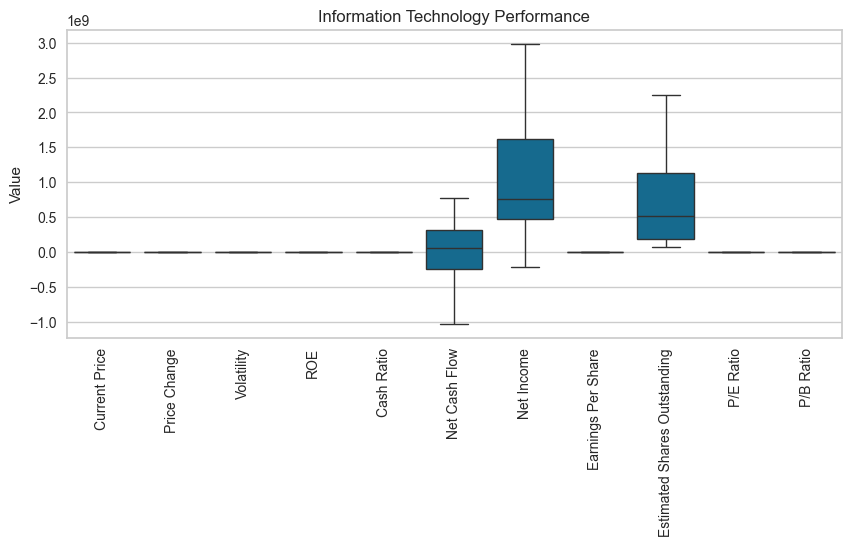

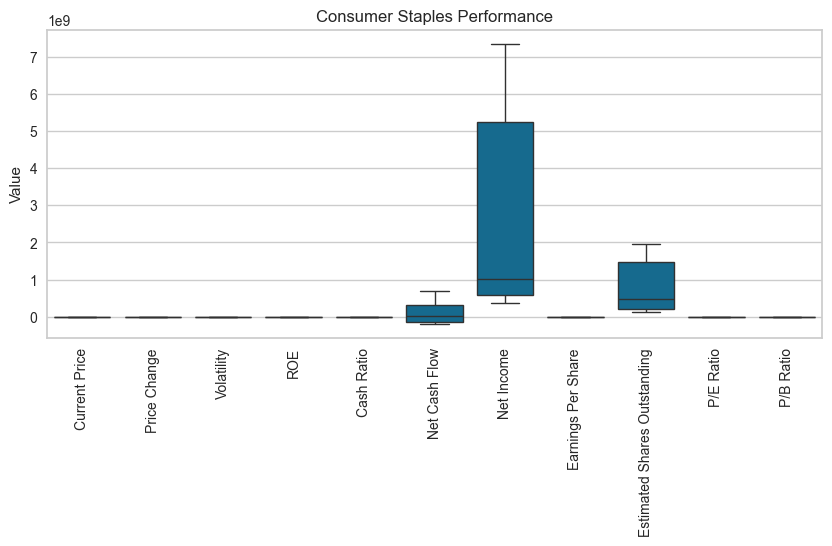

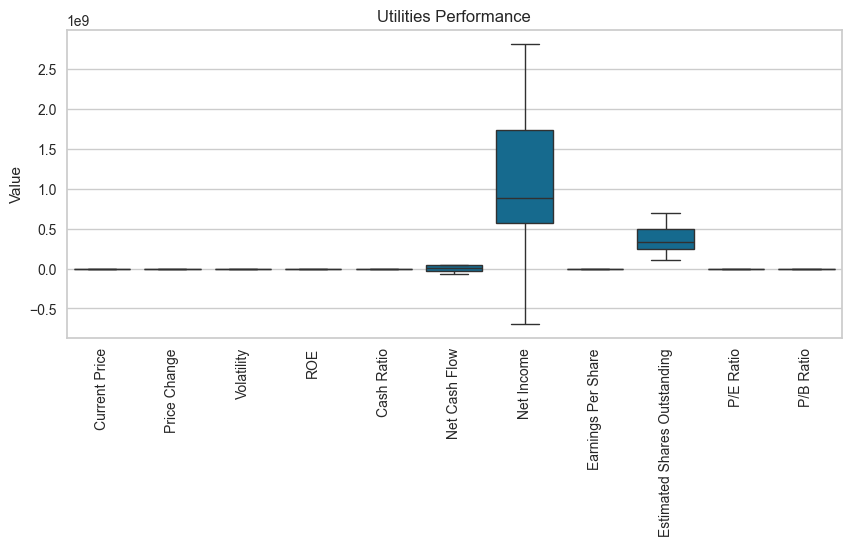

...

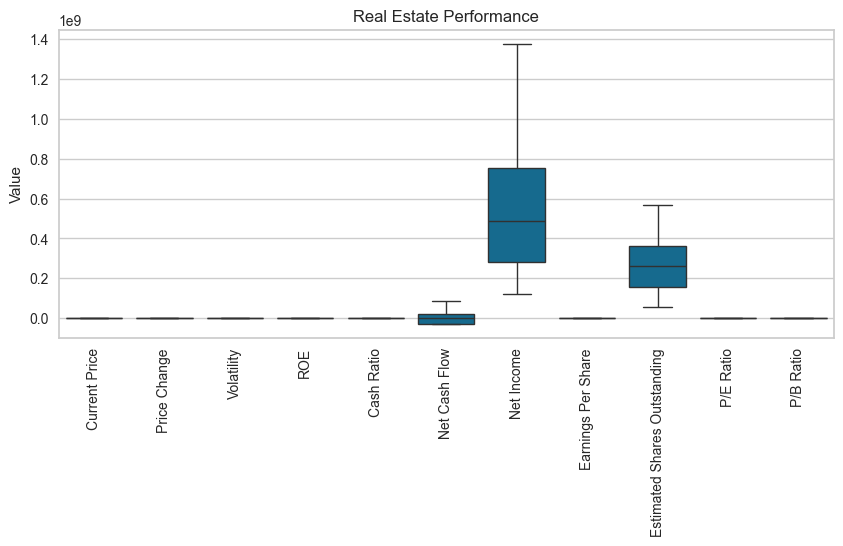

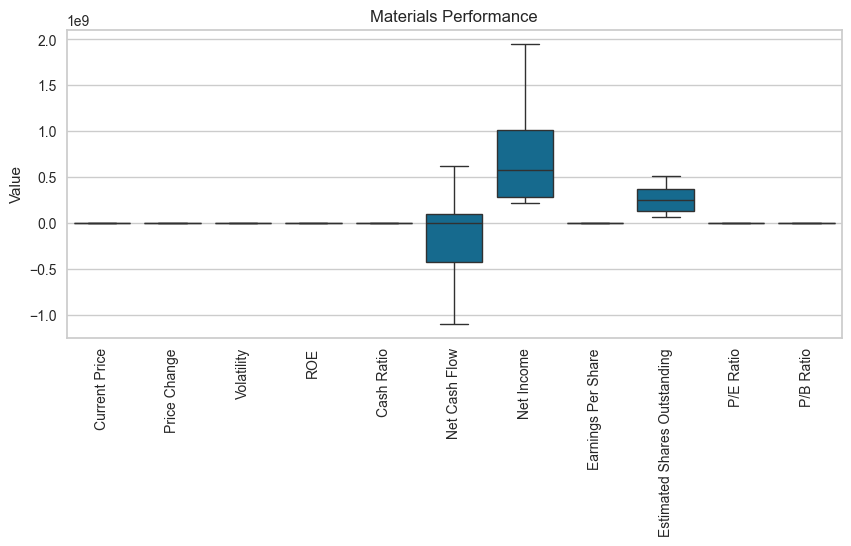

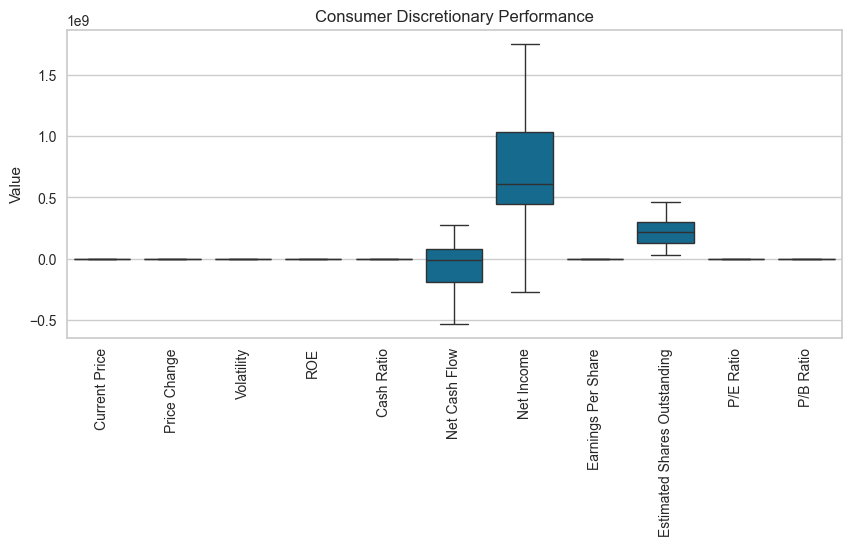

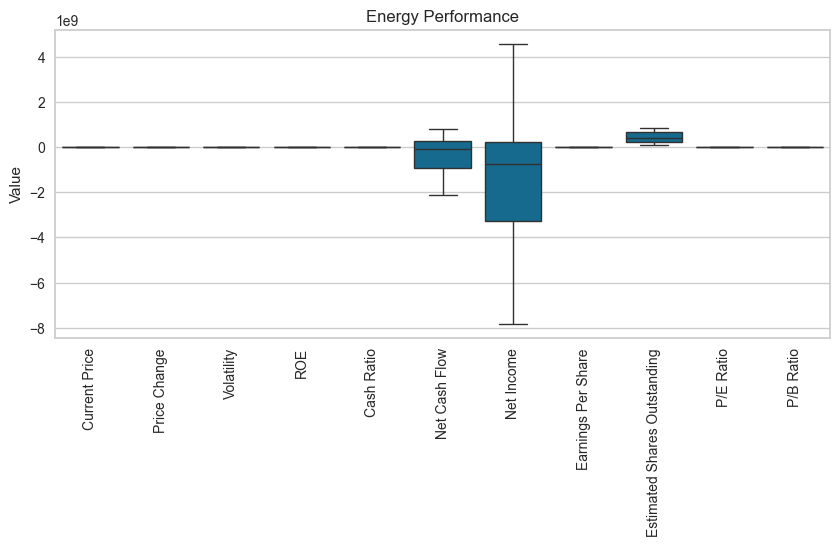

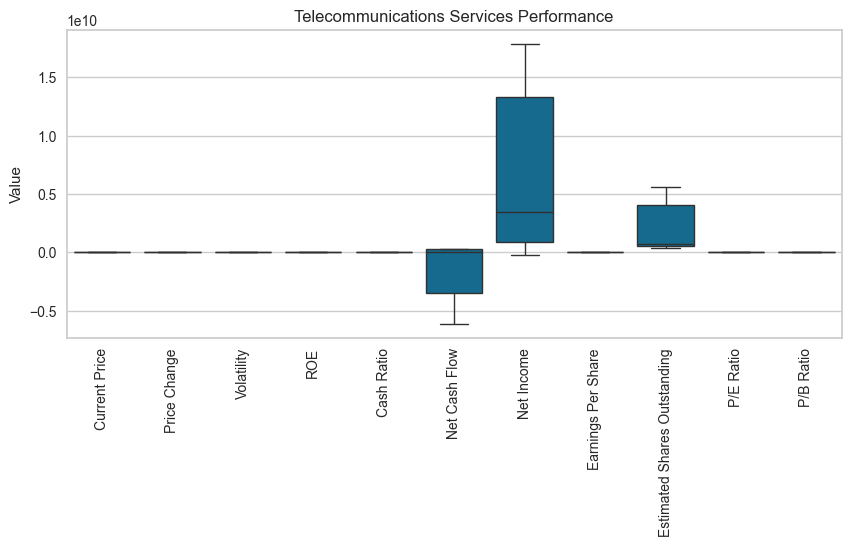

In [36]:
for label in df['GICS Sector'].unique():
    plt.figure(figsize=(10, 4))
    boxplot_by_label(df,'GICS Sector',label, False)

**Notes**
* boxplot_by_label() plots adds low value for bivariate analysis at this stage due diverse data scale ranges. Plots to be evaluated later with scaled data.


## Consolidated notes on Exploratory Data Analysis (EDA)

* Price Change, Net Cash Flow, Net Income, Earnings Per Share, and P/B Ratio, are composed variables, having positive and negative values and  presenting a very similar to normal distribution, with outliers.
* Rest of variables presents a right skewed distribution, with outliers.
* **Answer1:** The variable "Current Price" presents a right skewed distribution, with outliers
* The economic sector "Industrials" is represented by 53 companies (15.6%), followed by sectors "Financials" and "Healt Care" having 49 and 40 companies accordingly (14.4% and 11.8%).
* **Answer3:** The data variables mainly present a Negligible correlation (87.3% of the data pairs have a correlation less than 30%), with a pair of cases with Low (5/55) and Moderate (2/55) correlation (9.1% less than 50% and 3.6% less than 70%). There are no pairs of variables with High correlation (greater than 70%) nor pairs of variables with Very High correlation (greater than 90%).
* Created function "boxplot_by_group()" to support bivariate analysis comparing stocks performance metrics by groups.
* **Answer2:** The "Health Care" sector have seen the maximum price increase on average
* **Answer4:** 5 out of 11 sectors present an Avg Cash Ratio over the average. Infomation Technology presents the bigest avg Cash Ratio at 149.82 followed by Telecommunications Services, but those sectors average is influenced by outliers. The Health Care sector, having the third best avg Cash Ratio and have lower influence by outliers
* **Answer5:** Energy sector stands out over the rest with an average P/E Ratio close to twice all sectors average, while rest of the economic sectors present an average P/E Ratio close to all sectors average
* Created function "boxplot_by_label()" to support bivariate analysis comparing stocks performance metrics for a given label. Data transformed from a wide DataFrame into a long (or "tidy") format. This long format is useful to make a boxplot or other visualizations that need data to be grouped by categories.
* boxplot_by_label() plots adds low value for bivariate analysis at this stage due diverse data scale ranges. Plots to be evaluated later with scaled data.

**Questions and Answers:**

**Q1.** What does the distribution of stock prices look like?<br>
**A1.** The variable "Current Price" presents a right skewed distribution, with outliers.<br>

**Q2.** The stocks of which economic sector have seen the maximum price increase on average?<br>
**A2.** The "Health Care" sector have seen the maximum price increase on average<br>

**Q3.** How are the different variables correlated with each other?<br>
**A3.** The data variables mainly present a Negligible correlation (87.3% of the data pairs have a correlation less than 30%), with a five of cases with Low (9.1% less than 50%) and only 2 cases of Moderate correlation (3.6% less than 70%). There are no pairs of variables with High correlation (greater than 70%) nor pairs of variables with Very High correlation (greater than 90%).<br>

**Q4.** Cash ratio provides a measure of a company's ability to cover its short-term obligations using only cash and cash equivalents. How does the average cash ratio vary across economic sectors?<br>
**A4.** 5 out of 11 sectors present an Avg Cash Ratio over the average. Infomation Technology presents the bigest avg Cash Ratio at 149.82 followed by Telecommunications Services, but those sectors average is influenced by outliers. The Health Care sector, having the third best avg Cash Ratio and have lower influence by outliers.<br>

**Q5.** P/E ratios can help determine the relative value of a company's shares as they signify the amount of money an investor is willing to invest in a single share of a company per dollar of its earnings. How does the P/E ratio vary, on average, across economic sectors?<br>
**A5.** Energy sector stands out over the rest with an average P/E Ratio close to twice all sectors average, while rest of the economic sectors present an average P/E Ratio close to all sectors average.<br>

## Data Preprocessing

- Duplicate value check
- Missing value treatment
- Outlier check
- Feature engineering (if needed)
- Any other preprocessing steps (if needed)

In [37]:
df2=df.copy()

In [38]:
df2=df2.drop(columns=['Ticker Symbol', 'Security','GICS Sector','GICS Sub Industry'])
df2.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,42.350,10.000,1.687,135,51,-604000000,7610000000,11.390,668129938.500,3.718,-8.784
1,59.240,8.339,2.198,130,77,51000000,5144000000,3.150,1633015873.000,18.806,-8.750
2,44.910,11.301,1.274,21,67,938000000,4423000000,2.940,1504421769.000,15.276,-0.394
3,93.940,13.977,1.358,9,180,-240840000,629551000,1.260,499643650.800,74.556,4.200
4,55.320,-1.828,1.701,14,272,315120000,696878000,0.310,2247993548.000,178.452,1.060


In [39]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Current Price                 340 non-null    float64
 1   Price Change                  340 non-null    float64
 2   Volatility                    340 non-null    float64
 3   ROE                           340 non-null    int64  
 4   Cash Ratio                    340 non-null    int64  
 5   Net Cash Flow                 340 non-null    int64  
 6   Net Income                    340 non-null    int64  
 7   Earnings Per Share            340 non-null    float64
 8   Estimated Shares Outstanding  340 non-null    float64
 9   P/E Ratio                     340 non-null    float64
 10  P/B Ratio                     340 non-null    float64
dtypes: float64(7), int64(4)
memory usage: 29.3 KB


In [40]:
# scaling the dataset before clustering
scaler = StandardScaler()
df2_scaled = scaler.fit_transform(df2)
df2_scaled = pd.DataFrame(df2_scaled, columns=df2.columns)
df2_scaled


,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
0,-0.393,0.494,0.273,0.990,-0.211,-0.339,1.554,1.309,0.108,-0.652,-0.507
1,-0.221,0.355,1.137,0.938,0.077,-0.002,0.928,0.057,1.250,-0.312,-0.504
2,-0.367,0.602,-0.427,-0.193,-0.033,0.454,0.744,0.025,1.098,-0.392,0.095
3,0.134,0.826,-0.285,-0.317,1.218,-0.152,-0.220,-0.231,-0.092,0.947,0.424
4,-0.261,-0.493,0.296,-0.266,2.237,0.134,-0.203,-0.375,1.978,3.293,0.199
...,...,...,...,...,...,...,...,...,...,...,...
335,-0.486,0.902,0.540,-0.255,4.308,-0.560,-1.488,-1.127,0.429,-0.082,0.572
336,-0.290,-1.066,-0.080,1.062,-0.477,0.053,-0.051,0.029,-0.168,-0.337,-0.152
337,0.222,0.440,-0.206,-0.400,0.332,0.165,-0.342,-0.304,-0.460,2.234,-1.589
338,-0.547,-0.437,-0.098,-0.369,0.321,-0.051,-0.301,-0.240,-0.378,-0.223,0.119


## Consolidated notes on Data Preprocessing

* Preprocessing on a copy of the original data frame
* Removed variables 'Stock symbol' and 'Security', related to the unique identification of the observation
* Removed categorical variables 'GICS Sector' and 'GICS Subindustry'
* Scaled data for better algorithm performance, avoiding biased results

## Preprocessing EDA

- It is a good idea to explore the data once again after manipulating it.

In [41]:
df2_scaled.sample(10)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio
217,0.412,-0.370,-0.246,-0.338,0.321,-0.031,-0.105,0.675,-0.506,-0.357,0.056
53,-0.132,-0.044,-0.055,-0.234,-0.499,-0.482,0.259,0.116,0.157,-0.303,0.572
19,1.122,1.523,0.841,-0.390,1.384,0.005,-0.343,-0.319,-0.432,5.598,-0.893
75,-0.089,-0.392,-0.273,-0.317,0.321,0.373,0.650,0.665,-0.013,-0.508,0.071
16,-0.004,-0.168,0.419,-0.048,0.044,-0.046,-0.164,0.583,-0.531,-0.461,0.043
25,0.164,0.513,-0.610,-0.307,-0.344,-0.025,-0.206,-0.206,-0.112,0.805,-1.369
170,-0.550,-1.430,-0.380,-0.162,-0.609,-0.027,-0.349,-0.334,-0.432,0.315,-0.075
142,-0.479,0.684,-0.307,-0.162,-0.410,-2.013,2.082,0.507,1.194,-0.611,-0.228
303,0.395,-0.769,0.885,-0.245,-0.709,-0.014,-0.207,0.625,-0.566,-0.345,0.572
222,-0.490,0.269,1.664,-0.162,-0.144,-0.108,-1.000,-1.345,-0.207,1.366,0.207


In [42]:
print("There are", df2_scaled.shape[0], 'rows and', df2_scaled.shape[1], "columns.") # number of observations and features

There are 340 rows and 11 columns.


In [43]:
df2_scaled.duplicated().sum()

0

In [44]:
df2_scaled.isnull().sum()

Current Price                   0
Price Change                    0
Volatility                      0
ROE                             0
Cash Ratio                      0
Net Cash Flow                   0
Net Income                      0
Earnings Per Share              0
Estimated Shares Outstanding    0
P/E Ratio                       0
P/B Ratio                       0
dtype: int64

In [45]:
df2_scaled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 340 entries, 0 to 339
Data columns (total 11 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Current Price                 340 non-null    float64
 1   Price Change                  340 non-null    float64
 2   Volatility                    340 non-null    float64
 3   ROE                           340 non-null    float64
 4   Cash Ratio                    340 non-null    float64
 5   Net Cash Flow                 340 non-null    float64
 6   Net Income                    340 non-null    float64
 7   Earnings Per Share            340 non-null    float64
 8   Estimated Shares Outstanding  340 non-null    float64
 9   P/E Ratio                     340 non-null    float64
 10  P/B Ratio                     340 non-null    float64
dtypes: float64(11)
memory usage: 29.3 KB


**Notes**
* There are 340 rows and 11 columns
* There are no duplicated, nor missing value



In [46]:
df2_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Current Price,340.000,0.000,1.001,-0.780,-0.432,-0.216,0.123,12.196
Price Change,340.000,-0.000,1.001,-4.271,-0.419,0.062,0.552,4.252
Volatility,340.000,-0.000,1.001,-1.342,-0.662,-0.238,0.287,5.168
ROE,340.000,0.000,1.001,-0.400,-0.310,-0.255,-0.131,9.101
Cash Ratio,340.000,-0.000,1.001,-0.776,-0.576,-0.255,0.321,9.835
Net Cash Flow,340.000,0.000,1.001,-5.795,-0.128,-0.027,0.059,10.655
Net Income,340.000,0.000,1.001,-6.360,-0.290,-0.200,0.103,5.833
Earnings Per Share,340.000,0.000,1.001,-9.726,-0.185,0.018,0.280,7.193
Estimated Shares Outstanding,340.000,-0.000,1.001,-0.650,-0.495,-0.317,-0.005,6.609
P/E Ratio,340.000,0.000,1.001,-0.670,-0.397,-0.266,-0.019,11.188


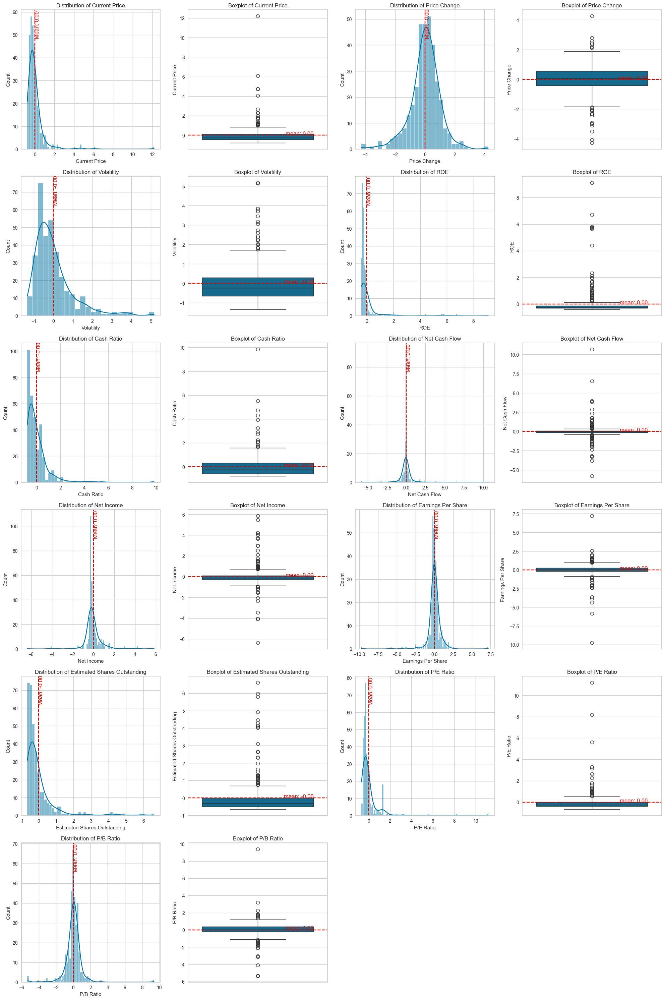

In [47]:
univariate_numerical(df2_scaled)

**Notes**
* All variables scaled (mean=0 and std=1)


In [48]:
# Check Outliers
outlier_data = []

# Collect the outliers and their percentages
for column in df2_scaled.select_dtypes(include=np.number).columns:
    outliers = len(df2_scaled[
        (df2_scaled[column] < df2_scaled[column].quantile(0.25) - 1.5 * (df2_scaled[column].quantile(0.75) - df2_scaled[column].quantile(0.25))) | 
        (df2_scaled[column] > df2_scaled[column].quantile(0.75) + 1.5 * (df2_scaled[column].quantile(0.75) - df2_scaled[column].quantile(0.25)))
    ][column])
    
    percentage = (outliers / df2_scaled.shape[0]) * 100
    outlier_data.append((column, outliers, percentage))

# Sort the data by percentage in descending order
outlier_data=pd.DataFrame(outlier_data,columns=('column', 'outliers', 'percentage')).sort_values(by='percentage',ascending=False)
outlier_data

    

,column,outliers,percentage
5,Net Cash Flow,76,22.353
6,Net Income,57,16.765
9,P/E Ratio,41,12.059
3,ROE,39,11.471
7,Earnings Per Share,39,11.471
8,Estimated Shares Outstanding,35,10.294
10,P/B Ratio,30,8.824
1,Price Change,23,6.765
0,Current Price,22,6.471
2,Volatility,20,5.882


**Notes**
* The variable Net Cash Flow present most outliers with 76 (22.35%) folowed by Net Income with 57 (16.76%). Four variables around 10% and five variables under 10% of outliers samples. In all cases, outliers are considered natural to the data and not to be treated.

In [49]:
df3=df2_scaled.copy()
df3['Ticker Symbol']=df['Ticker Symbol'].values
df3['Security']=df['Security'].values
df3['GICS Sector']=df['GICS Sector'].values
df3['GICS Sub Industry']=df['GICS Sub Industry'].values

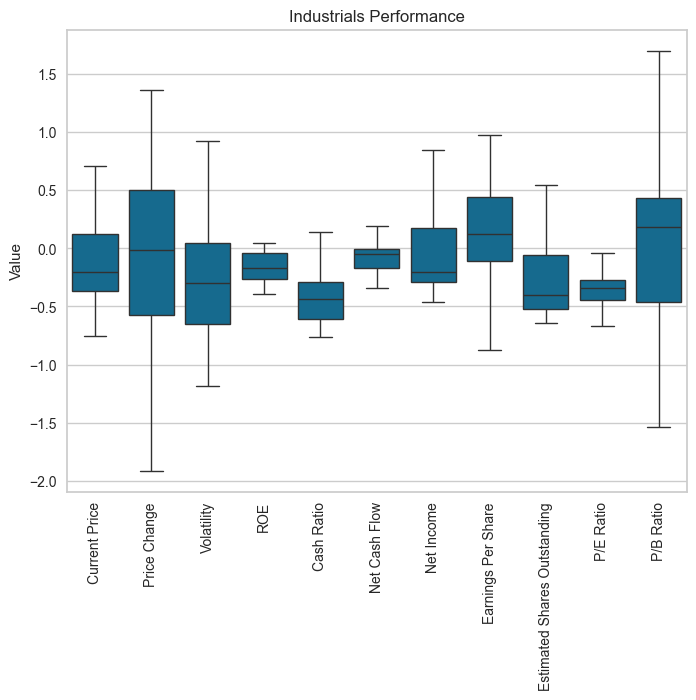

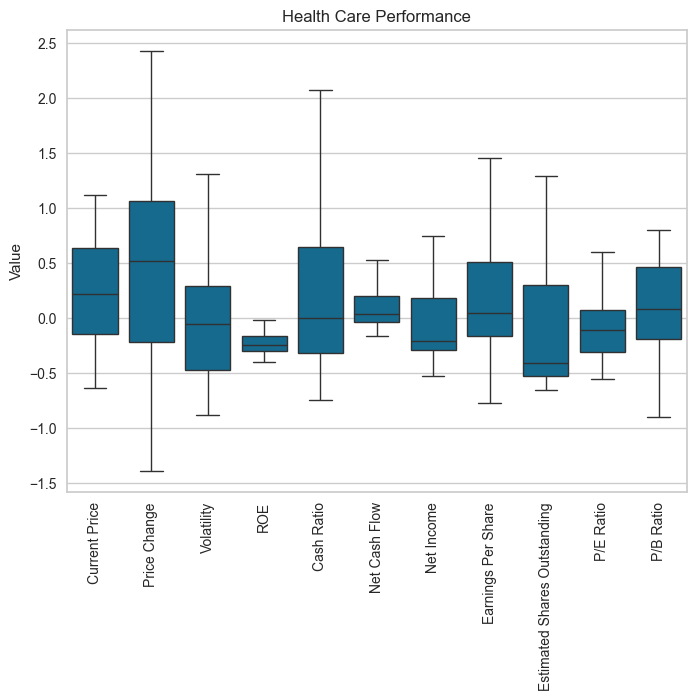

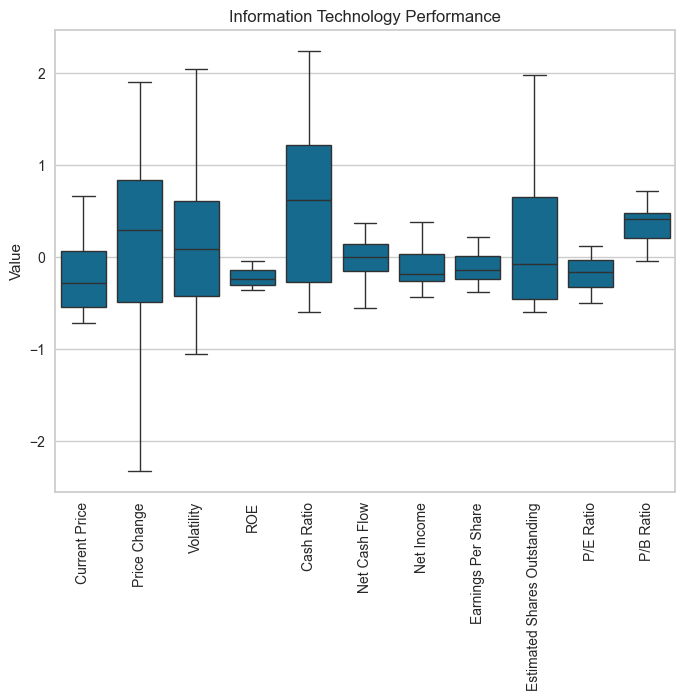

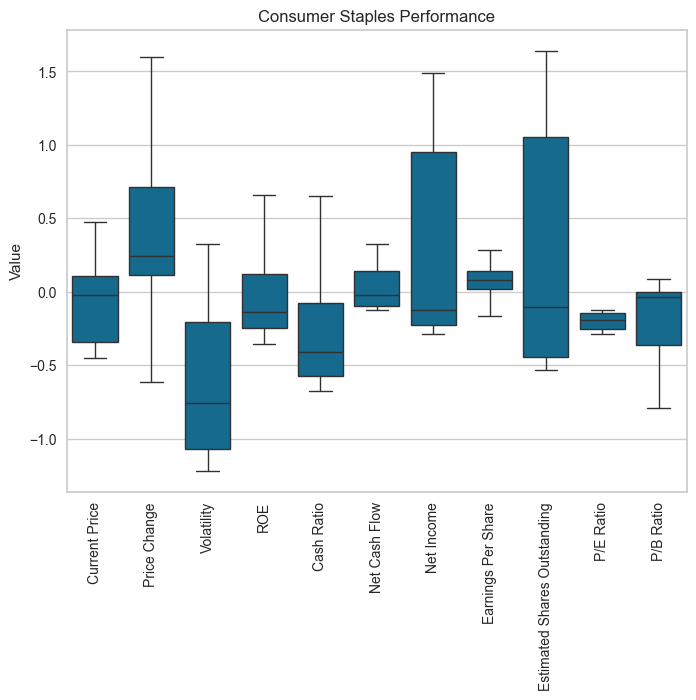

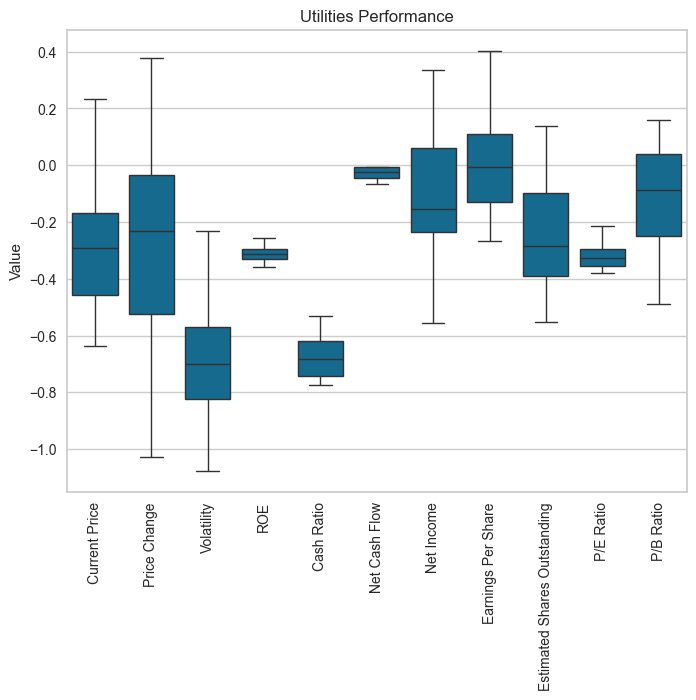

...

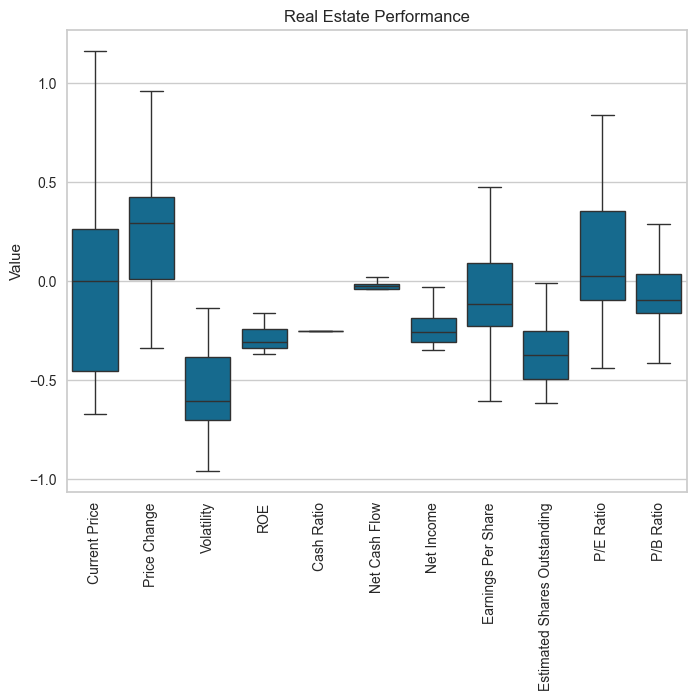

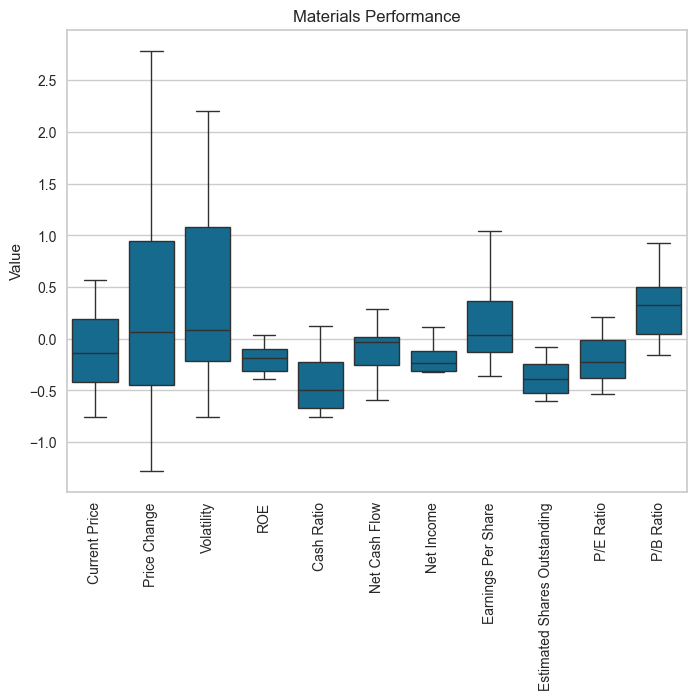

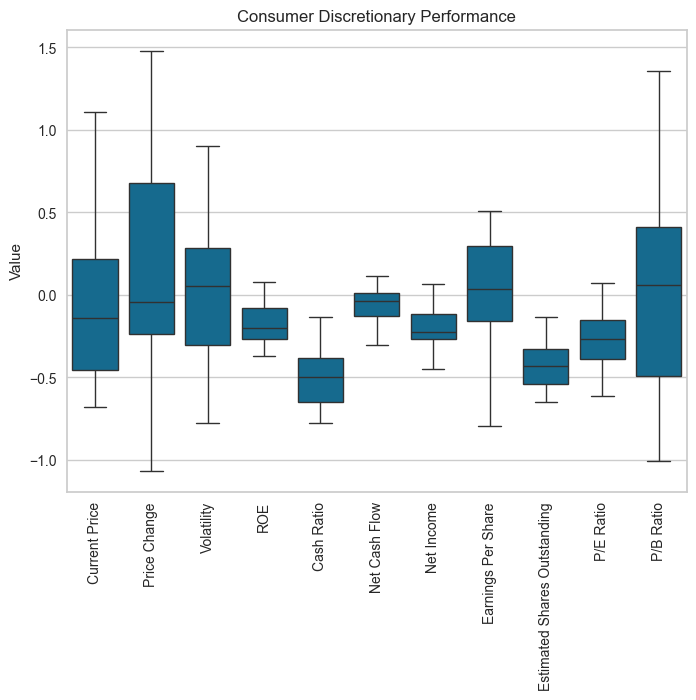

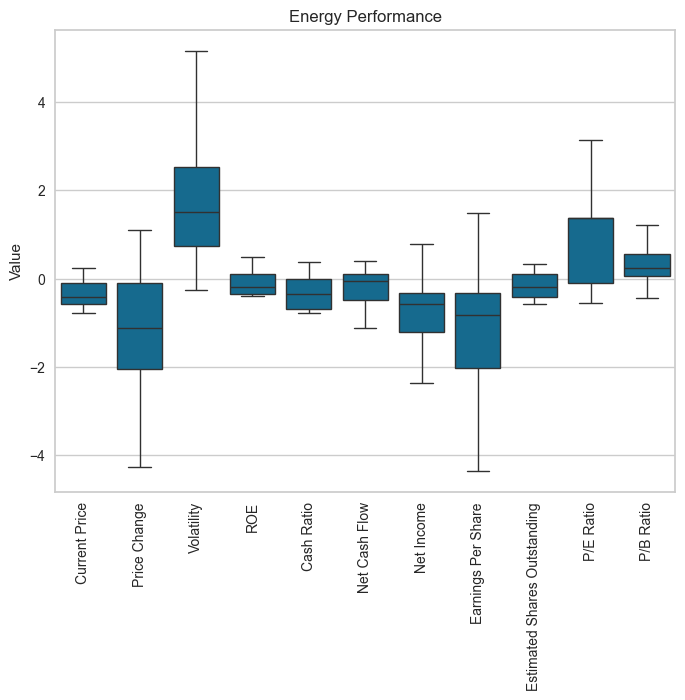

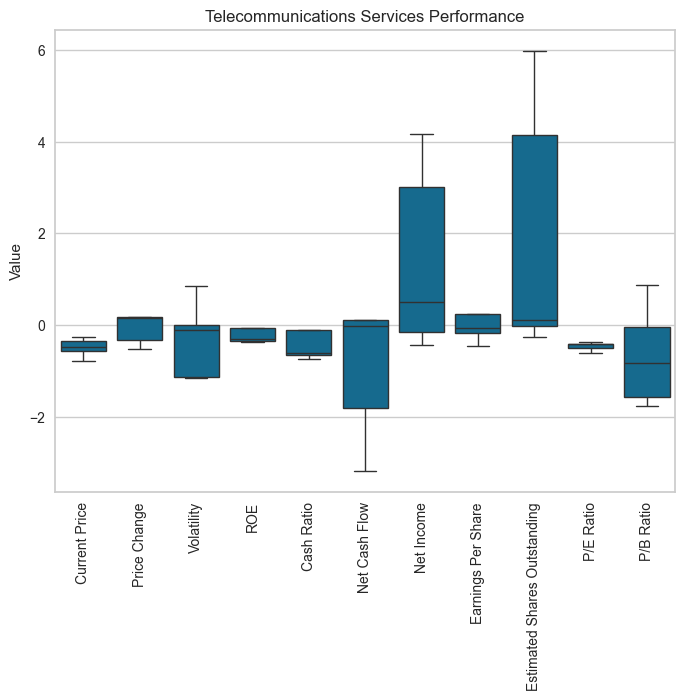

In [50]:
for label in df['GICS Sector'].unique():
    plt.figure(figsize=(8, 6))
    boxplot_by_label(df3,'GICS Sector',label, False)

**Notes**
* Scaled boxplot_by_label charts allow for better interpretation. Some sectors seem to perform better overall with most metrics in a positive range of values, such as healthcare.
* boxplot_by_label charts might represent clustering, where grouping based on a predefined category,  the economic sector.
* However, grouping by economic sector is more a filter rather than clustering.  Clustering techniques like K-Means and Hierarchical Clustering will lead to the definition of customized investment strategies, by grouping based on financial metrics, where stocks sharing similar performance,will be grouped together regardless of their predefined categories.

## Consolidated notes on Preprocessing EDA

* There are 340 rows and 11 columns
* There are no duplicated, nor missing values
* All variables scaled (mean=0 and std=1)
* The variable Net Cash Flow present most outliers with 76 (22.35%) folowed by Net Income with 57 (16.76%). Four variables around 10% and five variables under 10% of outliers samples. In all cases, outliers are considered natural to the data and not to be treated.
* Scaled boxplot_by_label charts allow for better interpretation. Some sectors seem to perform better overall with most metrics in a positive range of values, such as healthcare.
* boxplot_by_label charts might represent clustering, where grouping based on a predefined category,  the economic sector.
* However, grouping by economic sector is more a filter rather than clustering.  Clustering techniques like K-Means and Hierarchical Clustering will lead to the definition of customized investment strategies, by grouping based on financial metrics, where stocks sharing similar performance,will be grouped together regardless of their predefined categories.

## K-means Clustering

### Clustering metrics_Inertia (Distorcion)

Inertia (Distorcion) for 1 clusters: 3740.00
Inertia (Distorcion) for 2 clusters: 3252.05
Inertia (Distorcion) for 3 clusters: 2896.54
Inertia (Distorcion) for 4 clusters: 2609.70
Inertia (Distorcion) for 5 clusters: 2411.91
Inertia (Distorcion) for 6 clusters: 2211.52
Inertia (Distorcion) for 7 clusters: 2034.33
Inertia (Distorcion) for 8 clusters: 1875.45
Inertia (Distorcion) for 9 clusters: 1738.42
Inertia (Distorcion) for 10 clusters: 1615.04
Inertia (Distorcion) for 11 clusters: 1522.24
Inertia (Distorcion) for 12 clusters: 1474.94
Inertia (Distorcion) for 13 clusters: 1341.58
Inertia (Distorcion) for 14 clusters: 1279.70
Inertia (Distorcion) for 15 clusters: 1238.83
Inertia (Distorcion) for 16 clusters: 1154.58
Inertia (Distorcion) for 17 clusters: 1154.95
Inertia (Distorcion) for 18 clusters: 1077.11
Inertia (Distorcion) for 19 clusters: 1072.82


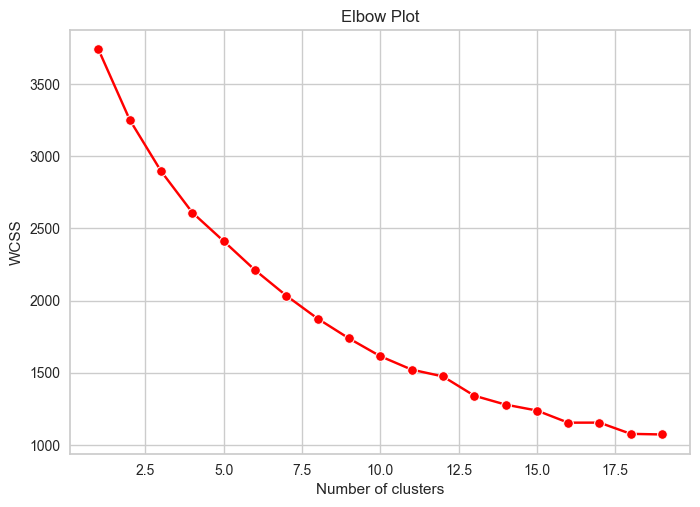

In [51]:
# Within Cluster Sum of Sqares
wcss = []

for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 1)
    kmeans.fit(df2_scaled)
    # inertia method returns wcss for that model
    wcss.append(kmeans.inertia_)
    print(f"Inertia (Distorcion) for {i} clusters: {kmeans.inertia_:.2f}")
    
sns.lineplot(x=range(1, 20), y=wcss,marker='o',color='red')
plt.title('Elbow Plot')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

**Notes**
* From Elbow Plot, there is no predominant angle to define any specific number of clusters

### Clustering metrics_Dunn Index

In [52]:
def dunn_index(data, labels):
    # Calculate unique clusters
    unique_clusters = np.unique(labels)
    
    # Initialize the minimum inter-cluster distance to a very large value
    min_intercluster_dist = np.inf
    
    # Initialize the maximum intra-cluster distance to zero
    max_intracluster_dist = 0
    
    for i in range(len(unique_clusters)):
        # Get data points in the current cluster
        cluster_i = data[labels == unique_clusters[i]]
        
        # Calculate the intra-cluster distances for the current cluster
        intra_dists = cdist(cluster_i, cluster_i, metric='euclidean')
        if len(intra_dists) > 0:
            max_intracluster_dist = max(max_intracluster_dist, np.max(intra_dists))
        
        for j in range(i + 1, len(unique_clusters)):
            # Get data points in the other cluster
            cluster_j = data[labels == unique_clusters[j]]
            
            # Calculate the inter-cluster distance between cluster_i and cluster_j
            inter_dists = cdist(cluster_i, cluster_j, metric='euclidean')
            if len(inter_dists) > 0:
                min_intercluster_dist = min(min_intercluster_dist, np.min(inter_dists))
    
    # Calculate the Dunn index
    dunn = min_intercluster_dist / max_intracluster_dist
    return dunn

Dunn Index for 2 clusters: 0.05180711888658587
Dunn Index for 3 clusters: 0.05180711888658587
Dunn Index for 4 clusters: 0.05184975042000421
Dunn Index for 5 clusters: 0.06392614703147656
Dunn Index for 6 clusters: 0.04852250970872233
Dunn Index for 7 clusters: 0.07064021535050011
Dunn Index for 8 clusters: 0.07064021535050011
Dunn Index for 9 clusters: 0.07602991101918387
Dunn Index for 10 clusters: 0.030314327105734933
Dunn Index for 11 clusters: 0.025298580651678892
Dunn Index for 12 clusters: 0.06189193898904009
Dunn Index for 13 clusters: 0.038797892432926764
Dunn Index for 14 clusters: 0.048912897604091655
Dunn Index for 15 clusters: 0.04153973994469262
Dunn Index for 16 clusters: 0.05952861293950879
Dunn Index for 17 clusters: 0.054973394890523684
Dunn Index for 18 clusters: 0.06372880729013564
Dunn Index for 19 clusters: 0.07382281212318696


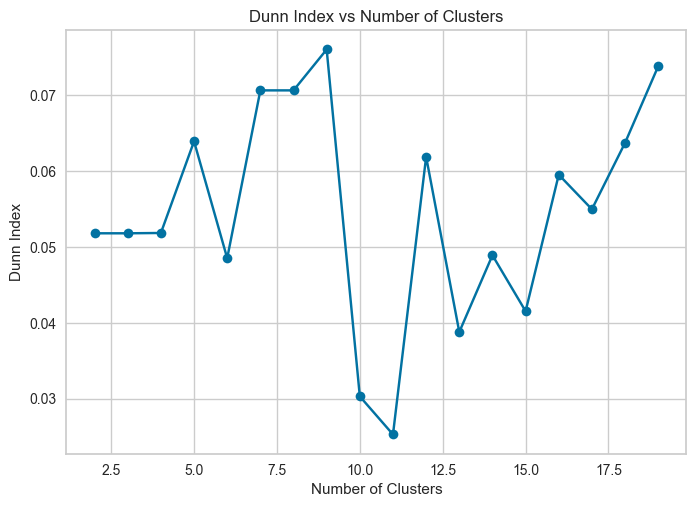

In [53]:
dunn_score = []
cluster_list = list(range(2, 20))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((df2_scaled))
    score = dunn_index(df2_scaled, preds)
    dunn_score.append(score)
    print(f"Dunn Index for {n_clusters} clusters: {score}")

# Plotting the Dunn Index against the number of clusters
plt.plot(cluster_list, dunn_score, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters')
plt.ylabel('Dunn Index')
plt.title('Dunn Index vs Number of Clusters')
plt.show()

**Notes**
* From Dunn Index plot, could be evaluated 7 or 8 clusters.

### Clustering metrics_Silhouette score 

For n_clusters = 2, the silhouette score is 0.43969639509980457)
For n_clusters = 3, the silhouette score is 0.4576529285895266)
For n_clusters = 4, the silhouette score is 0.45434371948348606)
For n_clusters = 5, the silhouette score is 0.41104785086019163)
For n_clusters = 6, the silhouette score is 0.4168705312100416)
For n_clusters = 7, the silhouette score is 0.3904248499126463)
For n_clusters = 8, the silhouette score is 0.414654926583944)
For n_clusters = 9, the silhouette score is 0.1771550135160678)
For n_clusters = 10, the silhouette score is 0.22144684611215687)
For n_clusters = 11, the silhouette score is 0.154212947348963)
For n_clusters = 12, the silhouette score is 0.1376445693493508)
For n_clusters = 13, the silhouette score is 0.13868142412365497)
For n_clusters = 14, the silhouette score is 0.171224941358789)
For n_clusters = 15, the silhouette score is 0.1784307006076861)
For n_clusters = 16, the silhouette score is 0.15072347804021824)
For n_clusters = 17, the silho

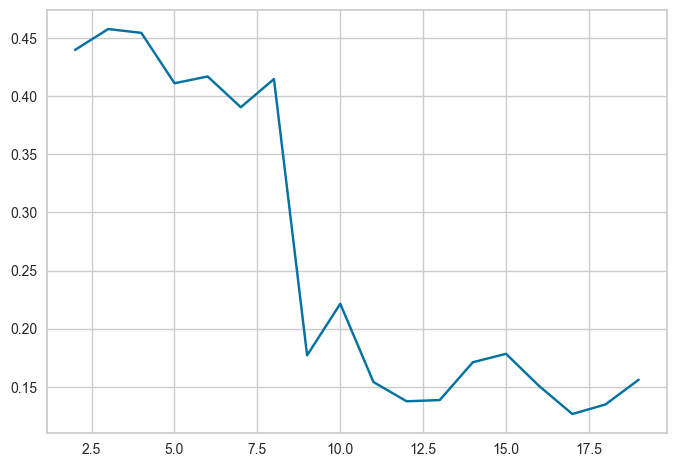

In [54]:
sil_score = []
cluster_list = list(range(2, 20))
for n_clusters in cluster_list:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict((df2_scaled))
    # centers = clusterer.cluster_centers_
    score = silhouette_score(df2_scaled, preds)
    sil_score.append(score)
    print("For n_clusters = {}, the silhouette score is {})".format(n_clusters, score))

plt.plot(cluster_list, sil_score)
plt.show()

**Notes**
* From Silhouette Scores values, a number of clusters might be 3, 4 or 2.
* Observed significant drop on Silhouette Scores values from 10 clusters onwards.

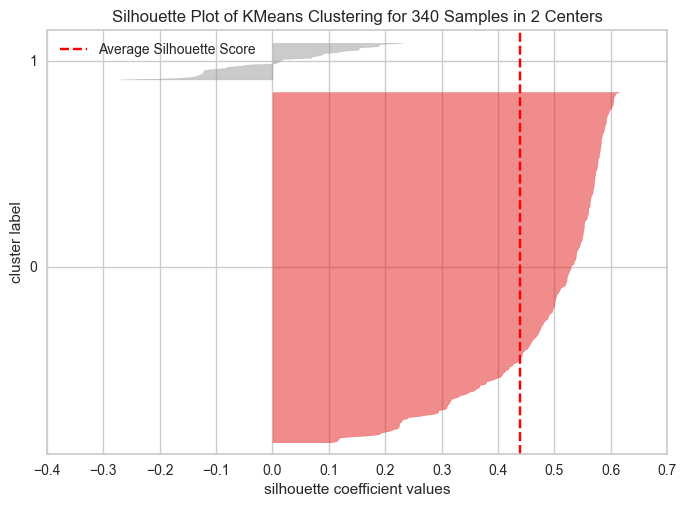

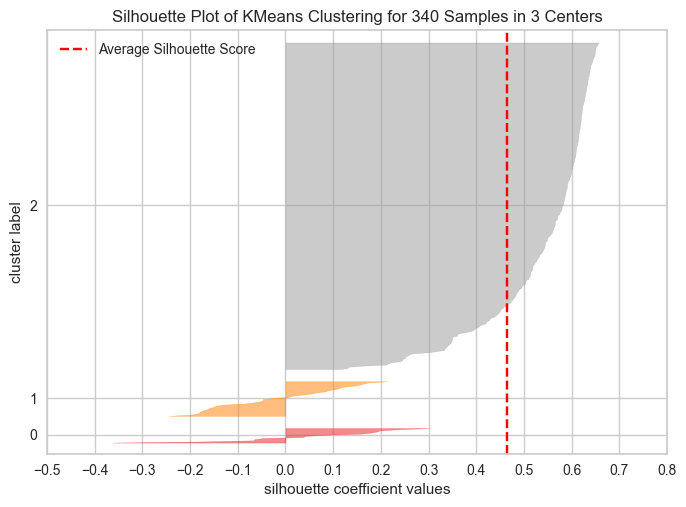

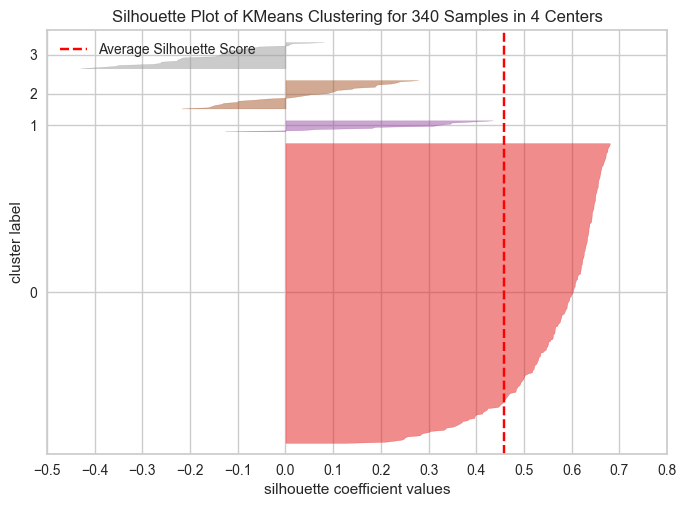

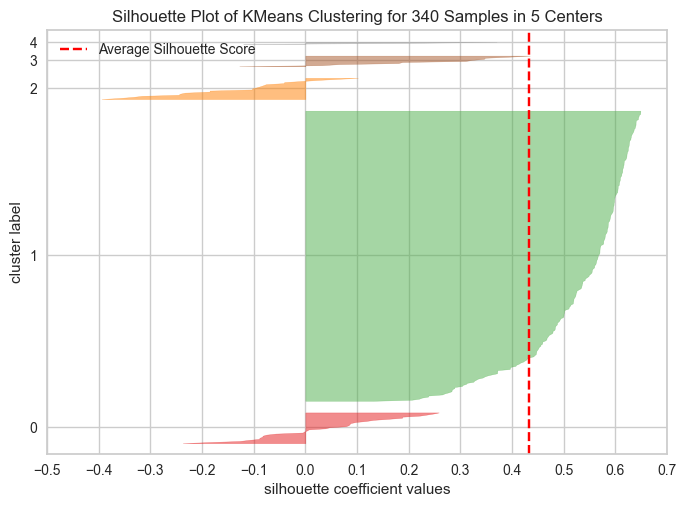

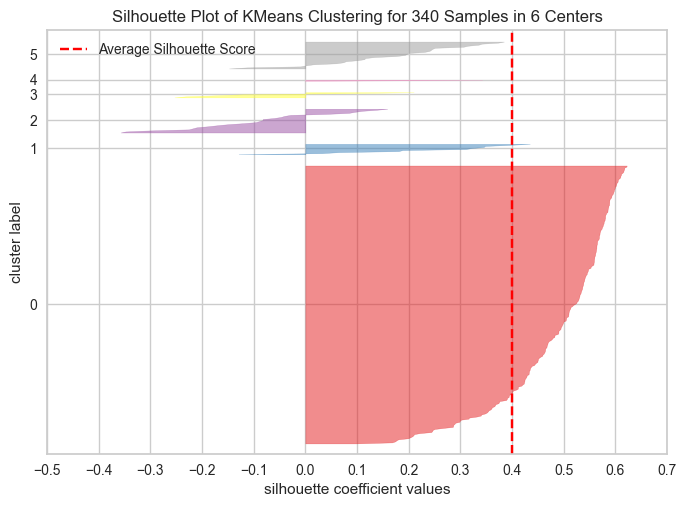

...

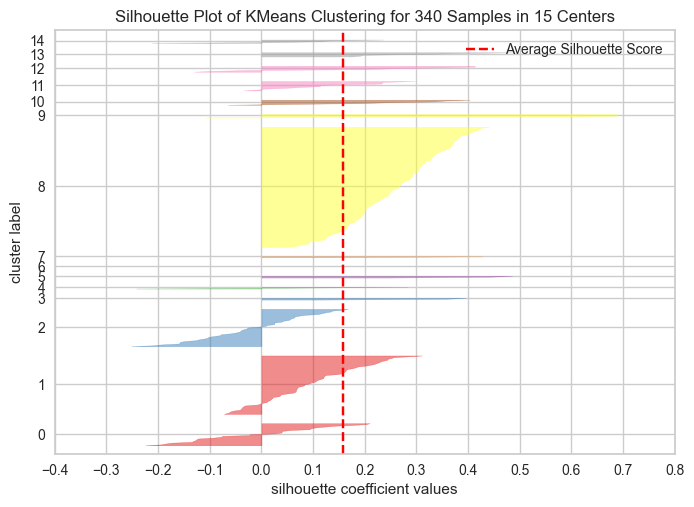

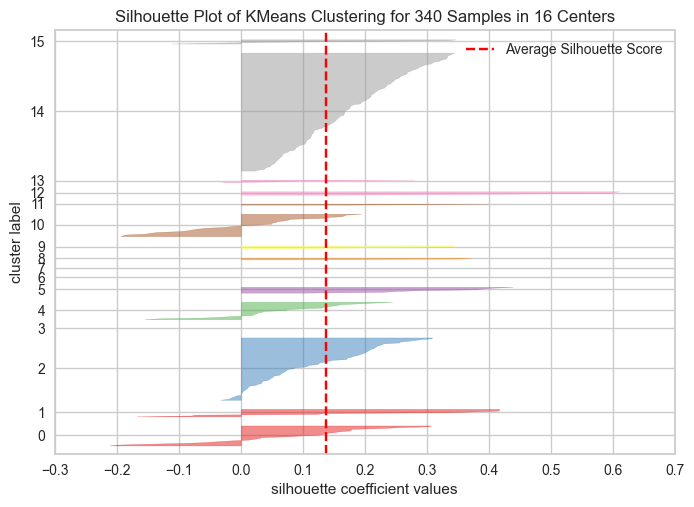

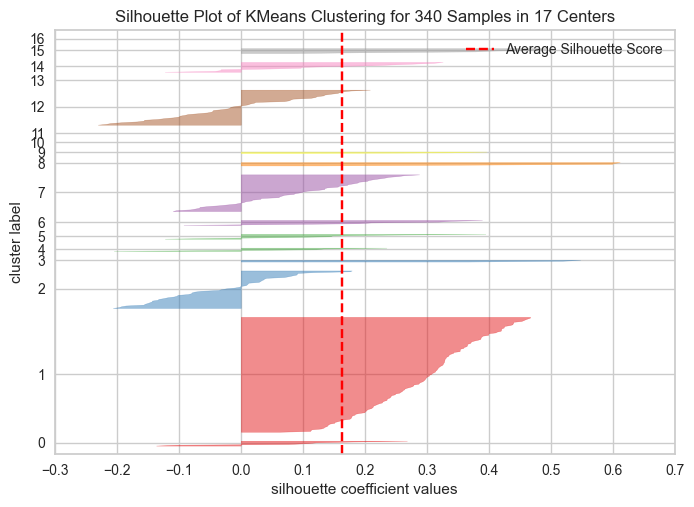

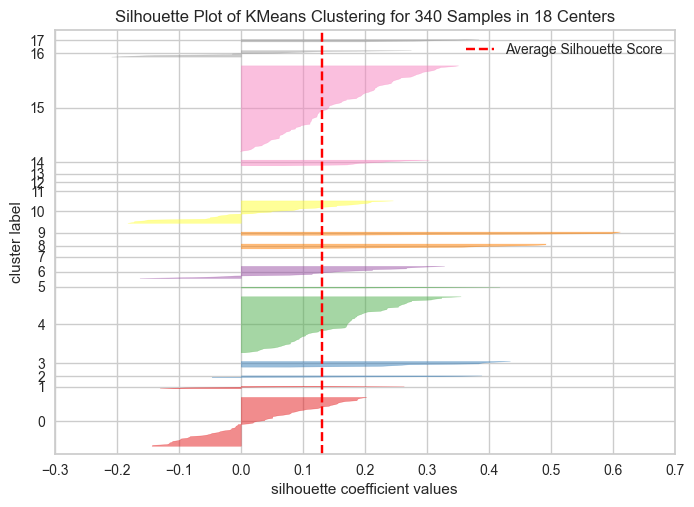

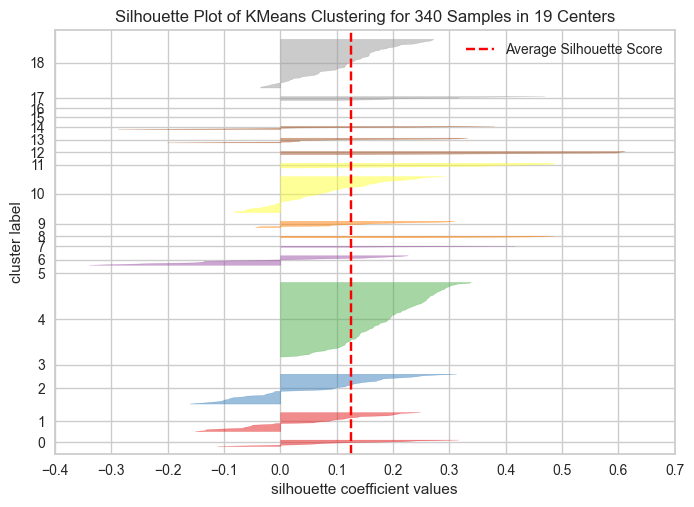

In [55]:
for i in range(2, 20):
    visualizer = SilhouetteVisualizer(KMeans(i, random_state=1))
    visualizer.fit(df2_scaled)
    visualizer.show();

**Notes**
* From Silhouette Scores visualization, is noted negative scores regardless the number of clusters. Negative scores  indicates that the sample might have been assigned to the wrong cluster, as it is closer to a neighboring cluster than its own.
* Negative scores on Silhouette visualization could lead to think K-Means might not be the best clustering algorithm for the data. In the other hand, the data nature also lead to think there is high probability of overlaping with stocks having multiple cluster where possible to be allocated.
* There is no clear alignment to define the number of clusters based on the metrics Inertia, Dunn Index and Silhouette score
* Still, K-means clustering will be evaluated considering 8 clusters.
* Proposed number of clusters defined according to Silhouette visualization, where, although negative scores are observed in all cases, they seem less numerous in the 8-cluster scenario.

### K-Means model

In [56]:
# fitting K-means model
kmeans = KMeans(n_clusters=8, random_state=1)
kmeans.fit(df2_scaled)

KMeans(random_state=1)

### Cluster Profiling

In [57]:
# adding kmeans cluster labels to the original dataframe
df_cl = df.copy()
df_cl["KM_segments"] = kmeans.labels_

# adding kmeans cluster labels to the scaled dataframe (num_cols)
df2_scaled_cl =df2_scaled.copy()
df2_scaled_cl["KM_segments"] = kmeans.labels_

# adding kmeans cluster labels to the scaled dataframe (all_cols)
df3_cl =df3.copy()
df3_cl["KM_segments"] = kmeans.labels_


In [58]:
df_cl.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,KM_segments
0,AAL,American Airlines Group,Industrials,Airlines,42.350,10.000,1.687,135,51,-604000000,7610000000,11.390,668129938.500,3.718,-8.784,2
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240,8.339,2.198,130,77,51000000,5144000000,3.150,1633015873.000,18.806,-8.750,2
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910,11.301,1.274,21,67,938000000,4423000000,2.940,1504421769.000,15.276,-0.394,2
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940,13.977,1.358,9,180,-240840000,629551000,1.260,499643650.800,74.556,4.200,0
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320,-1.828,1.701,14,272,315120000,696878000,0.310,2247993548.000,178.452,1.060,0


In [59]:
df2_scaled_cl.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,KM_segments
0,-0.393,0.494,0.273,0.990,-0.211,-0.339,1.554,1.309,0.108,-0.652,-0.507,2
1,-0.221,0.355,1.137,0.938,0.077,-0.002,0.928,0.057,1.250,-0.312,-0.504,2
2,-0.367,0.602,-0.427,-0.193,-0.033,0.454,0.744,0.025,1.098,-0.392,0.095,2
3,0.134,0.826,-0.285,-0.317,1.218,-0.152,-0.220,-0.231,-0.092,0.947,0.424,0
4,-0.261,-0.493,0.296,-0.266,2.237,0.134,-0.203,-0.375,1.978,3.293,0.199,0


In [60]:
df3_cl.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,KM_segments
0,-0.393,0.494,0.273,0.990,-0.211,-0.339,1.554,1.309,0.108,-0.652,-0.507,AAL,American Airlines Group,Industrials,Airlines,2
1,-0.221,0.355,1.137,0.938,0.077,-0.002,0.928,0.057,1.250,-0.312,-0.504,ABBV,AbbVie,Health Care,Pharmaceuticals,2
2,-0.367,0.602,-0.427,-0.193,-0.033,0.454,0.744,0.025,1.098,-0.392,0.095,ABT,Abbott Laboratories,Health Care,Health Care Equipment,2
3,0.134,0.826,-0.285,-0.317,1.218,-0.152,-0.220,-0.231,-0.092,0.947,0.424,ADBE,Adobe Systems Inc,Information Technology,Application Software,0
4,-0.261,-0.493,0.296,-0.266,2.237,0.134,-0.203,-0.375,1.978,3.293,0.199,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,0


**Notes**
* Added kmeans cluster labels to the original dataframe "df" to create a new dataframe "df_cl" meaning dataframe with cluster labels. 
* Added kmeans cluster labels to the original dataframe without catagorical variables and scaled numerical variables  "df2_scaled" to create a new dataframe "df2_scaled_cl" meaning dataframe with cluster labels 
* Added kmeans cluster labels to the original dataframe with catagorical variables and scaled numerical variables  "df3" to create a new dataframe "df3_scaled_cl" meaning dataframe with cluster labels 

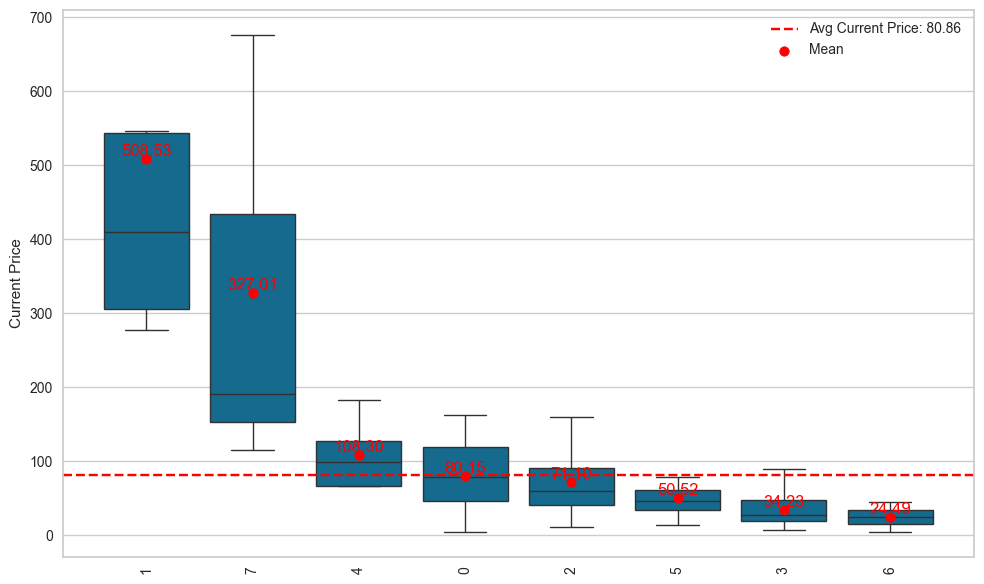

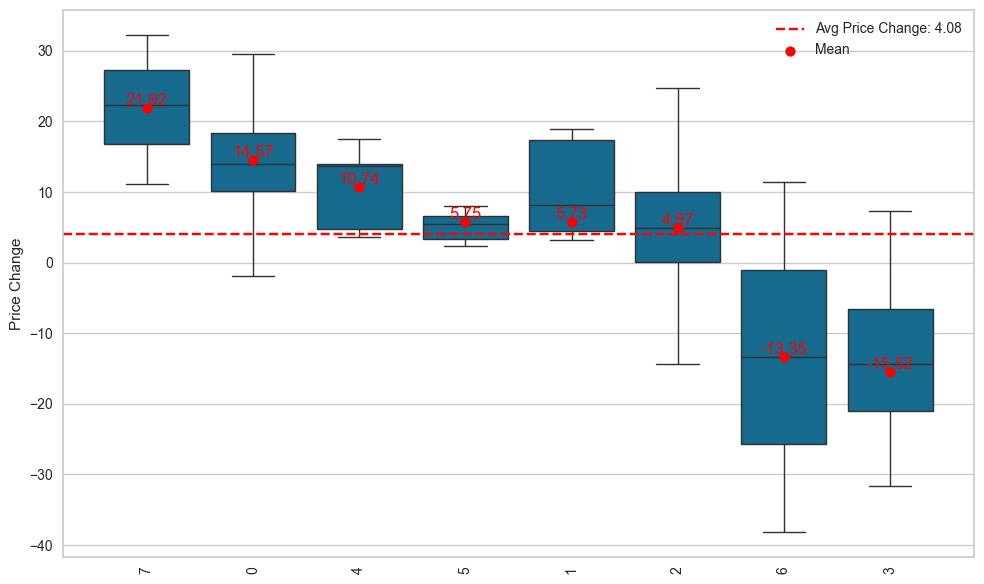

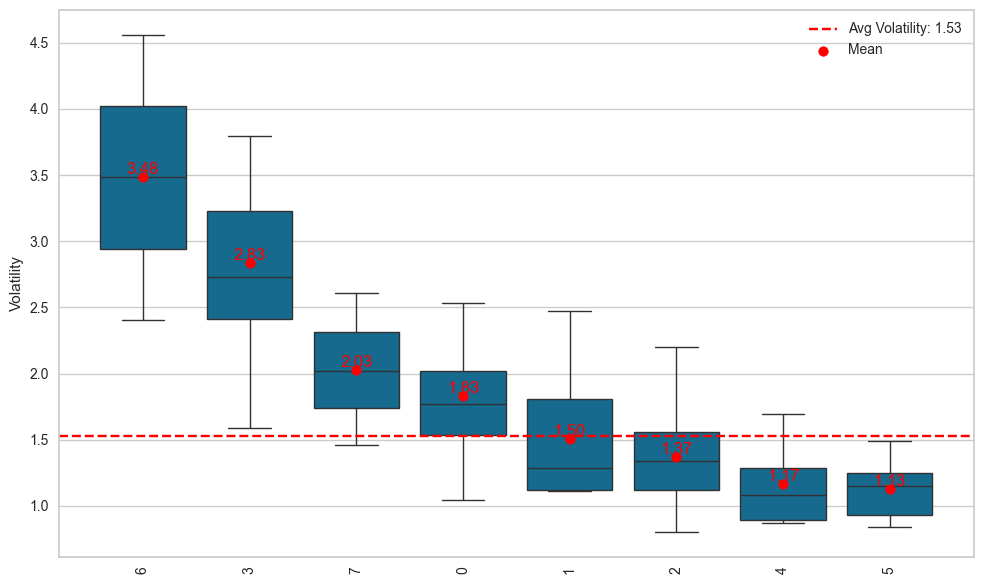

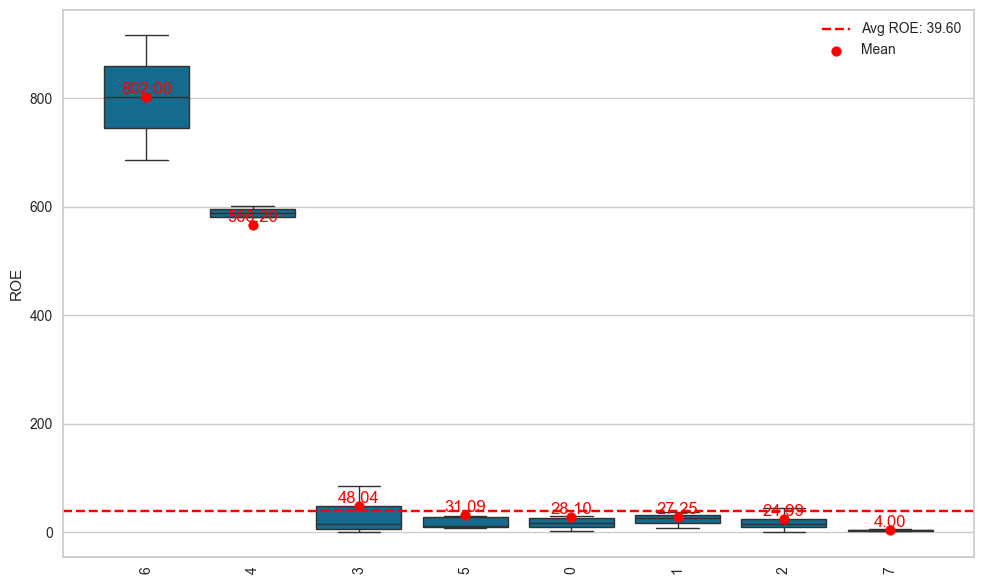

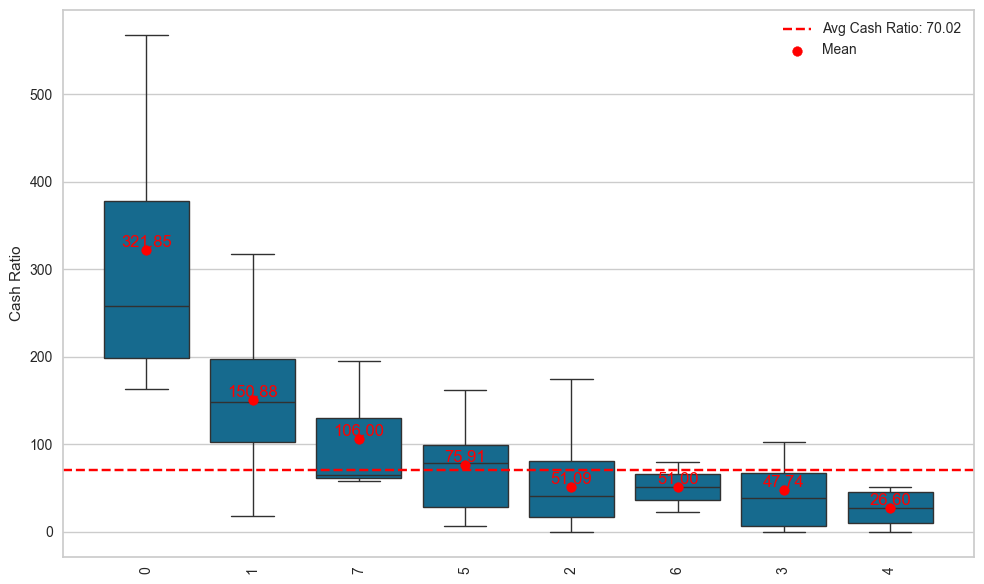

...

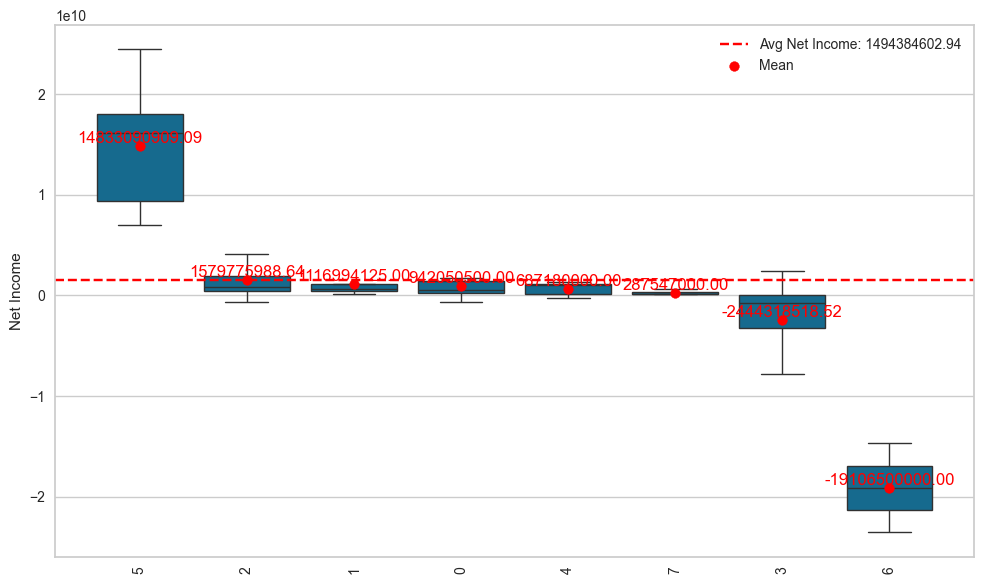

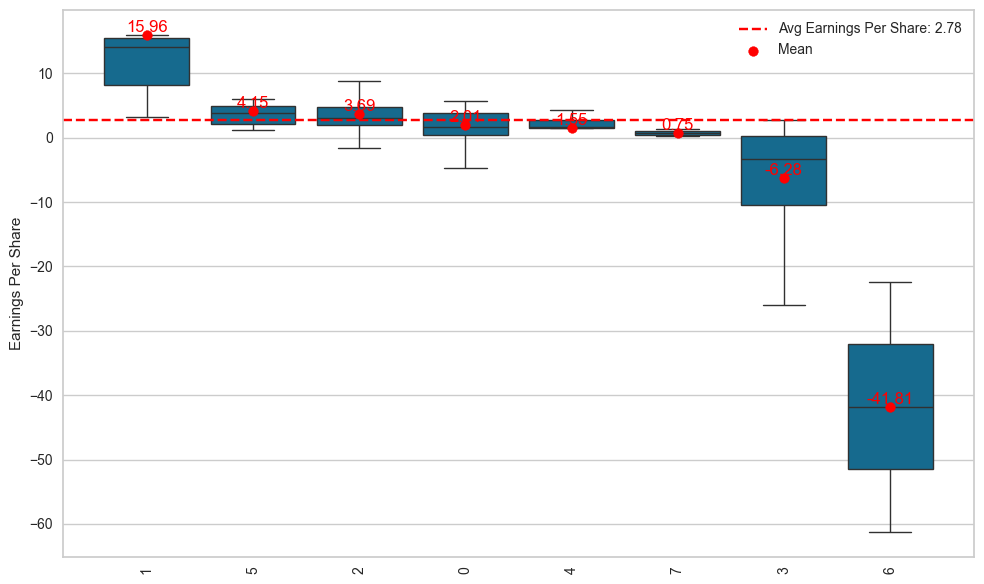

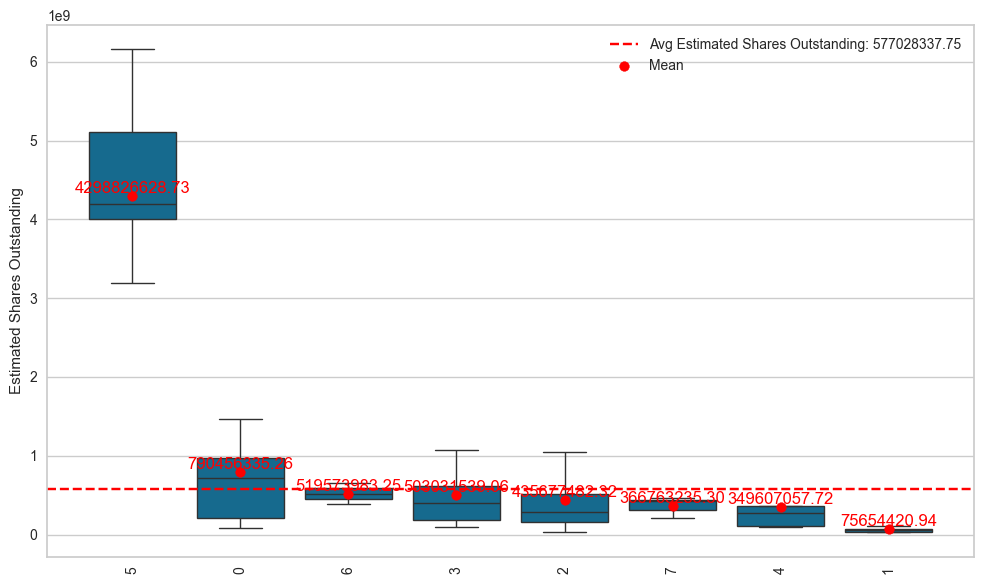

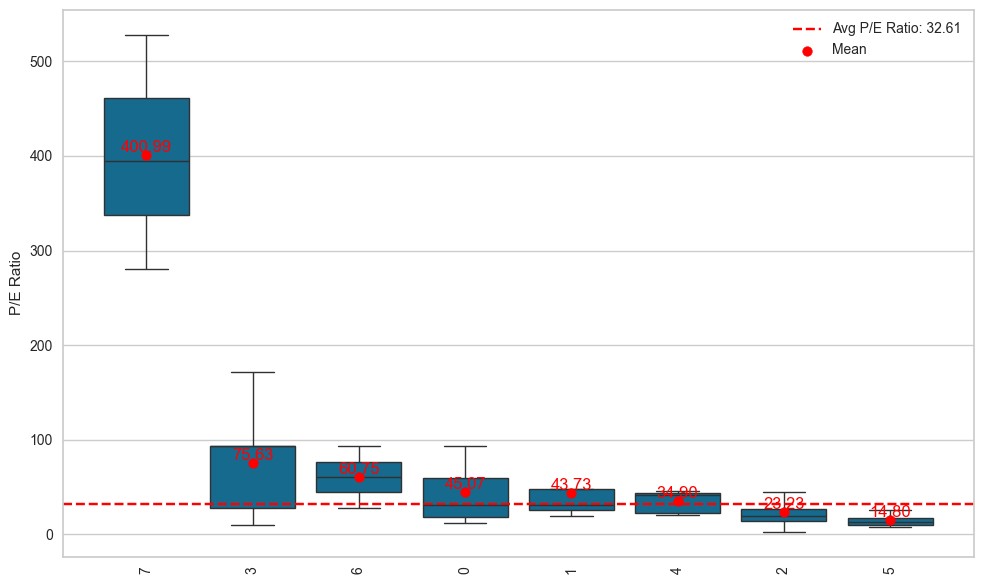

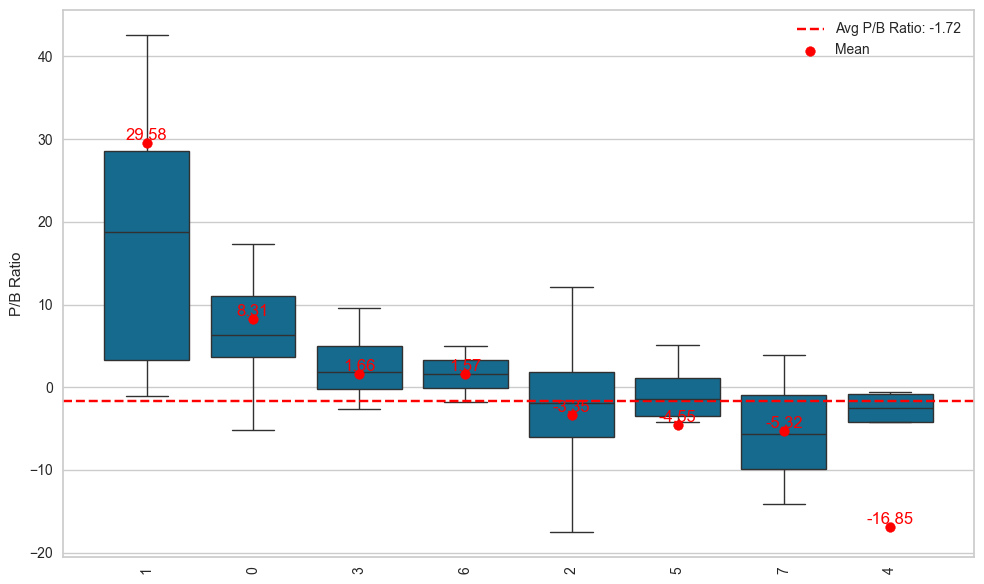

In [61]:
for i in num_cols:
    plt.figure(figsize=(10, 6))
    boxplot_by_group(df_cl, 'KM_segments', i, False)

In [62]:
# cluster profiling
km_cluster_profile = df_cl.groupby("KM_segments").mean()
km_cluster_profile["count_in_each_segment"] = (df_cl.groupby("KM_segments")["Ticker Symbol"].count().values)
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segment
KM_segments,,,,,,,,,,,,
1,508.534992,5.732177,1.504640,27.250000,150.875000,37895875.000000,1116994125.000000,15.965000,75654420.935000,43.727459,29.581664,8
7,327.006671,21.917380,2.029752,4.000000,106.000000,698240666.666667,287547000.000000,0.750000,366763235.300000,400.989188,-5.322376,3
4,108.304002,10.737770,1.165694,566.200000,26.600000,-278760000.000000,687180000.000000,1.548000,349607057.720000,34.898915,-16.851358,5
0,80.152167,14.571437,1.829679,28.100000,321.850000,625929050.000000,942050500.000000,2.010500,790456335.265000,45.067457,8.307945,20
2,71.100057,4.970680,1.372796,24.988636,51.087121,87930727.272727,1579775988.636364,3.688466,435677482.318371,23.232454,-3.350613,264
5,50.517273,5.747586,1.130399,31.090909,75.909091,-1072272727.272727,14833090909.090910,4.154545,4298826628.727273,14.803577,-4.552119,11
3,34.231808,-15.515565,2.832069,48.037037,47.740741,-128651518.518519,-2444318518.518518,-6.284444,503031539.057037,75.627265,1.655990,27
6,24.485001,-13.351992,3.482611,802.000000,51.000000,-1292500000.000000,-19106500000.000000,-41.815000,519573983.250000,60.748608,1.565141,2


**Notes**
* Current Price top clusters are 1, 7, 4
* Price Change top clusters are 7, 0, 4
* Volatility top clusters are 6, 3, 7
* ROE top clusters are 6, 4, 3
* Cash Ratio top clusters are 0, 1, 7
* Net Cash Flow top clusters are 7, 0, 2
* Net Income top clusters are 5, 2, 1
* Earnings per Share top clusters are 1, 5, 2
* Estimated Shares Oustanding top clusters are 5, 0, 6
* P/E Ratio top clusters are 7, 3, 6
* P/B Ratio top clusters are 1, 0, 3 

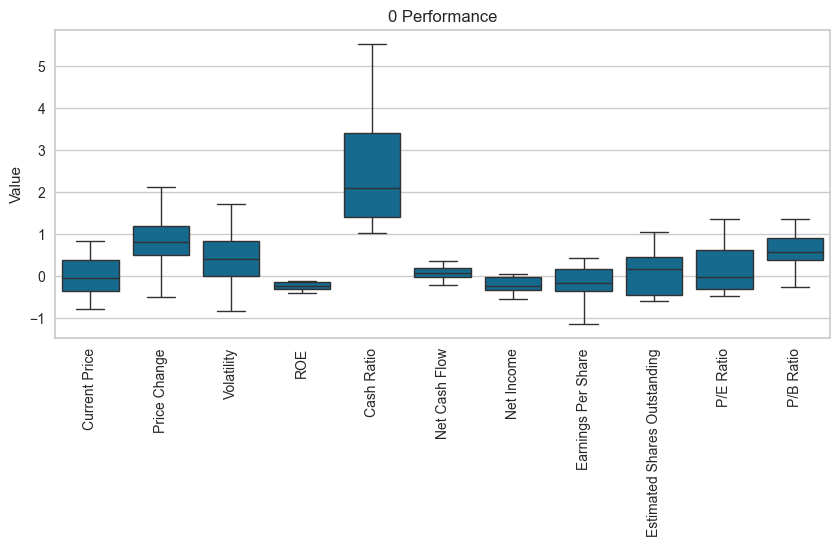

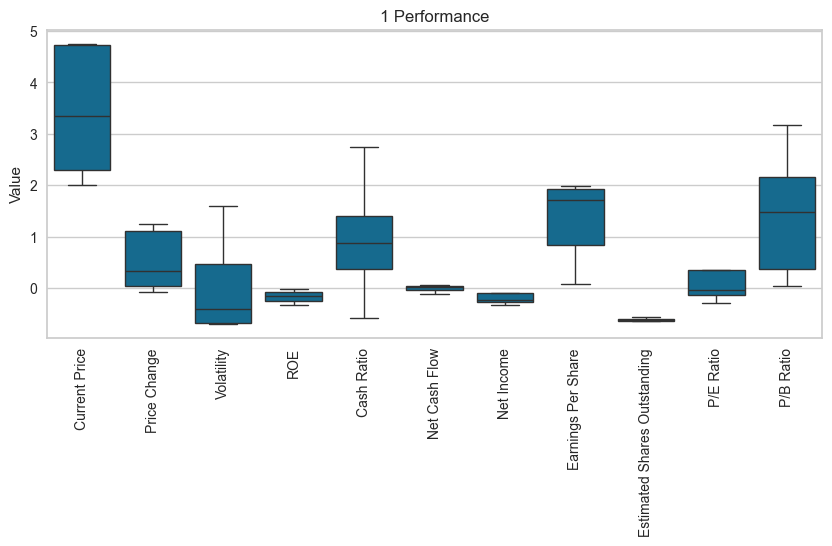

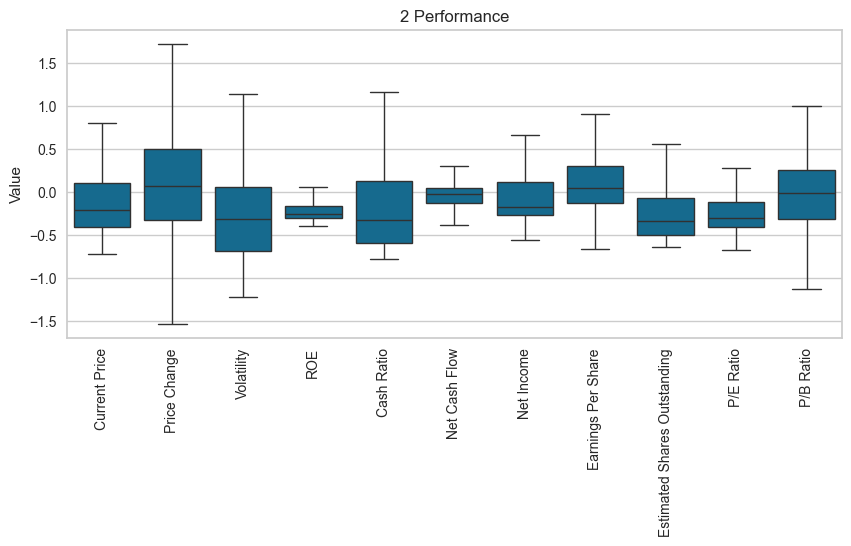

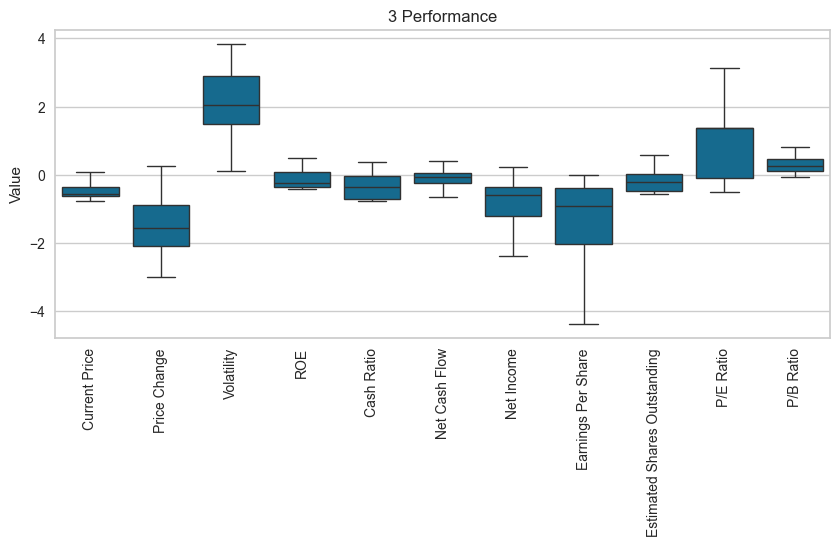

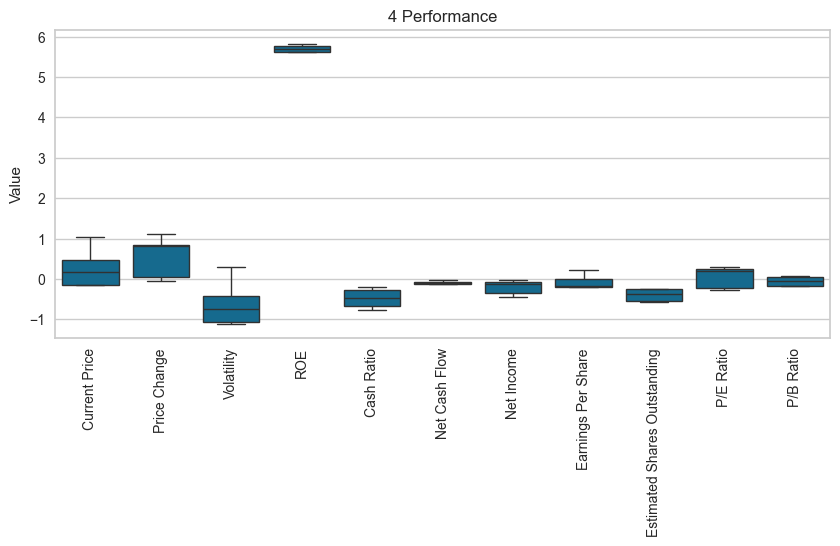

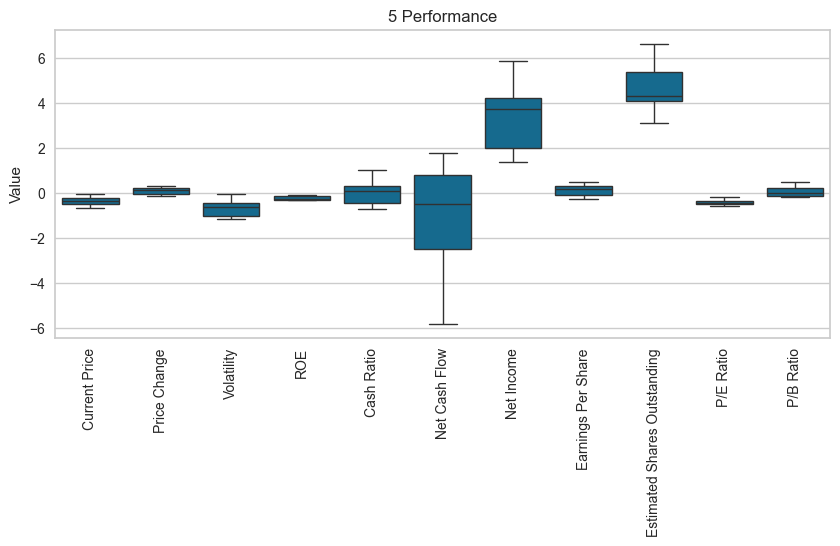

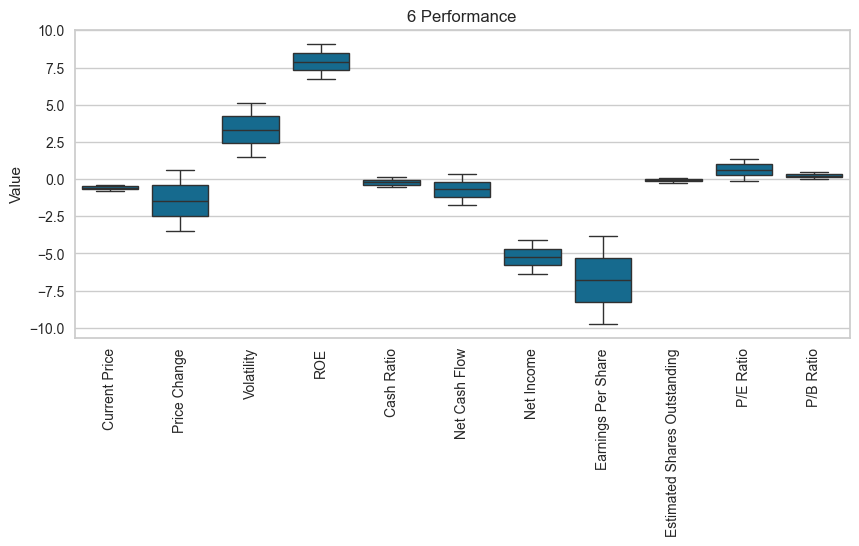

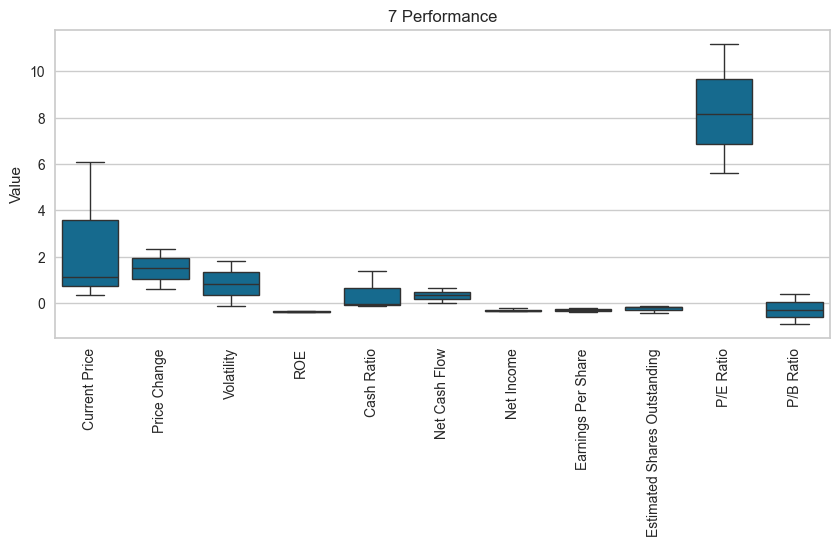

In [63]:
for label in range(0,8):
    plt.figure(figsize=(10, 4))
    boxplot_by_label(df3_cl,'KM_segments',label, False)

In [64]:
# cluster profiling
km_cluster_profile = df3_cl.groupby("KM_segments").mean()
km_cluster_profile["count_in_each_segment"] = (df_cl.groupby("KM_segments")["Ticker Symbol"].count().values)
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segment
KM_segments,,,,,,,,,,,,
0,-0.007253,0.875263,0.513942,-0.119257,2.789139,0.293487,-0.140388,-0.116472,0.252696,0.281254,0.718911,8
1,4.367983,0.137962,-0.036106,-0.128074,0.895482,-0.009077,-0.095922,2.004891,-0.593620,0.250994,2.244307,3
2,-0.099706,0.074444,-0.259221,-0.151531,-0.209733,0.016667,0.021704,0.138612,-0.167357,-0.211820,-0.117046,5
3,-0.476255,-1.634357,2.210242,0.087547,-0.246796,-0.094772,-1.001106,-1.377469,-0.087611,0.971349,0.241944,20
4,0.280272,0.555489,-0.609690,5.462377,-0.480943,-0.172008,-0.205168,-0.186781,-0.269264,0.051630,-1.085094,264
5,-0.309926,0.139248,-0.669418,-0.088233,0.065186,-0.580298,3.390319,0.209466,4.406556,-0.402159,-0.203198,11
6,-0.575803,-1.453888,3.311126,7.908297,-0.210698,-0.693613,-5.236157,-6.778822,-0.068025,0.635362,0.235430,27
7,2.513965,1.488004,0.852517,-0.369243,0.398462,0.330693,-0.306744,-0.308093,-0.248951,8.318604,-0.258428,2


**Notes**
* Cluster 0 considers high Cash Ratio stocks
* Cluster 1 considers high Current Price stocks
* Cluster 2 considers average perfoming stocks
* Cluster 3 considers high Volality stocks
* Cluster 4 considers high ROE stocks
* Cluster 5 considers high Estimated Shares Oustanding and Net Income stocks
* Cluster 6 considers high ROE and Volality stocks
* Cluster 7 considers high P/E Ratio stocks

In [264]:
Clusters_km = pd.DataFrame({
    'Cluster': range(8),  # 0 to 7
    'Tendency': [
        'Cash Ratio',
        'Current Price',
        'Average perfom',
        'Volatility',
        'ROE',
        'Estimated Shares Oustanding & Net Income',
        'ROE & Volality',
        'P/E Ratio'
    ]
})

In [265]:
Clusters_km['Sectors']=df_cl.groupby('KM_segments')['GICS Sector'].nunique()
Clusters_km['Companies']=df_cl.groupby('KM_segments')['Security'].nunique()
Clusters_km

,Cluster,Tendency,Sectors,Companies
0,0,Cash Ratio,7,20
1,1,Current Price,4,8
2,2,Average perfom,11,264
3,3,Volatility,4,27
4,4,ROE,4,5
5,5,Estimated Shares Oustanding & Net Income,7,11
6,6,ROE & Volality,1,2
7,7,P/E Ratio,3,3


**Notes**
* Created "Tendency" label for cluster identification based on cluster performance.

In [67]:
df_cl.groupby('KM_segments')['Ticker Symbol'].nunique()

KM_segments
1      8
7      3
4      5
0     20
2    264
5     11
3     27
6      2
Name: Ticker Symbol, dtype: int64

In [68]:
df_cl.groupby('KM_segments')['Ticker Symbol'].nunique() / df_cl['Ticker Symbol'].nunique() * 100

KM_segments
1    2.353
7    0.882
4    1.471
0    5.882
2   77.647
5    3.235
3    7.941
6    0.588
Name: Ticker Symbol, dtype: float64

In [69]:
df_cl.groupby('GICS Sector')['KM_segments'].value_counts()

GICS Sector             KM_segments
Information Technology  2              20
                        0               8
                        3               2
                        1               1
                        7               1
                                       ..
Utilities               4               0
                        0               0
                        5               0
                        3               0
                        6               0
Name: KM_segments, Length: 88, dtype: int64

In [70]:
df_cl.groupby('KM_segments')['GICS Sector'].value_counts()

KM_segments  GICS Sector                
1            Health Care                    4
             Consumer Discretionary         2
             Information Technology         1
             Real Estate                    1
             Telecommunications Services    0
                                           ..
6            Real Estate                    0
             Consumer Discretionary         0
             Materials                      0
             Industrials                    0
             Utilities                      0
Name: GICS Sector, Length: 88, dtype: int64

**Notes**
* Cluster 2 is by far the biggest cluster with 77% of observations
* Although K-Means clusters have no direct relation with economic sector nor Sub-Industry (only one cluster with a single economic sector companies), it does well on clasification by stocks performance metrics.

In the stocks group with Cash Ratio tendency, there are 20 companies present.
Companies: Adobe Systems Inc, Analog Devices, Inc., Amgen Inc, Broadcom, Celgene Corp., eBay Inc., Edwards Lifesciences, Facebook, First Solar Inc, Frontier Communications, Halliburton Co., McDonald's Corp., Monster Beverage, Newmont Mining Corp. (Hldg. Co.), Skyworks Solutions, TripAdvisor, Vertex Pharmaceuticals Inc, Waters Corporation, Wynn Resorts Ltd, Yahoo Inc.

In the stocks group with Cash Ratio tendency, there are 7 economic sectors represented.
Economic Sectors: Information Technology, Health Care, Telecommunications Services, Energy, Consumer Discretionary, Consumer Staples, Materials

Statistical summary for the stocks group with Cash Ratio tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,20.00,80.15,44.95,4.67,45.75,77.91,118.54,162.33
Price Change,20.00,14.57,14.38,-8.51,10.21,13.95,18.41,55.05
Volatility,20.00,1.83,0.63,0.73,1.54,1.77,2.02,3.79
ROE,20.00,28.10,38.04,2.00,9.75,17.50,26.25,174.00
Cash Ratio,20.00,321.85,189.54,163.00,198.00,258.50,377.75,958.00
Net Cash Flow,2e+01,6e+08,2e+09,-4e+09,2e+07,2e+08,5e+08,8e+09
Net Income,2e+01,9e+08,2e+09,-4e+09,2e+08,5e+08,1e+09,7e+09
Earnings Per Share,20.00,2.01,3.04,-4.64,0.40,1.68,3.83,9.15
Estimated Shares Outstanding,2e+01,8e+08,7e+08,8e+07,2e+08,7e+08,1e+09,3e+09
P/E Ratio,20.00,45.07,39.27,12.18,18.97,31.66,59.91,178.45


Finantial performance for the stocks group with Cash Ratio tendency (normalized metrics):


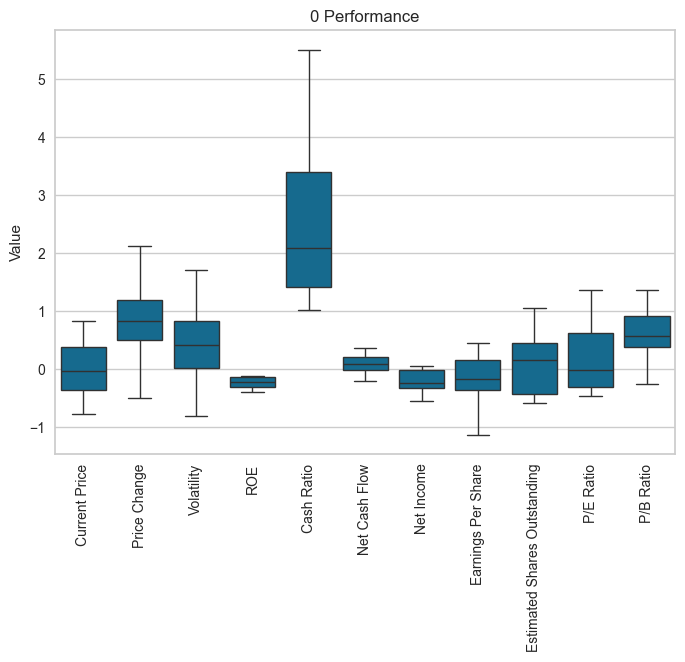

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Current Price tendency, there are 8 companies present.
Companies: Alliance Data Systems, BIOGEN IDEC Inc., Chipotle Mexican Grill, Equinix, Intuitive Surgical Inc., Mettler Toledo, Priceline.com Inc, Regeneron

In the stocks group with Current Price tendency, there are 4 economic sectors represented.
Economic Sectors: Information Technology, Health Care, Consumer Discretionary, Real Estate

Statistical summary for the stocks group with Current Price tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,8.00,508.53,328.78,276.57,305.36,409.49,543.69,1274.95
Price Change,8.00,5.73,16.93,-33.13,4.49,8.10,17.43,18.94
Volatility,8.00,1.50,0.49,1.12,1.12,1.29,1.81,2.47
ROE,8.00,27.25,16.83,7.00,16.25,25.50,32.00,61.00
Cash Ratio,8.00,150.88,100.42,18.00,103.00,148.50,197.25,317.00
Net Cash Flow,8e+00,4e+07,9e+08,-2e+09,-3e+07,1e+08,2e+08,2e+09
Net Income,8e+00,1e+09,1e+09,2e+08,4e+08,6e+08,1e+09,4e+09
Earnings Per Share,8.00,15.96,14.56,3.25,8.22,14.03,15.50,50.09
Estimated Shares Outstanding,8e+00,8e+07,7e+07,3e+07,4e+07,5e+07,8e+07,2e+08
P/E Ratio,8.00,43.73,29.24,19.92,26.31,31.20,47.81,93.05


Finantial performance for the stocks group with Current Price tendency (normalized metrics):


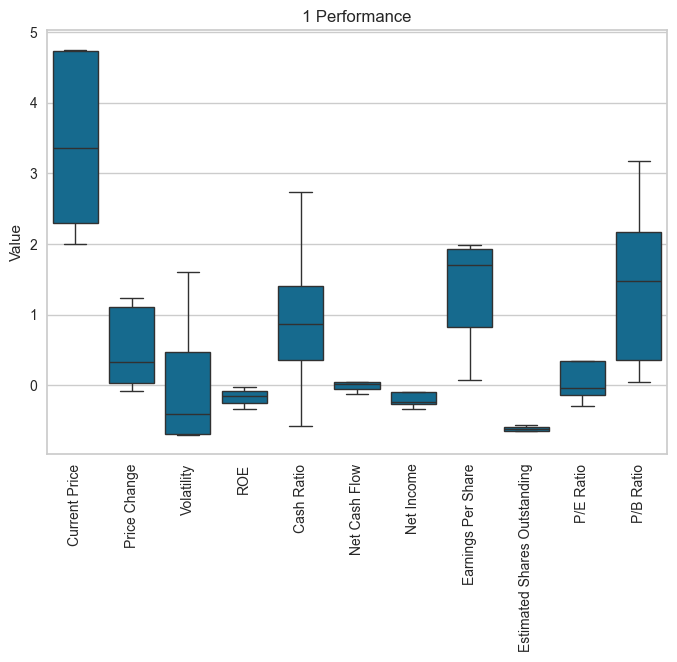

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Average perfom tendency, there are 264 companies present.
Companies: American Airlines Group, AbbVie, Abbott Laboratories, Archer-Daniels-Midland Co, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Ameriprise Financial, American Tower Corp A, AutoNation Inc, Anthem Inc., Aon plc, Amphenol Corp, Activision Blizzard, AvalonBay Communities, Inc., American Water Works Company Inc, American Express Co, Boeing Company, Bank of America Corp, Baxter International Inc., BB&T Corporation, Bard (C.R.) Inc., The Bank of New York Mellon Corp., Ball Corp, Bristol-Myers Squibb, Boston Scient

,count,mean,std,min,25%,50%,75%,max
Current Price,264.00,71.10,43.57,10.63,41.15,59.96,90.65,259.60
Price Change,264.00,4.97,9.18,-23.79,0.13,4.90,10.05,37.49
Volatility,264.00,1.37,0.33,0.81,1.12,1.34,1.56,2.40
ROE,264.00,24.99,35.73,1.00,10.00,15.00,24.00,263.00
Cash Ratio,264.00,51.09,41.82,0.00,16.75,41.00,81.00,225.00
Net Cash Flow,3e+02,9e+07,2e+09,-4e+09,-2e+08,2e+06,2e+08,2e+10
Net Income,3e+02,2e+09,2e+09,-7e+08,4e+08,8e+08,2e+09,2e+10
Earnings Per Share,264.00,3.69,2.82,-2.97,1.93,3.08,4.73,19.52
Estimated Shares Outstanding,3e+02,4e+08,4e+08,4e+07,2e+08,3e+08,5e+08,3e+09
P/E Ratio,264.00,23.23,15.67,2.94,14.63,19.04,27.36,131.53


Finantial performance for the stocks group with Average perfom tendency (normalized metrics):


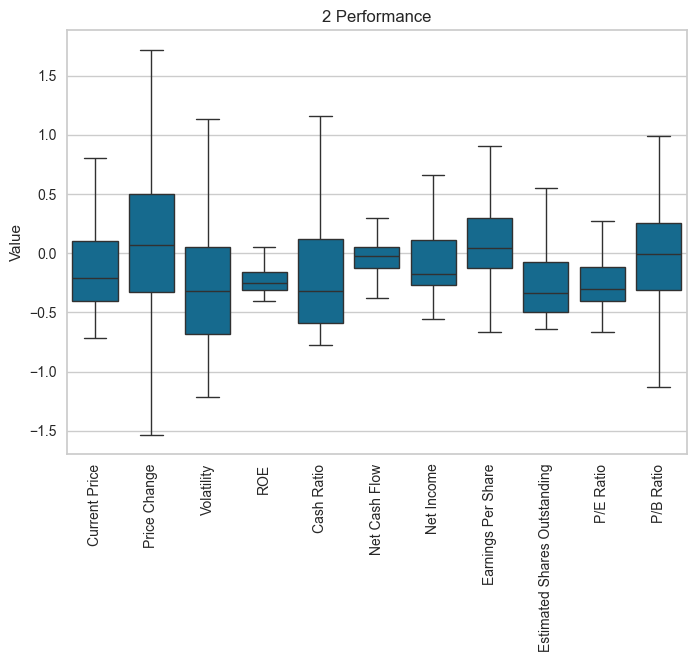

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Volatility tendency, there are 27 companies present.
Companies: Anadarko Petroleum Corp, Arconic Inc, Baker Hughes Inc, Cabot Oil & Gas, Concho Resources, Devon Energy Corp., EOG Resources, EQT Corporation, Freeport-McMoran Cp & Gld, Hess Corporation, Hewlett Packard Enterprise, Kinder Morgan, The Mosaic Company, Marathon Oil Corp., Murphy Oil, Noble Energy Inc, Newfield Exploration Co, National Oilwell Varco Inc., ONEOK, Occidental Petroleum, Quanta Services Inc., Range Resources Corp., Spectra Energy Corp., Southwestern Energy, Teradata Corp., Williams Cos., Cimarex Energy

In the stocks group with Volatility tendency, there are 4 economic sectors represented.
Economic Sectors: Energy, Industrials, Materials, Information Technology

Statistical summary for the stocks group with Volatility tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,27.00,34.23,23.45,6.77,18.97,26.42,47.32,92.86
Price Change,27.00,-15.52,13.07,-47.13,-21.03,-14.40,-6.59,7.30
Volatility,27.00,2.83,0.67,1.59,2.41,2.73,3.23,4.58
ROE,27.00,48.04,69.52,1.00,6.50,16.00,47.50,244.00
Cash Ratio,27.00,47.74,52.54,0.00,6.00,38.00,67.00,201.00
Net Cash Flow,3e+01,-1e+08,2e+09,-6e+09,-4e+08,-4e+07,1e+08,8e+09
Net Income,3e+01,-2e+09,4e+09,-1e+10,-3e+09,-8e+08,8e+07,2e+09
Earnings Per Share,27.00,-6.28,9.25,-35.55,-10.50,-3.26,0.20,2.79
Estimated Shares Outstanding,3e+01,5e+08,5e+08,9e+07,2e+08,4e+08,6e+08,3e+09
P/E Ratio,27.00,75.63,40.95,9.89,28.41,93.09,93.09,171.96


Finantial performance for the stocks group with Volatility tendency (normalized metrics):


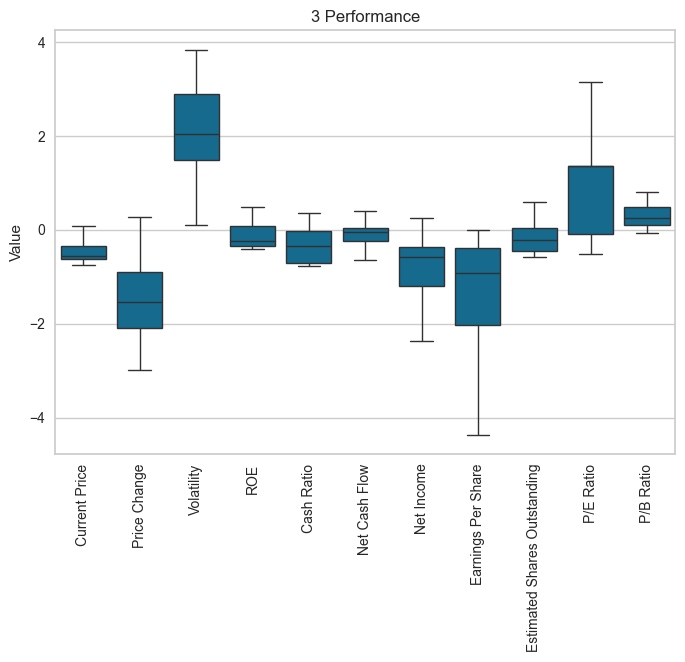

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with ROE tendency, there are 5 companies present.
Companies: Allegion, Charter Communications, Colgate-Palmolive, Kimberly-Clark, S&P Global, Inc.

In the stocks group with ROE tendency, there are 4 economic sectors represented.
Economic Sectors: Industrials, Consumer Discretionary, Consumer Staples, Financials

Statistical summary for the stocks group with ROE tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,5.00,108.30,48.95,65.92,66.62,98.58,127.30,183.10
Price Change,5.00,10.74,6.17,3.60,4.78,13.75,14.04,17.51
Volatility,5.00,1.17,0.34,0.87,0.90,1.08,1.28,1.70
ROE,5.00,566.20,58.14,463.00,582.00,589.00,596.00,601.00
Cash Ratio,5.00,26.60,21.89,0.00,10.00,27.00,45.00,51.00
Net Cash Flow,5e+00,-3e+08,4e+08,-1e+09,-2e+08,-1e+08,-9e+07,2e+06
Net Income,5e+00,7e+08,7e+08,-3e+08,2e+08,1e+09,1e+09,1e+09
Earnings Per Share,5.00,1.55,2.48,-2.43,1.53,1.60,2.78,4.26
Estimated Shares Outstanding,5e+00,3e+08,3e+08,1e+08,1e+08,3e+08,4e+08,9e+08
P/E Ratio,5.00,34.90,11.93,20.82,23.14,41.20,43.54,45.79


Finantial performance for the stocks group with ROE tendency (normalized metrics):


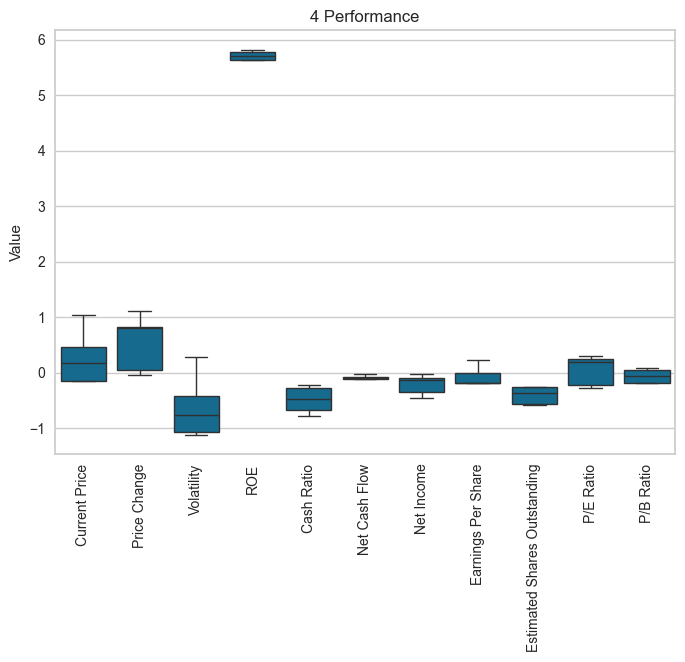

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Estimated Shares Oustanding & Net Income tendency, there are 11 companies present.
Companies: Citigroup Inc., Ford Motor, Gilead Sciences, Intel Corp., JPMorgan Chase & Co., Coca Cola Company, Pfizer Inc., AT&T Inc, Verizon Communications, Wells Fargo, Exxon Mobil Corp.

In the stocks group with Estimated Shares Oustanding & Net Income tendency, there are 7 economic sectors represented.
Economic Sectors: Financials, Consumer Discretionary, Health Care, Information Technology, Consumer Staples, Telecommunications Services, Energy

Statistical summary for the stocks group with Estimated Shares Oustanding & Net Income tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,11.00,50.52,24.15,14.09,34.43,46.22,60.20,101.19
Price Change,11.00,5.75,3.29,2.40,3.39,5.53,6.54,14.04
Volatility,11.00,1.13,0.22,0.84,0.93,1.15,1.25,1.49
ROE,11.00,31.09,36.55,8.00,10.50,12.00,27.50,109.00
Cash Ratio,11.00,75.91,53.01,7.00,28.50,79.00,99.00,162.00
Net Cash Flow,1e+01,-1e+09,6e+09,-1e+10,-5e+09,-9e+08,2e+09,1e+10
Net Income,1e+01,1e+10,6e+09,7e+09,9e+09,2e+10,2e+10,2e+10
Earnings Per Share,11.00,4.15,3.15,1.13,2.12,3.85,4.89,12.37
Estimated Shares Outstanding,1e+01,4e+09,1e+09,1e+09,4e+09,4e+09,5e+09,6e+09
P/E Ratio,11.00,14.80,7.01,7.58,10.06,13.00,17.38,28.57


Finantial performance for the stocks group with Estimated Shares Oustanding & Net Income tendency (normalized metrics):


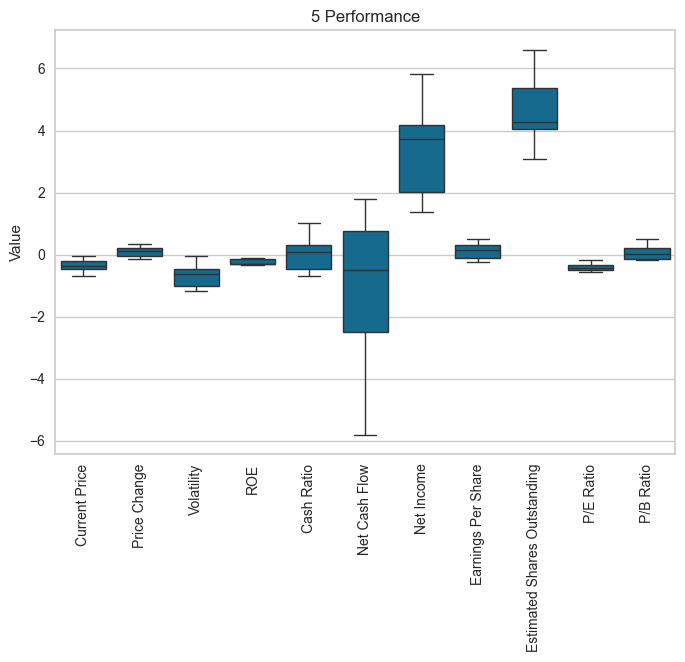

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with ROE & Volality tendency, there are 2 companies present.
Companies: Apache Corporation, Chesapeake Energy

In the stocks group with ROE & Volality tendency, there are 1 economic sectors represented.
Economic Sectors: Energy

Statistical summary for the stocks group with ROE & Volality tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,2.00,24.49,28.26,4.50,14.49,24.49,34.48,44.47
Price Change,2.00,-13.35,35.00,-38.10,-25.73,-13.35,-0.98,11.40
Volatility,2.00,3.48,1.52,2.41,2.94,3.48,4.02,4.56
ROE,2.00,802.00,162.63,687.00,744.50,802.00,859.50,917.00
Cash Ratio,2.00,51.00,41.01,22.00,36.50,51.00,65.50,80.00
Net Cash Flow,2e+00,-1e+09,3e+09,-3e+09,-2e+09,-1e+09,-3e+08,7e+08
Net Income,2e+00,-2e+10,6e+09,-2e+10,-2e+10,-2e+10,-2e+10,-1e+10
Earnings Per Share,2.00,-41.81,27.41,-61.20,-51.51,-41.81,-32.12,-22.43
Estimated Shares Outstanding,2e+00,5e+08,2e+08,4e+08,5e+08,5e+08,6e+08,7e+08
P/E Ratio,2.00,60.75,45.74,28.41,44.58,60.75,76.92,93.09


Finantial performance for the stocks group with ROE & Volality tendency (normalized metrics):


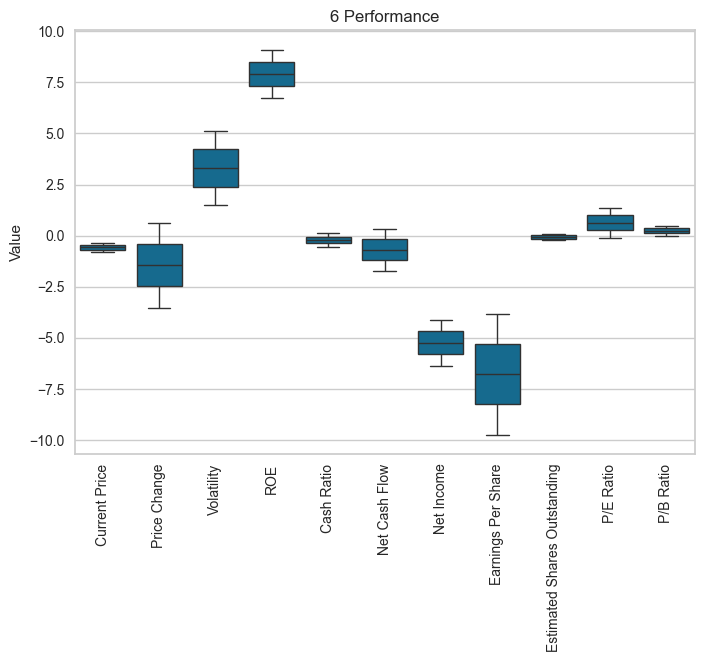

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with P/E Ratio tendency, there are 3 companies present.
Companies: Alexion Pharmaceuticals, Amazon.com Inc, Netflix Inc.

In the stocks group with P/E Ratio tendency, there are 3 economic sectors represented.
Economic Sectors: Health Care, Consumer Discretionary, Information Technology

Statistical summary for the stocks group with P/E Ratio tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,3.00,327.01,304.55,114.38,152.56,190.75,433.32,675.89
Price Change,3.00,21.92,10.57,11.15,16.74,22.34,27.30,32.27
Volatility,3.00,2.03,0.57,1.46,1.74,2.02,2.31,2.61
ROE,3.00,4.00,2.00,2.00,3.00,4.00,5.00,6.00
Cash Ratio,3.00,106.00,77.16,58.00,61.50,65.00,130.00,195.00
Net Cash Flow,3e+00,7e+08,6e+08,7e+07,4e+08,7e+08,1e+09,1e+09
Net Income,3e+00,3e+08,3e+08,1e+08,1e+08,1e+08,4e+08,6e+08
Earnings Per Share,3.00,0.75,0.50,0.29,0.48,0.68,0.98,1.28
Estimated Shares Outstanding,3e+00,4e+08,1e+08,2e+08,3e+08,4e+08,4e+08,5e+08
P/E Ratio,3.00,400.99,123.89,280.51,337.46,394.41,461.23,528.04


Finantial performance for the stocks group with P/E Ratio tendency (normalized metrics):


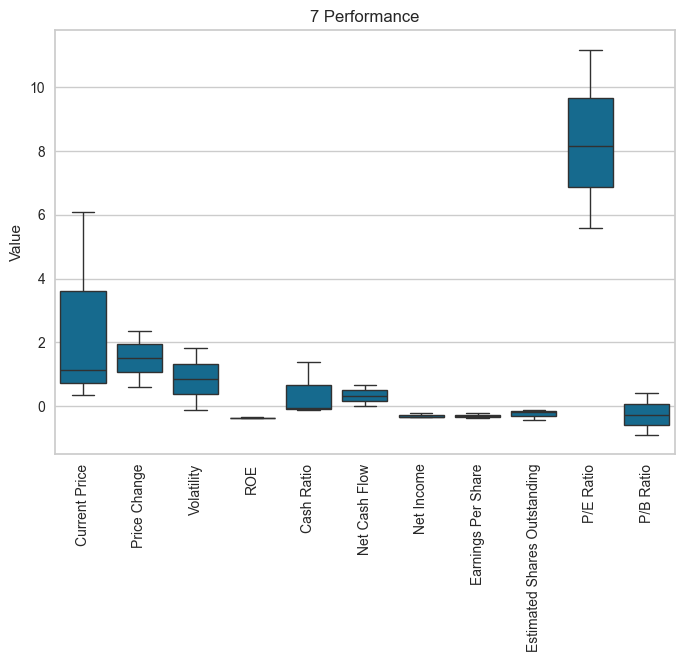

--------------------------------------------------------------------------------------------------------------------------------------------


In [266]:
# Report by Cluster
for segment in range(0,8):
    #companies by stock groups
    print("In the stocks group with {} tendency, there are {} companies present.".format(Clusters_km.loc[segment,'Tendency'],Clusters_km.loc[segment,'Companies']))
    print("Companies:",(", ".join(df3_cl[df3_cl['KM_segments'] == segment]["Security"].unique().tolist())))
    print()

    #Economic sectors by stock groups
    print("In the stocks group with {} tendency, there are {} economic sectors represented.".format(Clusters_km.loc[segment,'Tendency'],Clusters_km.loc[segment,'Sectors']))
    print("Economic Sectors:",(", ".join(df3_cl[df3_cl['KM_segments'] == segment]["GICS Sector"].unique().tolist())))
    print()
        
    #Statistical summary by stoc groups
    print("Statistical summary for the stocks group with {} tendency:".format(Clusters_km.loc[segment,'Tendency']))
    scientific_columns = ['Net Cash Flow', 'Net Income', 'Estimated Shares Outstanding']
    df_cl_summary = df_cl[df_cl['KM_segments'] == segment].describe().T
    def format_value(value, col):
        if col in scientific_columns:
            return "{:.0e}".format(value)  # Use scientific notation
        else:
            return "{:.2f}".format(value)  # Two decimal places
    formatted_output = df_cl_summary.apply(lambda row: [format_value(val, row.name) for val in row], axis=1)
    formatted_df = pd.DataFrame(formatted_output.tolist(), index=df_cl_summary.index, columns=df_cl_summary.columns)
    display(formatted_df)

    #Boxplot
    print("Finantial performance for the stocks group with {} tendency (normalized metrics):".format(Clusters_km.loc[segment,'Tendency']))
    boxplot_by_label(df3_cl,'KM_segments',segment, False)

    print("-" * 140)

**Notes**
* Generated a personalized investment strategy report with: Companies by stock group, Economic sectors by stock group, stock group Statistical summary (table and graphic).

## Consolidated notes on K-means Clustering

* From Elbow Plot, there is no predominant angle to define any specific number of clusters
* From Dunn Index plot, could be evaluated 7 or 8 clusters.
* From Silhouette Scores values, a number of clusters might be 3, 4 or 2.
* Observed significant drop on Silhouette Scores values from 10 clusters onwards.
* From Silhouette Scores visualization, is noted negative scores regardless the number of clusters. Negative scores  indicates that the sample might have been assigned to the wrong cluster, as it is closer to a neighboring cluster than its own.
* Negative scores on Silhouette visualization could lead to think K-Means might not be the best clustering algorithm for the data. In the other hand, the data nature also lead to think there is high probability of overlaping with stocks having multiple cluster where possible to be allocated.
* There is no clear alignment to define the number of clusters based on the metrics Inertia, Dunn Index and Silhouette score
* Still, K-means clustering will be evaluated considering 8 clusters.
* Proposed number of clusters defined according to Silhouette visualization, where, although negative scores are observed in all cases, they seem less numerous in the 8-cluster scenario.
* Added kmeans cluster labels to the original dataframe "df" to create a new dataframe "df_cl" meaning dataframe with cluster labels. 
* Added kmeans cluster labels to the original dataframe without catagorical variables and scaled numerical variables  "df2_scaled" to create a new dataframe "df2_scaled_cl" meaning dataframe with cluster labels 
* Added kmeans cluster labels to the original dataframe with catagorical variables and scaled numerical variables  "df3" to create a new dataframe "df3_scaled_cl" meaning dataframe with cluster labels 
* Current Price top clusters are 1, 7, 4
* Price Change top clusters are 7, 0, 4
* Volatility top clusters are 6, 3, 7
* ROE top clusters are 6, 4, 3
* Cash Ratio top clusters are 0, 1, 7
* Net Cash Flow top clusters are 7, 0, 2
* Net Income top clusters are 5, 2, 1
* Earnings per Share top clusters are 1, 5, 2
* Estimated Shares Oustanding top clusters are 5, 0, 6
* P/E Ratio top clusters are 7, 3, 6
* P/B Ratio top clusters are 1, 0, 3 
* Cluster 0 considers high Cash Ratio stocks
* Cluster 1 considers high Current Price stocks
* Cluster 2 considers average perfoming stocks
* Cluster 3 considers high Volality stocks
* Cluster 4 considers high ROE stocks
* Cluster 5 considers high Estimated Shares Oustanding and Net Income stocks
* Cluster 6 considers high ROE and Volality stocks
* Cluster 7 considers high P/E Ratio stocks
* Created "Tendency" label for cluster identification based on cluster performance.
* Cluster 2 is by far the biggest cluster with 77% of observations
* Although K-Means clusters have no direct relation with economic sector nor Sub-Industry (only one cluster with a single economic sector companies), it does well on clasification by stocks performance metrics.
* Generated a personalized investment strategy report with: Companies by stock group, Economic sectors by stock group, stock group Statistical summary (table and graphic).

## Hierarchical Clustering

### Cophenetic Correlation

In [109]:
# list of distance metrics
distance_metrics = ["euclidean", "chebyshev", "mahalanobis", "cityblock", "minkowski", "cosine", "hamming", "canberra", "braycurtis", "correlation"]

# list of linkage methods
linkage_methods = ["single", "complete", "average", "weighted", "ward", "centroid", "median"]

# Initialize an empty list to store results
results = []

for dm in distance_metrics:
    for lm in linkage_methods:
        # Skip combinations where ward is used with non-Euclidean distance
        if lm == "ward" and dm != "euclidean":
            #print(f"Skipping {dm} distance with {lm} linkage since ward requires Euclidean distance.")
            results.append([dm, lm, np.nan])
            continue
        try:
            # Perform linkage and compute cophenetic correlation
            Z = linkage(df2_scaled, metric=dm, method=lm)
            c, coph_dists = cophenet(Z, pdist(df2_scaled))
            results.append([dm, lm, c])
        except ValueError as e:
            #print(f"Error with {dm} distance and {lm} linkage: {e}")
            # Append NaN for invalid combinations
            results.append([dm, lm, np.nan])

# Convert results list to a DataFrame
coph_corr = pd.DataFrame(results, columns=['Distance', 'Linkage', 'Cophenetic_Corr'])

coph_corr = coph_corr.loc[coph_corr['Cophenetic_Corr'].isnull()==False].sort_values(by='Cophenetic_Corr',ascending=False)

coph_corr.head()

,Distance,Linkage,Cophenetic_Corr
30,minkowski,average,0.942
2,euclidean,average,0.942
9,chebyshev,average,0.934
21,cityblock,single,0.933
5,euclidean,centroid,0.931


**Notes**
* We see that **the cophenetic correlation** is maximum with **minkowski distance and average linkage**. Being calculated with default value (p=2), minkowski distance is equal to euclidean distance, hence can also be stated  the cophenetic correlation is maximum with  **euclidean distance and average linkage**.
* The cophenetic correlation with **chebyshev distance and average linkage** is slightly less than the combination with maximum cophenetic correlation.
* The third highest cophenetic correlation is achieved with **citiblok or manhattan distance and single linkage**.

### Checking Dendrograms

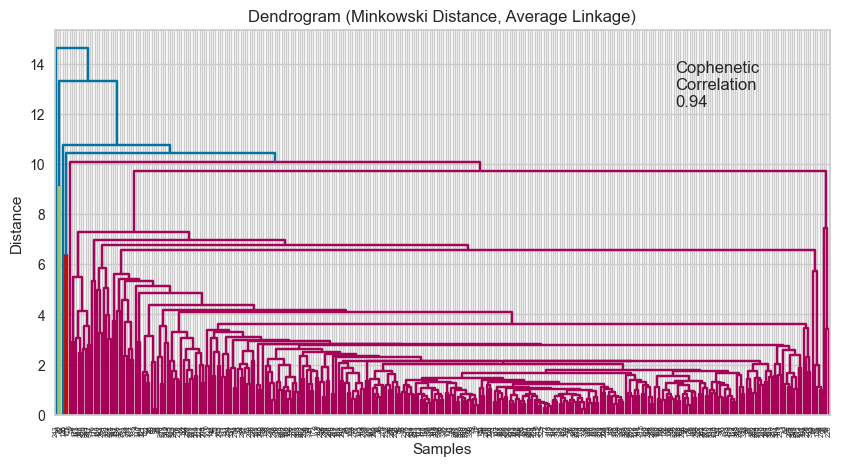

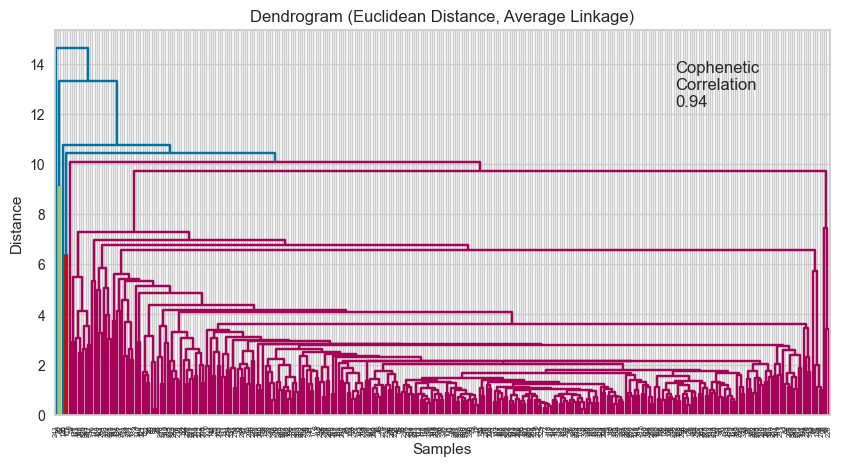

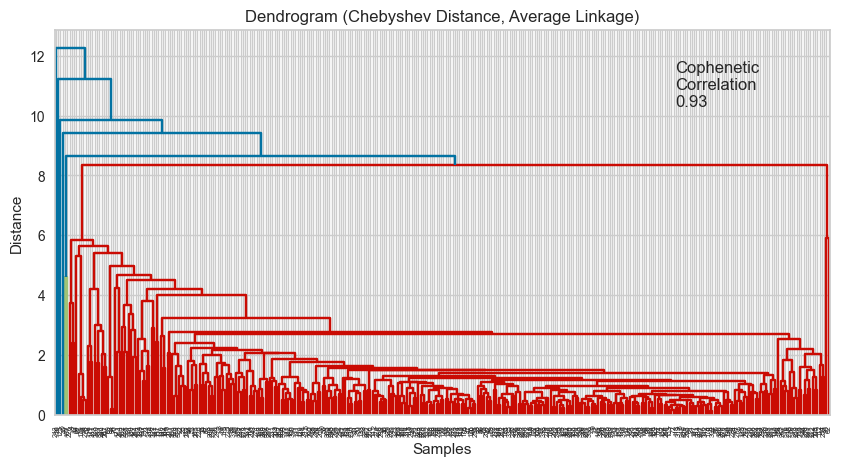

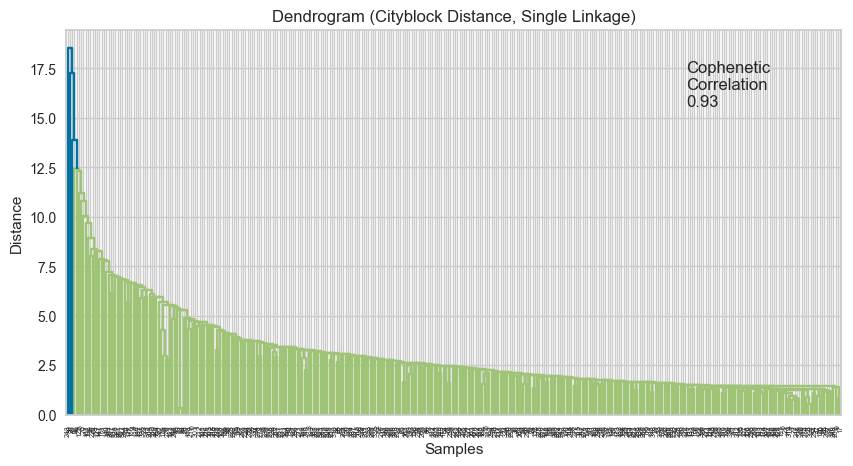

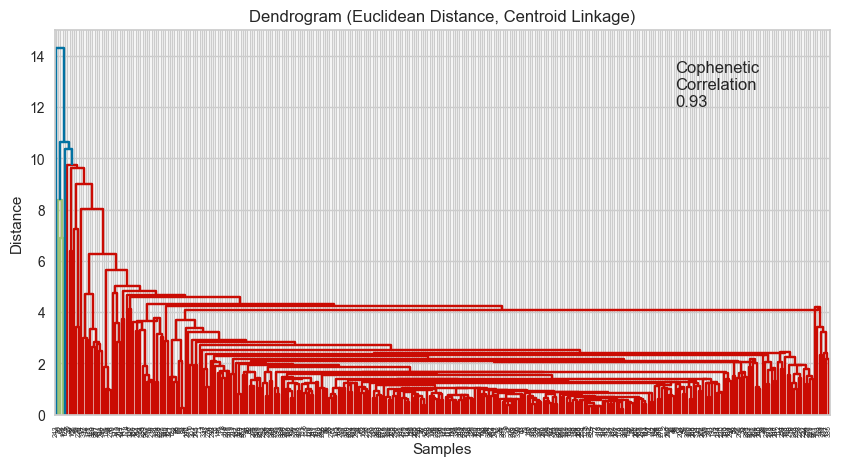

...

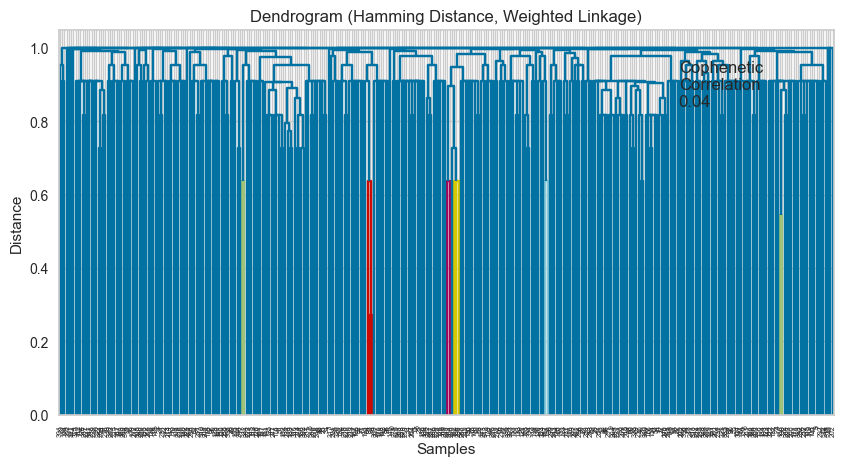

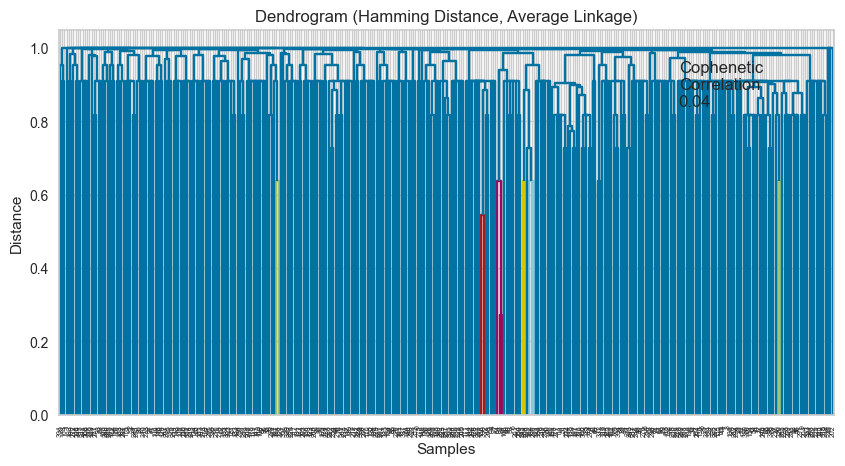

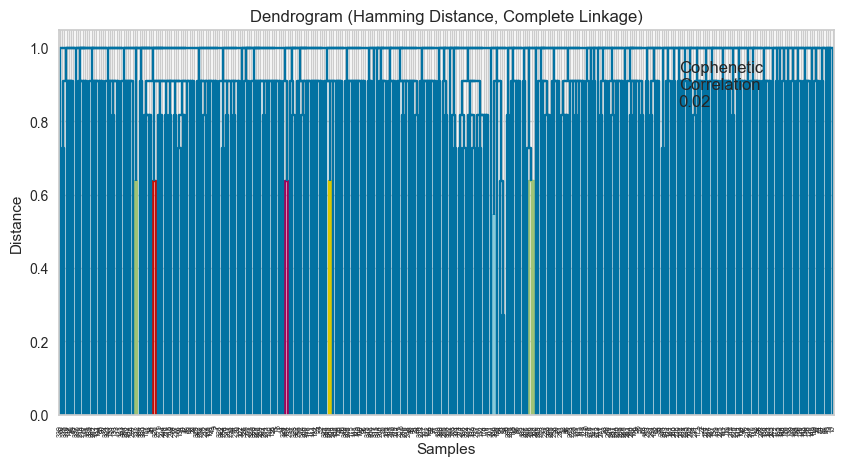

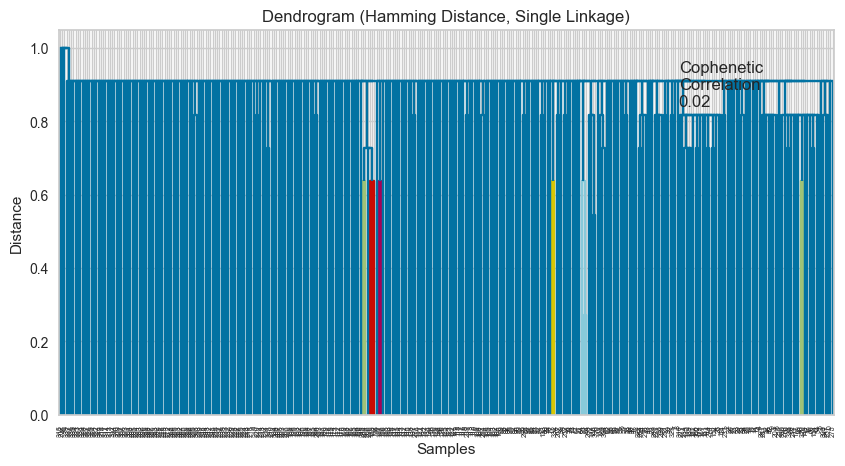

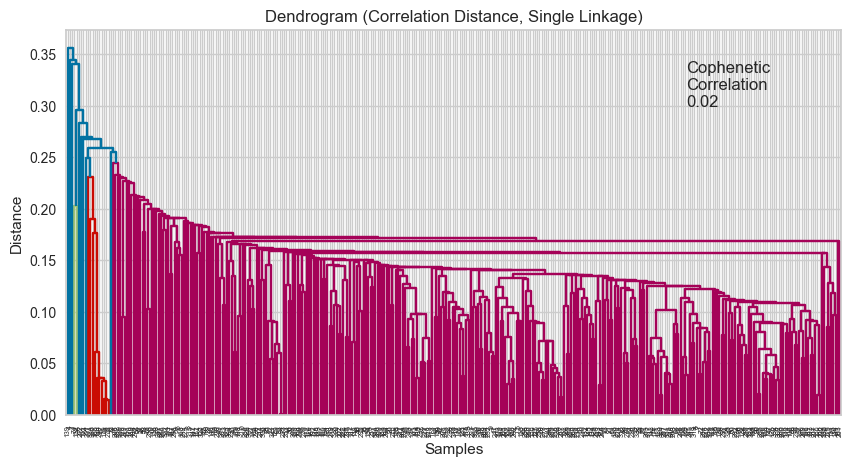

CPU times: total: 3min 15s
Wall time: 3min 24s


In [110]:
%%time
# Plot dendrograms for the top distance-linkage combinations
for i, row in coph_corr.iterrows():
    distance_metric = row['Distance']
    linkage_method = row['Linkage']
    C_corr =row['Cophenetic_Corr']
    
    # Perform hierarchical clustering
    Z = linkage(df2_scaled, method=linkage_method, metric=distance_metric)
    
    # Create a figure for each plot
    plt.figure(figsize=(10, 5))
    
    # Plot the dendrogram
    dendrogram(Z)
    
    # Add title and labels
    plt.title(f'Dendrogram ({distance_metric.capitalize()} Distance, {linkage_method.capitalize()} Linkage)')
    plt.annotate(f"Cophenetic\nCorrelation\n{C_corr:0.2f}",(0.80, 0.80),xycoords="axes fraction",)
    plt.xlabel('Samples')
    plt.ylabel('Distance')
    
    # Show the plot
    plt.show()

In [80]:
coph_corr.head()

,Distance,Linkage,Cophenetic_Corr
30,minkowski,average,0.942
2,euclidean,average,0.942
9,chebyshev,average,0.934
21,cityblock,single,0.933
5,euclidean,centroid,0.931


**Notes**
* Dendrodrams with high cophenetic correlation presents a hierarchical structure with a dominant cluster with few small clusters.
 * Dendrodrams with low cophenetic correlation start to present hierarchical structures with separate and distinct clusters.
* Low cophenetic correlations suggesting that the hierarchical clustering poorly captures the original distances between data points. It indicates that the clustering structure (the dendrogram) is not a good fit for the data and does not accurately represent the relationships between the points.
* The clusters will be selected from the dredrogram with the cophenetic correlation is maximum, this is with  **euclidean distance and average linkage**.
* 8 appears to be the appropriate number of clusters from the dendrogram euclidean distance and average linkage.

### AHC Modeling

In [81]:
#Model building
AHC_model = AgglomerativeClustering(n_clusters=8, affinity='euclidean', linkage='average')
AHC_model = AHC_model.fit(df2_scaled)
AHC_segments = AHC_model.fit_predict(df2_scaled)

### Cluster Profiling

In [82]:
# adding AHC cluster labels to the original dataframe with cluster labels
df_cl["AHC_segments"] = AHC_model.labels_

# adding AHC cluster labels to the scaled dataframe (num_cols) with cluster labels
df2_scaled_cl["AHC_segments"] = AHC_model.labels_

# adding AHC cluster labels to the scaled dataframe (all_cols) with cluster labels
df3_cl["AHC_segments"] = AHC_model.labels_

In [83]:
df_cl.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,KM_segments,AHC_segments
0,AAL,American Airlines Group,Industrials,Airlines,42.350,10.000,1.687,135,51,-604000000,7610000000,11.390,668129938.500,3.718,-8.784,2,2
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240,8.339,2.198,130,77,51000000,5144000000,3.150,1633015873.000,18.806,-8.750,2,2
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910,11.301,1.274,21,67,938000000,4423000000,2.940,1504421769.000,15.276,-0.394,2,2
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940,13.977,1.358,9,180,-240840000,629551000,1.260,499643650.800,74.556,4.200,0,2
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320,-1.828,1.701,14,272,315120000,696878000,0.310,2247993548.000,178.452,1.060,0,2


In [84]:
df2_scaled_cl.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,KM_segments,AHC_segments
0,-0.393,0.494,0.273,0.990,-0.211,-0.339,1.554,1.309,0.108,-0.652,-0.507,2,2
1,-0.221,0.355,1.137,0.938,0.077,-0.002,0.928,0.057,1.250,-0.312,-0.504,2,2
2,-0.367,0.602,-0.427,-0.193,-0.033,0.454,0.744,0.025,1.098,-0.392,0.095,2,2
3,0.134,0.826,-0.285,-0.317,1.218,-0.152,-0.220,-0.231,-0.092,0.947,0.424,0,2
4,-0.261,-0.493,0.296,-0.266,2.237,0.134,-0.203,-0.375,1.978,3.293,0.199,0,2


In [85]:
df3_cl.head()

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,KM_segments,AHC_segments
0,-0.393,0.494,0.273,0.990,-0.211,-0.339,1.554,1.309,0.108,-0.652,-0.507,AAL,American Airlines Group,Industrials,Airlines,2,2
1,-0.221,0.355,1.137,0.938,0.077,-0.002,0.928,0.057,1.250,-0.312,-0.504,ABBV,AbbVie,Health Care,Pharmaceuticals,2,2
2,-0.367,0.602,-0.427,-0.193,-0.033,0.454,0.744,0.025,1.098,-0.392,0.095,ABT,Abbott Laboratories,Health Care,Health Care Equipment,2,2
3,0.134,0.826,-0.285,-0.317,1.218,-0.152,-0.220,-0.231,-0.092,0.947,0.424,ADBE,Adobe Systems Inc,Information Technology,Application Software,0,2
4,-0.261,-0.493,0.296,-0.266,2.237,0.134,-0.203,-0.375,1.978,3.293,0.199,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,0,2


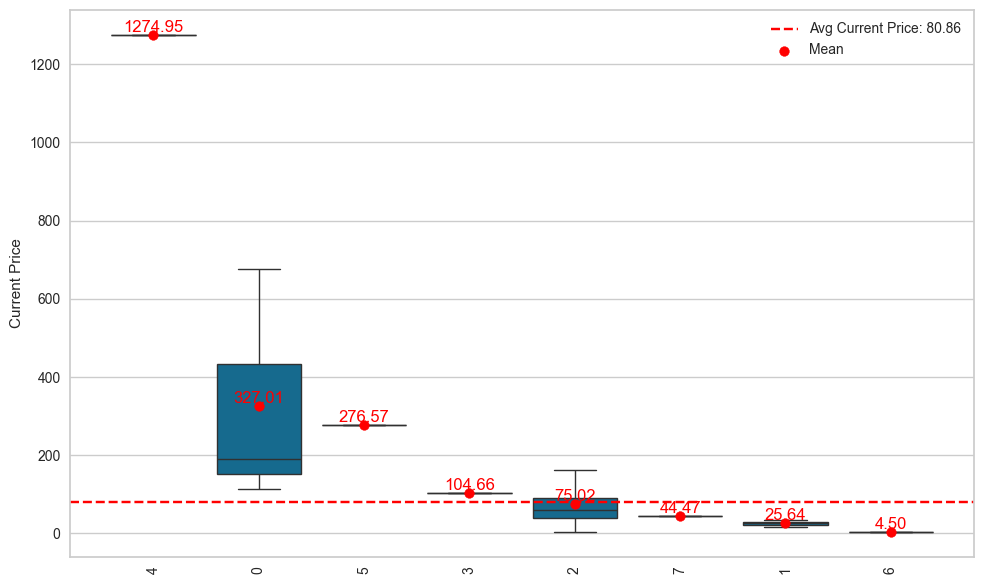

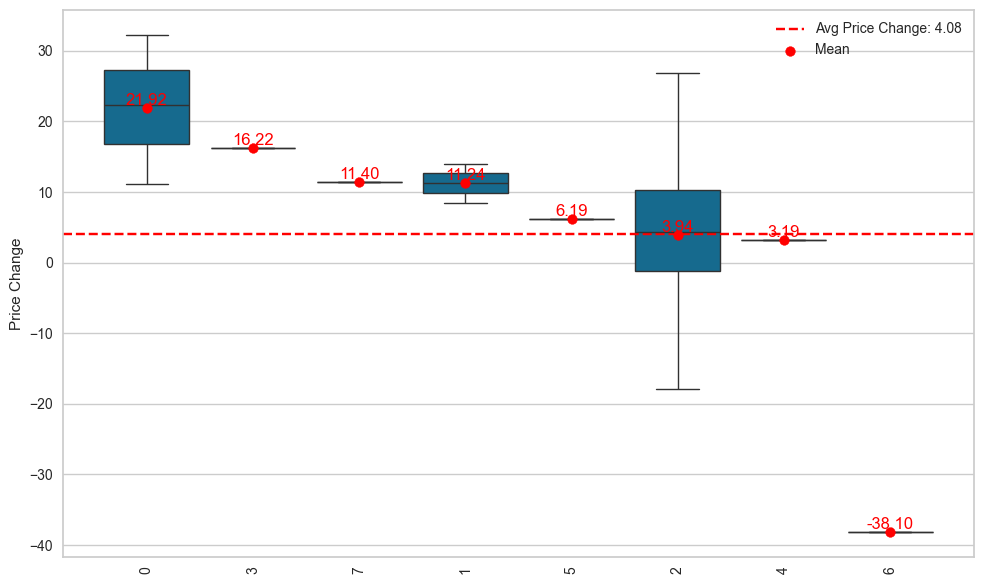

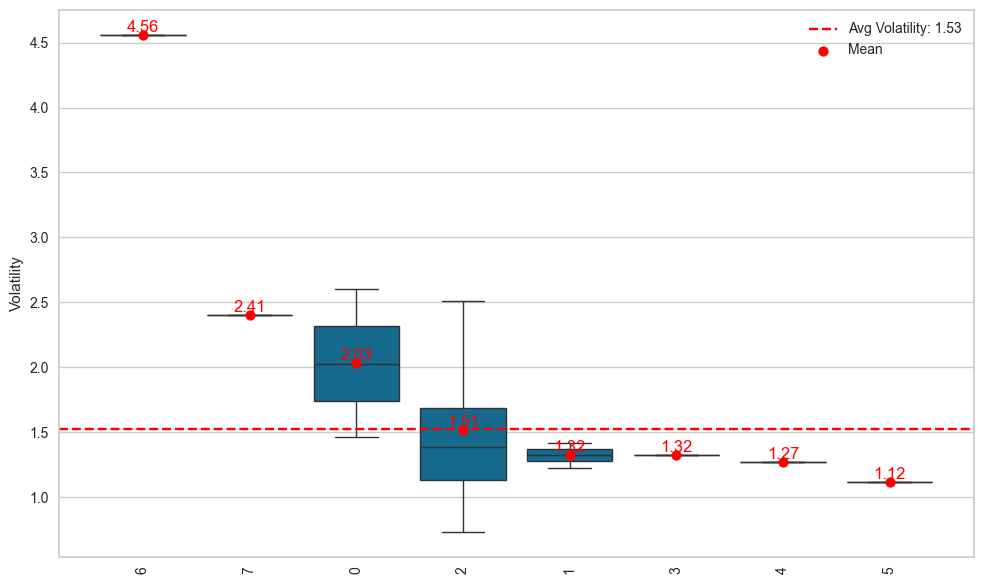

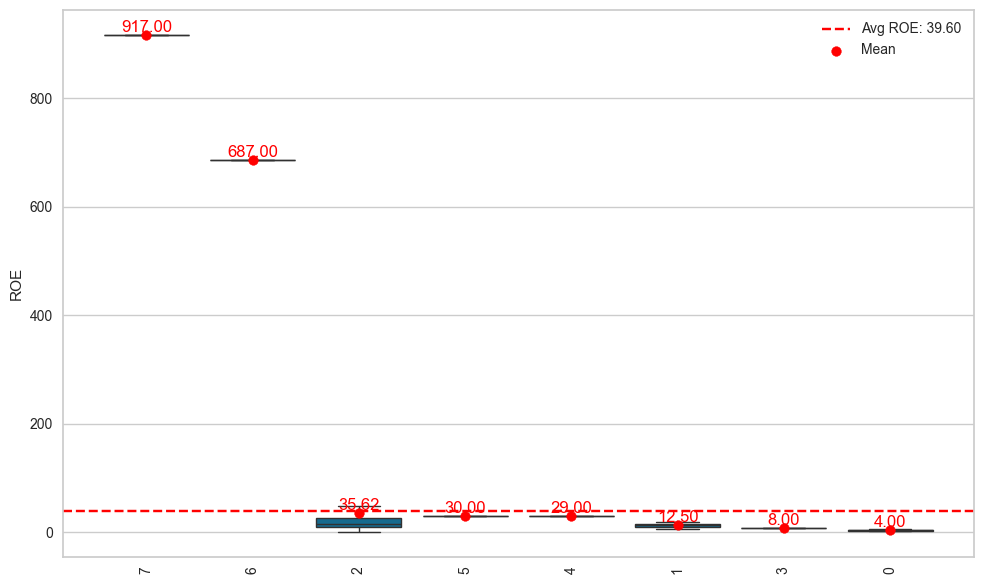

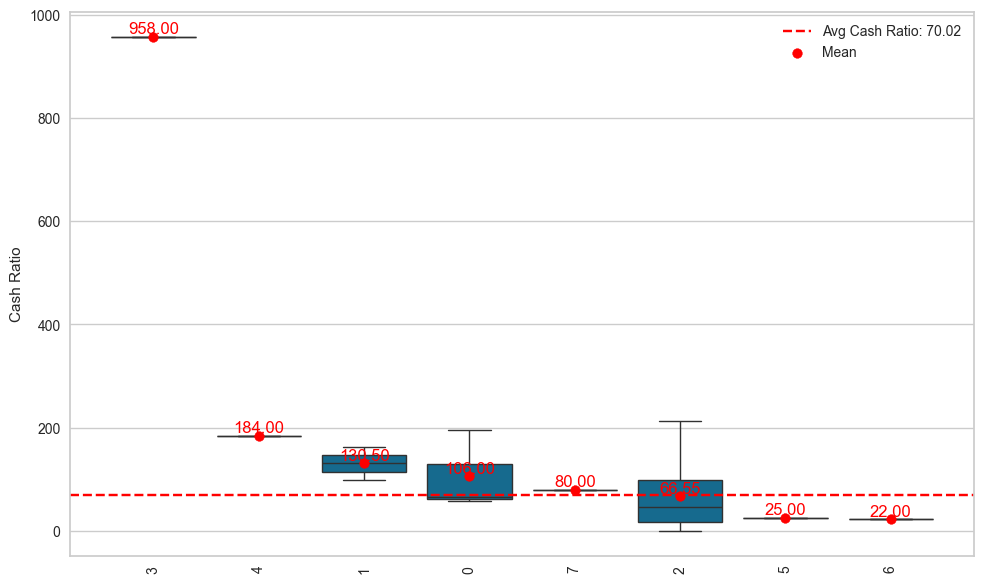

...

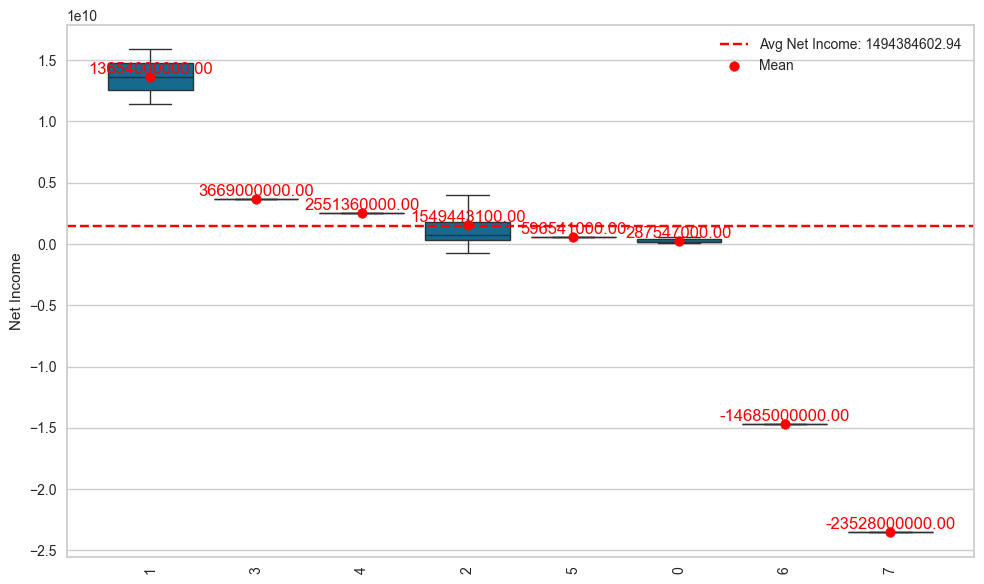

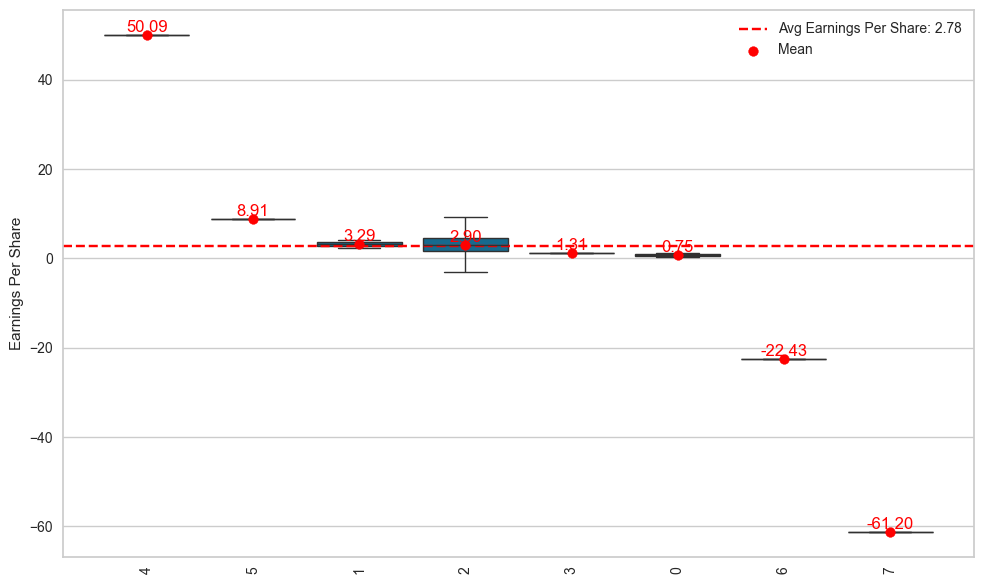

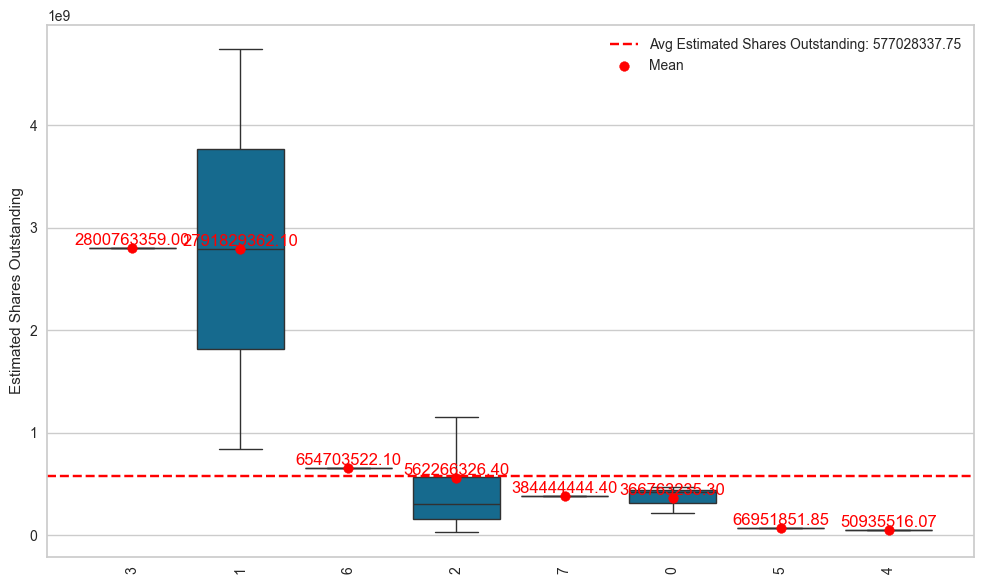

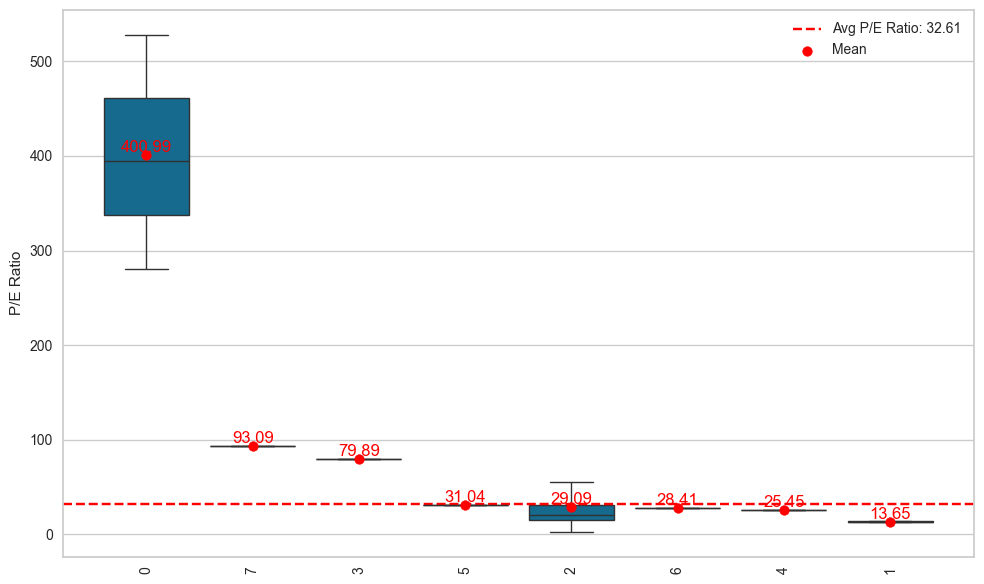

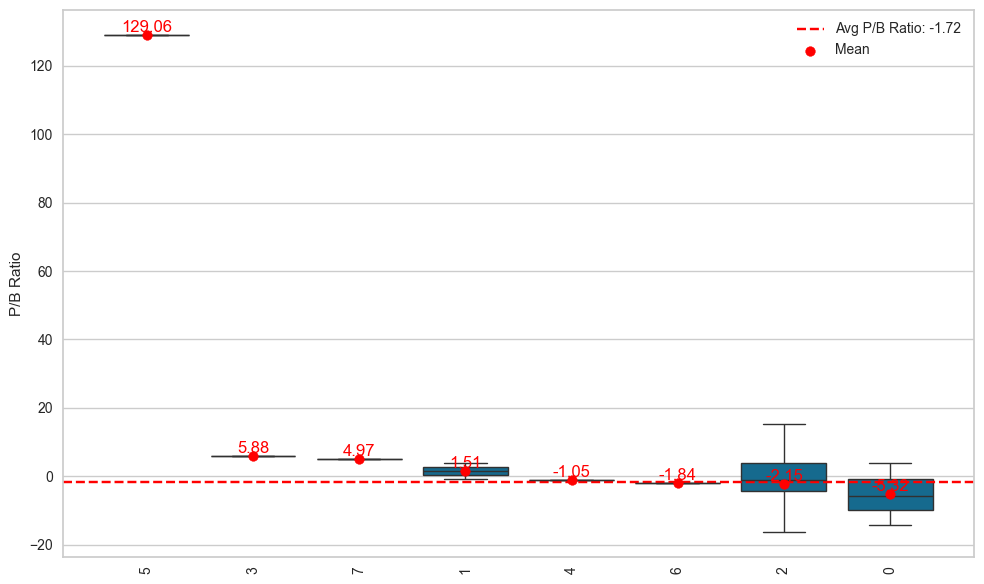

In [87]:
for i in num_cols:
    plt.figure(figsize=(10, 6))
    boxplot_by_group(df_cl, 'AHC_segments', i, False)

In [88]:
# cluster profiling
km_cluster_profile = df_cl.groupby("AHC_segments").mean()
km_cluster_profile["count_in_each_segment"] = (df_cl.groupby("AHC_segments")["Ticker Symbol"].count().values)
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,count_in_each_segment
AHC_segments,,,,,,,,,,,,
4,1274.949951,3.190527,1.268340,29.000000,184.000000,-1671386000.000000,2551360000.000000,50.090000,50935516.070000,25.453183,-1.052429,1
0,327.006671,21.917380,2.029752,4.000000,106.000000,698240666.666667,287547000.000000,0.750000,366763235.300000,400.989188,-5.322376,3
5,276.570007,6.189286,1.116976,30.000000,25.000000,90885000.000000,596541000.000000,8.910000,66951851.850000,31.040405,129.064585,1
3,104.660004,16.224320,1.320606,8.000000,958.000000,592000000.000000,3669000000.000000,1.310000,2800763359.000000,79.893133,5.884467,1
2,75.017416,3.937751,1.513415,35.621212,66.545455,-39846757.575758,1549443100.000000,2.904682,562266326.402576,29.091275,-2.146308,330
7,44.470001,11.397804,2.405408,917.000000,80.000000,698000000.000000,-23528000000.000000,-61.200000,384444444.400000,93.089287,4.970809,1
1,25.640000,11.237908,1.322355,12.500000,130.500000,16755500000.000000,13654000000.000000,3.295000,2791829362.100000,13.649696,1.508484,2
6,4.500000,-38.101788,4.559815,687.000000,22.000000,-3283000000.000000,-14685000000.000000,-22.430000,654703522.100000,28.407929,-1.840528,1


**Notes**
* Current Price top clusters are 4, 0, 5
* Price Change top clusters are 0, 3, 7
* Volatility top clusters are 6, 7, 0
* ROE top clusters are 7, 6, 2
* Cash Ratio top clusters are 3, 4, 1
* Net Cash Flow top clusters are 1, 0, 7
* Net Income top clusters are 1, 3, 4
* Earnings per Share top clusters are 4, 5, 1
* Estimated Shares Oustanding top clusters are 3, 1, 6
* P/E Ratio top clusters are 0, 7, 3
* P/B Ratio top clusters are 5, 3, 7 


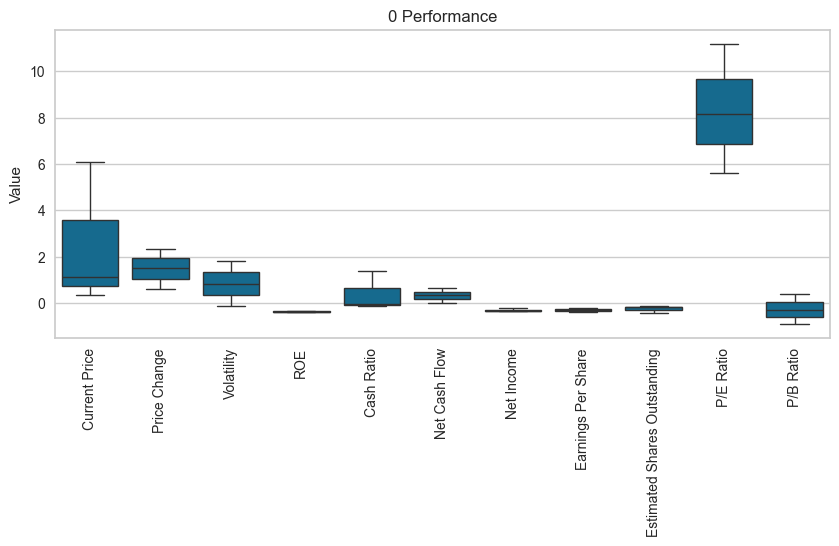

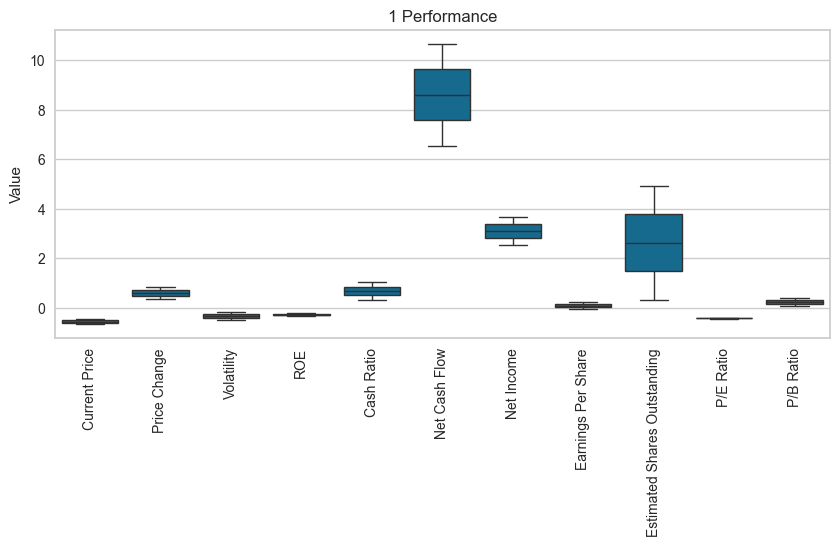

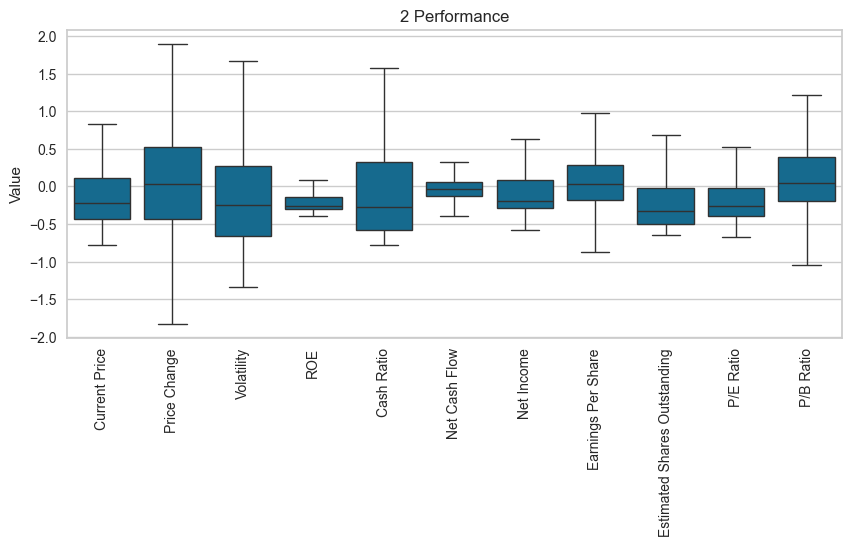

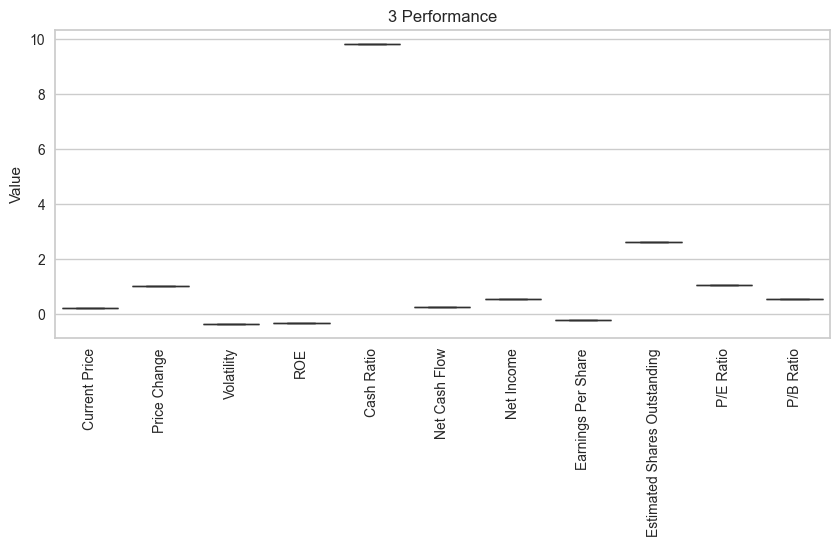

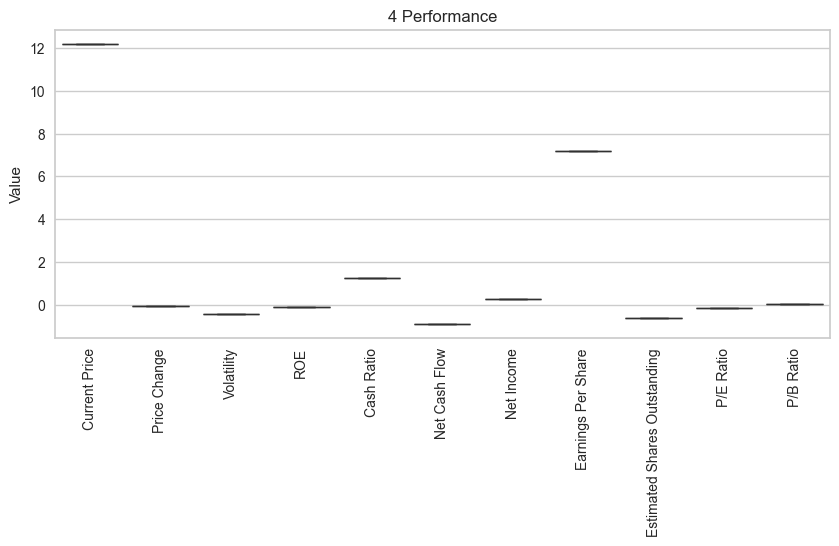

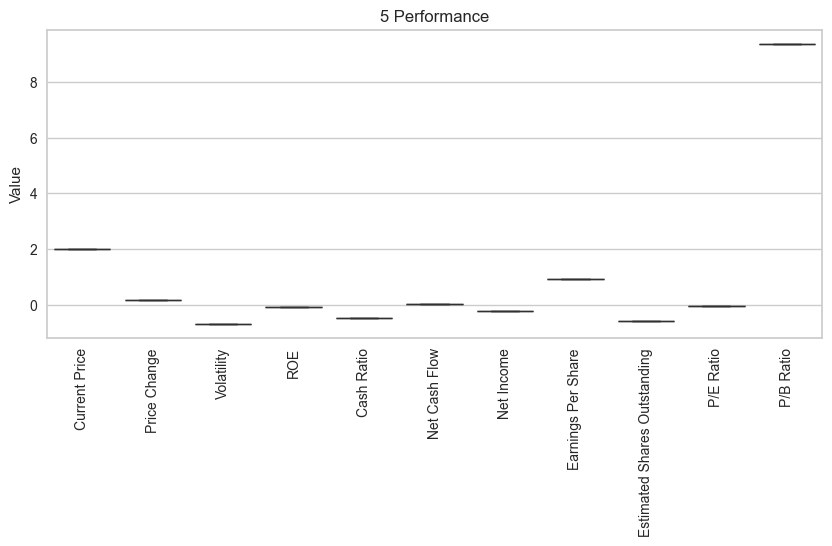

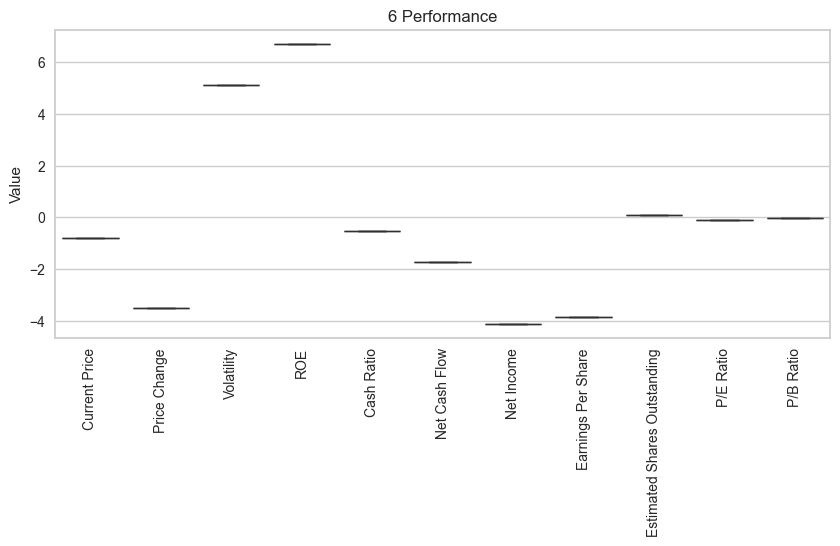

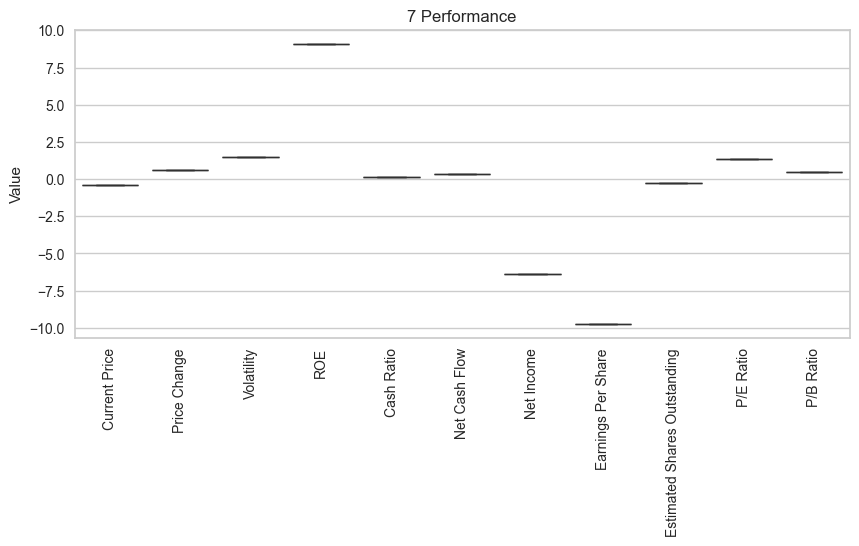

In [89]:
for label in range(0,8):
    plt.figure(figsize=(10, 4))
    boxplot_by_label(df3_cl,'AHC_segments',label, False)

In [90]:
# cluster profiling
km_cluster_profile = df3_cl.groupby("AHC_segments").mean()
km_cluster_profile["count_in_each_segment"] = (df_cl.groupby("AHC_segments")["Ticker Symbol"].count().values)
km_cluster_profile.style.highlight_max(color="lightgreen", axis=0)

,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,KM_segments,count_in_each_segment
AHC_segments,,,,,,,,,,,,,
0,2.513965,1.488004,0.852517,-0.369243,0.398462,0.330693,-0.306744,-0.308093,-0.248951,8.318604,-0.258428,7.000000,1
1,-0.564007,0.597207,-0.344579,-0.281074,0.669815,8.592722,3.090627,0.078798,2.622293,-0.428216,0.231367,3.500000,3
2,-0.059696,-0.011715,-0.021258,-0.041241,-0.038522,-0.049079,0.013994,0.019462,-0.017478,-0.079517,-0.030693,2.069697,1
3,0.243055,1.013134,-0.347539,-0.327752,9.834905,0.276029,0.552725,-0.222962,2.632871,1.067680,0.545140,0.000000,1
4,12.195670,-0.074042,-0.435986,-0.109922,1.262362,-0.888563,0.268653,7.192572,-0.622886,-0.161672,0.047742,1.000000,330
5,1.998837,0.176091,-0.692132,-0.099549,-0.498664,0.018187,-0.228206,0.932390,-0.603923,-0.035502,9.377562,1.000000,1
6,-0.779918,-3.518321,5.134029,6.715418,-0.531891,-1.717796,-4.112338,-3.831916,0.091966,-0.094948,-0.008768,6.000000,2
7,-0.371689,0.610544,1.488223,9.101176,0.110496,0.330570,-6.359977,-9.725729,-0.228017,1.365673,0.479628,6.000000,1


**Notes**
* Cluster 0 considers high P/E Ratio stocks
* Cluster 1 considers high Net Cash Flow stocks
* Cluster 2 considers average perfoming stocks
* Cluster 3 considers high Cash Ratio stocks
* Cluster 4 considers high Earnings Per Share stocks
* Cluster 5 considers high P/B Ratio stocks
* Cluster 6 considers high Volatility & ROE and Volality stocks
* Cluster 7 considers high ROE stocks

In [268]:
Clusters_ahc = pd.DataFrame({
    'Cluster': range(8),  # 0 to 7
    'Tendency': [
        'P/E Ratio',
        'Net Cash Flow',
        'Average perfom',
        'Cash Ratio',
        'Current Price & Earnings Per Share',
        'P/B Ratio',
        'ROE & Volatility',
        'ROE'
    ]
})

In [269]:
Clusters_ahc['Sectors']=df_cl.groupby('AHC_segments')['GICS Sector'].nunique()
Clusters_ahc['Companies']=df_cl.groupby('AHC_segments')['Security'].nunique()
Clusters_ahc

,Cluster,Tendency,Sectors,Companies
0,0,P/E Ratio,3,3
1,1,Net Cash Flow,2,2
2,2,Average perfom,11,330
3,3,Cash Ratio,1,1
4,4,Current Price & Earnings Per Share,1,1
5,5,P/B Ratio,1,1
6,6,ROE & Volatility,1,1
7,7,ROE,1,1


In [145]:
df_cl.groupby('AHC_segments')['Ticker Symbol'].nunique() / df_cl['Ticker Symbol'].nunique() * 100

AHC_segments
4    0.294
0    0.882
5    0.294
3    0.294
2   97.059
7    0.294
1    0.588
6    0.294
Name: Ticker Symbol, dtype: float64

**Notes**
* Created "Tendency" label for cluster identification based on cluster performance.


In the stocks group with P/E Ratio tendency, there are 3 companies present.
Companies: Alexion Pharmaceuticals, Amazon.com Inc, Netflix Inc.

In the stocks group with P/E Ratio tendency, there are 3 economic sectors represented.
Economic Sectors: Health Care, Consumer Discretionary, Information Technology

Statistical summary for the stocks group with P/E Ratio tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,3.00,327.01,304.55,114.38,152.56,190.75,433.32,675.89
Price Change,3.00,21.92,10.57,11.15,16.74,22.34,27.30,32.27
Volatility,3.00,2.03,0.57,1.46,1.74,2.02,2.31,2.61
ROE,3.00,4.00,2.00,2.00,3.00,4.00,5.00,6.00
Cash Ratio,3.00,106.00,77.16,58.00,61.50,65.00,130.00,195.00
Net Cash Flow,3e+00,7e+08,6e+08,7e+07,4e+08,7e+08,1e+09,1e+09
Net Income,3e+00,3e+08,3e+08,1e+08,1e+08,1e+08,4e+08,6e+08
Earnings Per Share,3.00,0.75,0.50,0.29,0.48,0.68,0.98,1.28
Estimated Shares Outstanding,3e+00,4e+08,1e+08,2e+08,3e+08,4e+08,4e+08,5e+08
P/E Ratio,3.00,400.99,123.89,280.51,337.46,394.41,461.23,528.04


Finantial performance for the stocks group with Cash Ratio tendency (normalized metrics):


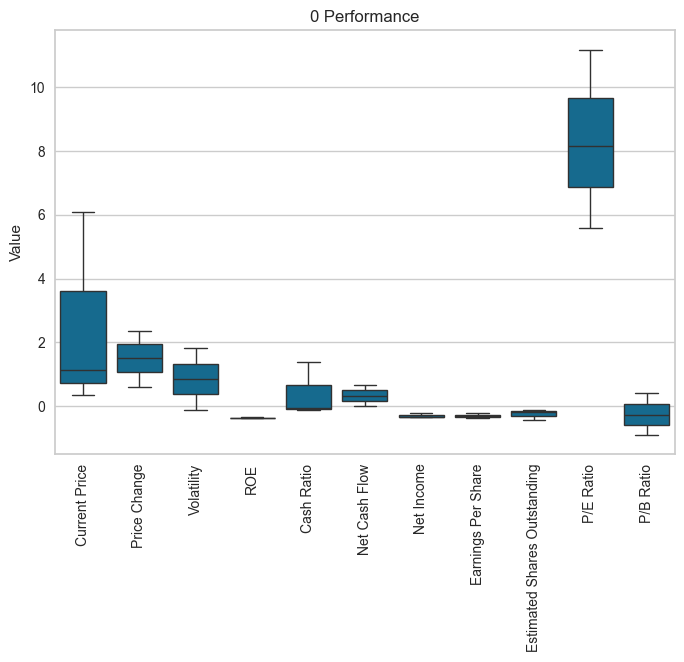

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Net Cash Flow tendency, there are 2 companies present.
Companies: Bank of America Corp, Intel Corp.

In the stocks group with Net Cash Flow tendency, there are 2 economic sectors represented.
Economic Sectors: Financials, Information Technology

Statistical summary for the stocks group with Net Cash Flow tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,2.00,25.64,12.46,16.83,21.24,25.64,30.05,34.45
Price Change,2.00,11.24,3.96,8.44,9.84,11.24,12.64,14.04
Volatility,2.00,1.32,0.14,1.23,1.27,1.32,1.37,1.42
ROE,2.00,12.50,9.19,6.00,9.25,12.50,15.75,19.00
Cash Ratio,2.00,130.50,44.55,99.00,114.75,130.50,146.25,162.00
Net Cash Flow,2e+00,2e+10,6e+09,1e+10,1e+10,2e+10,2e+10,2e+10
Net Income,2e+00,1e+10,3e+09,1e+10,1e+10,1e+10,1e+10,2e+10
Earnings Per Share,2.00,3.29,1.25,2.41,2.85,3.29,3.74,4.18
Estimated Shares Outstanding,2e+00,3e+09,3e+09,8e+08,2e+09,3e+09,4e+09,5e+09
P/E Ratio,2.00,13.65,0.91,13.00,13.33,13.65,13.97,14.29


Finantial performance for the stocks group with Current Price tendency (normalized metrics):


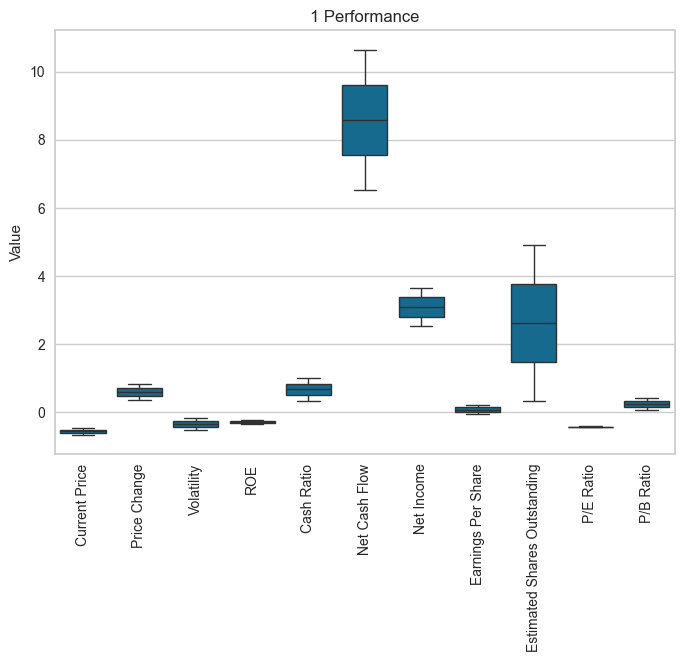

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Average perfom tendency, there are 330 companies present.
Companies: American Airlines Group, AbbVie, Abbott Laboratories, Adobe Systems Inc, Analog Devices, Inc., Archer-Daniels-Midland Co, Ameren Corp, American Electric Power, AFLAC Inc, American International Group, Inc., Apartment Investment & Mgmt, Assurant Inc, Arthur J. Gallagher & Co., Akamai Technologies Inc, Albemarle Corp, Alaska Air Group Inc, Allstate Corp, Allegion, Applied Materials Inc, AMETEK Inc, Affiliated Managers Group Inc, Amgen Inc, Ameriprise Financial, American Tower Corp A, AutoNation Inc, Anthem Inc., Aon plc, Anadarko Petroleum Corp, Amphenol Corp, Arconic Inc, Activision Blizzard, AvalonBay Communities, Inc., Broadcom, American Water Works Company Inc, American Express Co, Boeing Company, Baxter International Inc., BB&T Corporation, Bard (C.R.)

,count,mean,std,min,25%,50%,75%,max
Current Price,330.00,75.02,65.30,4.67,38.69,59.45,91.30,546.16
Price Change,330.00,3.94,11.77,-47.13,-1.18,4.41,10.32,55.05
Volatility,330.00,1.51,0.57,0.73,1.13,1.38,1.69,4.58
ROE,330.00,35.62,77.17,1.00,10.00,15.00,26.00,601.00
Cash Ratio,330.00,66.55,76.72,0.00,18.00,45.50,99.00,568.00
Net Cash Flow,3e+02,-4e+07,1e+09,-1e+10,-2e+08,-2e+05,2e+08,8e+09
Net Income,3e+02,2e+09,4e+09,-1e+10,4e+08,7e+08,2e+09,2e+10
Earnings Per Share,330.00,2.90,4.83,-35.55,1.58,2.96,4.64,19.52
Estimated Shares Outstanding,3e+02,6e+08,8e+08,3e+07,2e+08,3e+08,6e+08,6e+09
P/E Ratio,330.00,29.09,25.75,2.94,14.94,20.82,31.44,178.45


Finantial performance for the stocks group with Average perfom tendency (normalized metrics):


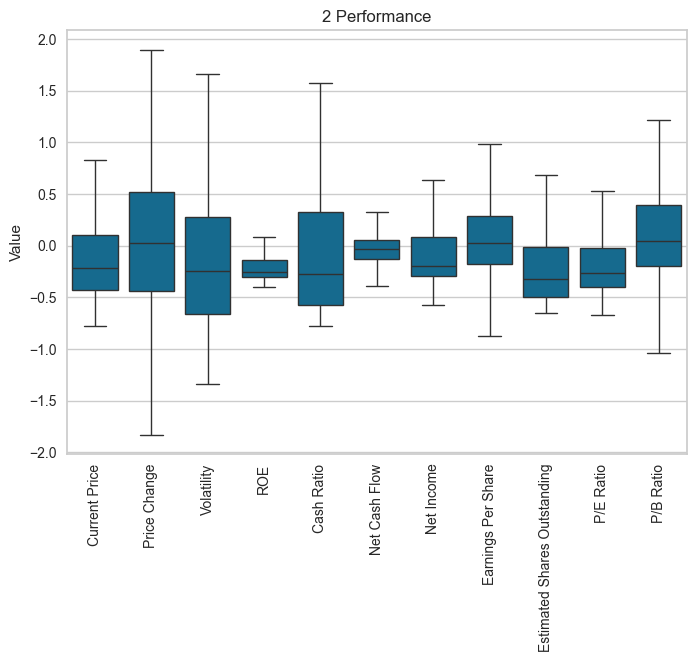

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Cash Ratio tendency, there are 1 companies present.
Companies: Facebook

In the stocks group with Cash Ratio tendency, there are 1 economic sectors represented.
Economic Sectors: Information Technology

Statistical summary for the stocks group with Cash Ratio tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,104.66,nan,104.66,104.66,104.66,104.66,104.66
Price Change,1.00,16.22,nan,16.22,16.22,16.22,16.22,16.22
Volatility,1.00,1.32,nan,1.32,1.32,1.32,1.32,1.32
ROE,1.00,8.00,nan,8.00,8.00,8.00,8.00,8.00
Cash Ratio,1.00,958.00,nan,958.00,958.00,958.00,958.00,958.00
Net Cash Flow,1e+00,6e+08,nan,6e+08,6e+08,6e+08,6e+08,6e+08
Net Income,1e+00,4e+09,nan,4e+09,4e+09,4e+09,4e+09,4e+09
Earnings Per Share,1.00,1.31,nan,1.31,1.31,1.31,1.31,1.31
Estimated Shares Outstanding,1e+00,3e+09,nan,3e+09,3e+09,3e+09,3e+09,3e+09
P/E Ratio,1.00,79.89,nan,79.89,79.89,79.89,79.89,79.89


Finantial performance for the stocks group with Volatility tendency (normalized metrics):


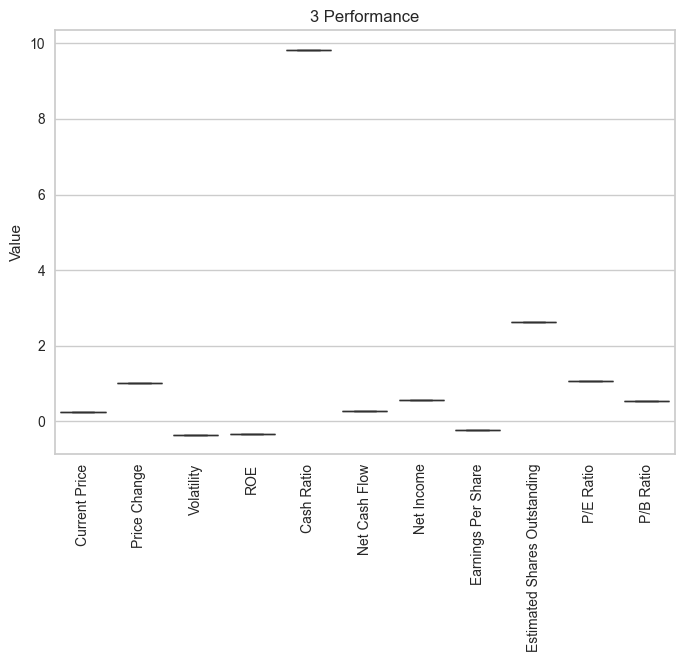

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with Current Price & Earnings Per Share tendency, there are 1 companies present.
Companies: Priceline.com Inc

In the stocks group with Current Price & Earnings Per Share tendency, there are 1 economic sectors represented.
Economic Sectors: Consumer Discretionary

Statistical summary for the stocks group with Current Price & Earnings Per Share tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,1274.95,nan,1274.95,1274.95,1274.95,1274.95,1274.95
Price Change,1.00,3.19,nan,3.19,3.19,3.19,3.19,3.19
Volatility,1.00,1.27,nan,1.27,1.27,1.27,1.27,1.27
ROE,1.00,29.00,nan,29.00,29.00,29.00,29.00,29.00
Cash Ratio,1.00,184.00,nan,184.00,184.00,184.00,184.00,184.00
Net Cash Flow,1e+00,-2e+09,nan,-2e+09,-2e+09,-2e+09,-2e+09,-2e+09
Net Income,1e+00,3e+09,nan,3e+09,3e+09,3e+09,3e+09,3e+09
Earnings Per Share,1.00,50.09,nan,50.09,50.09,50.09,50.09,50.09
Estimated Shares Outstanding,1e+00,5e+07,nan,5e+07,5e+07,5e+07,5e+07,5e+07
P/E Ratio,1.00,25.45,nan,25.45,25.45,25.45,25.45,25.45


Finantial performance for the stocks group with ROE tendency (normalized metrics):


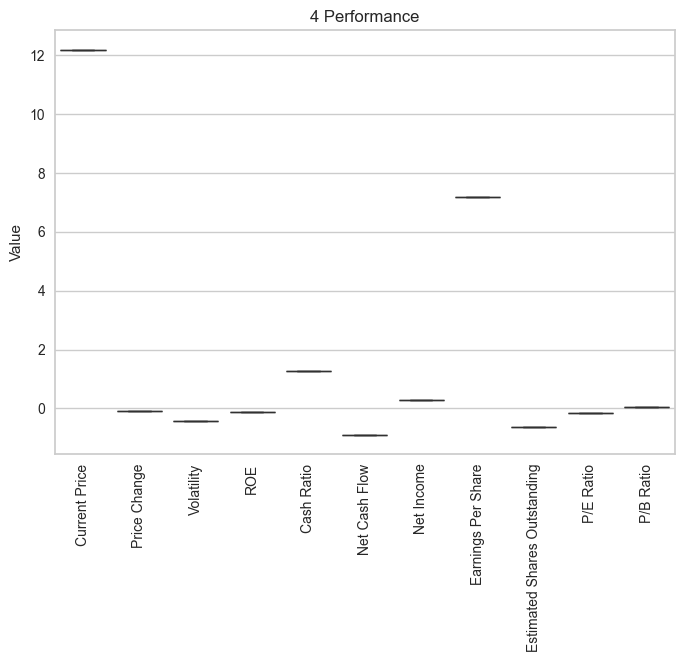

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with P/B Ratio tendency, there are 1 companies present.
Companies: Alliance Data Systems

In the stocks group with P/B Ratio tendency, there are 1 economic sectors represented.
Economic Sectors: Information Technology

Statistical summary for the stocks group with P/B Ratio tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,276.57,nan,276.57,276.57,276.57,276.57,276.57
Price Change,1.00,6.19,nan,6.19,6.19,6.19,6.19,6.19
Volatility,1.00,1.12,nan,1.12,1.12,1.12,1.12,1.12
ROE,1.00,30.00,nan,30.00,30.00,30.00,30.00,30.00
Cash Ratio,1.00,25.00,nan,25.00,25.00,25.00,25.00,25.00
Net Cash Flow,1e+00,9e+07,nan,9e+07,9e+07,9e+07,9e+07,9e+07
Net Income,1e+00,6e+08,nan,6e+08,6e+08,6e+08,6e+08,6e+08
Earnings Per Share,1.00,8.91,nan,8.91,8.91,8.91,8.91,8.91
Estimated Shares Outstanding,1e+00,7e+07,nan,7e+07,7e+07,7e+07,7e+07,7e+07
P/E Ratio,1.00,31.04,nan,31.04,31.04,31.04,31.04,31.04


Finantial performance for the stocks group with Estimated Shares Oustanding & Net Income tendency (normalized metrics):


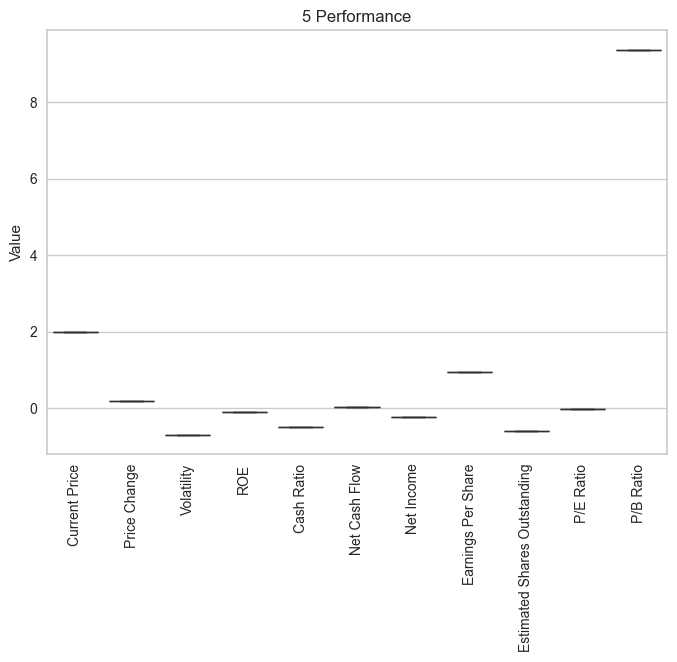

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with ROE & Volatility tendency, there are 1 companies present.
Companies: Chesapeake Energy

In the stocks group with ROE & Volatility tendency, there are 1 economic sectors represented.
Economic Sectors: Energy

Statistical summary for the stocks group with ROE & Volatility tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,4.50,nan,4.50,4.50,4.50,4.50,4.50
Price Change,1.00,-38.10,nan,-38.10,-38.10,-38.10,-38.10,-38.10
Volatility,1.00,4.56,nan,4.56,4.56,4.56,4.56,4.56
ROE,1.00,687.00,nan,687.00,687.00,687.00,687.00,687.00
Cash Ratio,1.00,22.00,nan,22.00,22.00,22.00,22.00,22.00
Net Cash Flow,1e+00,-3e+09,nan,-3e+09,-3e+09,-3e+09,-3e+09,-3e+09
Net Income,1e+00,-1e+10,nan,-1e+10,-1e+10,-1e+10,-1e+10,-1e+10
Earnings Per Share,1.00,-22.43,nan,-22.43,-22.43,-22.43,-22.43,-22.43
Estimated Shares Outstanding,1e+00,7e+08,nan,7e+08,7e+08,7e+08,7e+08,7e+08
P/E Ratio,1.00,28.41,nan,28.41,28.41,28.41,28.41,28.41


Finantial performance for the stocks group with ROE & Volality tendency (normalized metrics):


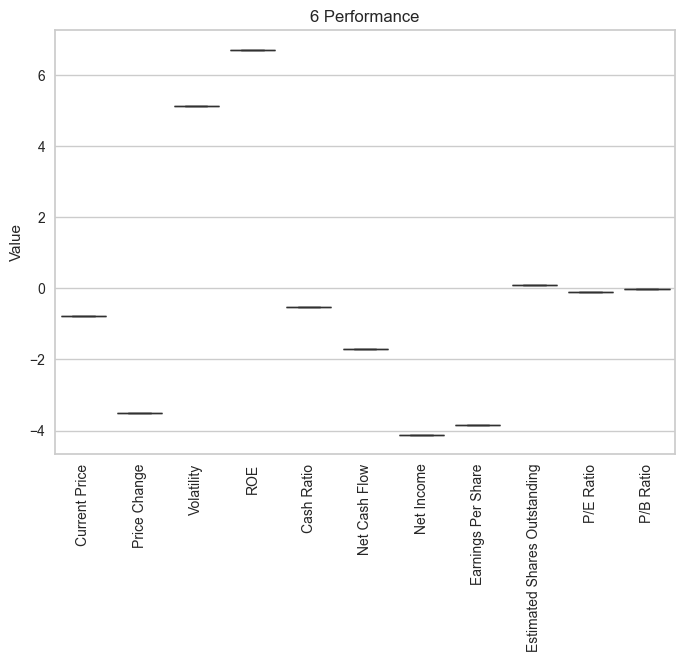

--------------------------------------------------------------------------------------------------------------------------------------------
In the stocks group with ROE tendency, there are 1 companies present.
Companies: Apache Corporation

In the stocks group with ROE tendency, there are 1 economic sectors represented.
Economic Sectors: Energy

Statistical summary for the stocks group with ROE tendency:


,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,44.47,nan,44.47,44.47,44.47,44.47,44.47
Price Change,1.00,11.40,nan,11.40,11.40,11.40,11.40,11.40
Volatility,1.00,2.41,nan,2.41,2.41,2.41,2.41,2.41
ROE,1.00,917.00,nan,917.00,917.00,917.00,917.00,917.00
Cash Ratio,1.00,80.00,nan,80.00,80.00,80.00,80.00,80.00
Net Cash Flow,1e+00,7e+08,nan,7e+08,7e+08,7e+08,7e+08,7e+08
Net Income,1e+00,-2e+10,nan,-2e+10,-2e+10,-2e+10,-2e+10,-2e+10
Earnings Per Share,1.00,-61.20,nan,-61.20,-61.20,-61.20,-61.20,-61.20
Estimated Shares Outstanding,1e+00,4e+08,nan,4e+08,4e+08,4e+08,4e+08,4e+08
P/E Ratio,1.00,93.09,nan,93.09,93.09,93.09,93.09,93.09


Finantial performance for the stocks group with P/E Ratio tendency (normalized metrics):


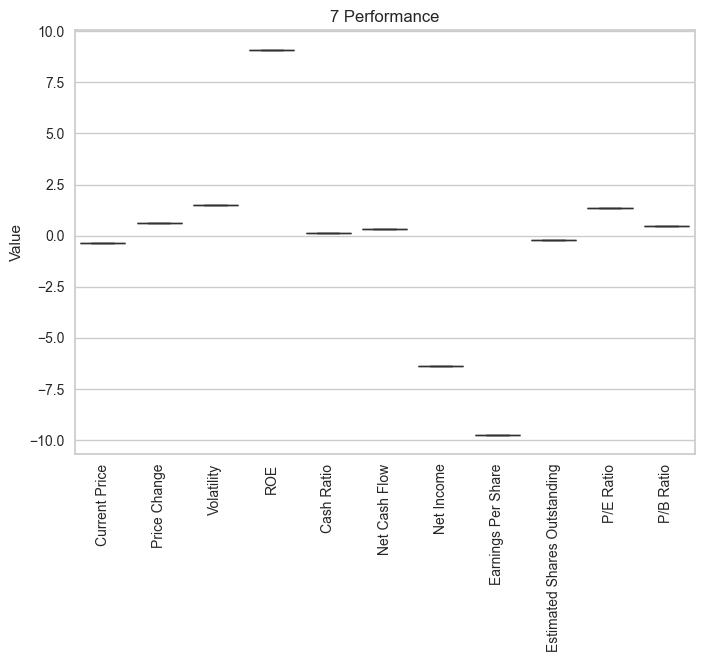

--------------------------------------------------------------------------------------------------------------------------------------------


In [270]:
# Report by Cluster
for segment in range(0,8):
    #companies by stock groups
    print("In the stocks group with {} tendency, there are {} companies present.".format(Clusters_ahc.loc[segment,'Tendency'],Clusters_ahc.loc[segment,'Companies']))
    print("Companies:",(", ".join(df3_cl[df3_cl['AHC_segments'] == segment]["Security"].unique().tolist())))
    print()

    #Economic sectors by stock groups
    print("In the stocks group with {} tendency, there are {} economic sectors represented.".format(Clusters_ahc.loc[segment,'Tendency'],Clusters_ahc.loc[segment,'Sectors']))
    print("Economic Sectors:",(", ".join(df3_cl[df3_cl['AHC_segments'] == segment]["GICS Sector"].unique().tolist())))
    print()
        
    #Statistical summary by stoc groups
    print("Statistical summary for the stocks group with {} tendency:".format(Clusters_ahc.loc[segment,'Tendency']))
    scientific_columns = ['Net Cash Flow', 'Net Income', 'Estimated Shares Outstanding']
    df_cl_summary = df_cl[df_cl['AHC_segments'] == segment].describe().T
    def format_value(value, col):
        if col in scientific_columns:
            return "{:.0e}".format(value)  # Use scientific notation
        else:
            return "{:.2f}".format(value)  # Two decimal places
    formatted_output = df_cl_summary.apply(lambda row: [format_value(val, row.name) for val in row], axis=1)
    formatted_df = pd.DataFrame(formatted_output.tolist(), index=df_cl_summary.index, columns=df_cl_summary.columns)
    display(formatted_df)

    #Boxplot
    print("Finantial performance for the stocks group with {} tendency (normalized metrics):".format(Clusters_km.loc[segment,'Tendency']))
    boxplot_by_label(df3_cl,'AHC_segments',segment, False)

    print("-" * 140)

**Notes**
* Generated a personalized investment strategy report with: Companies by stock group, Economic sectors by stock group, stock group Statistical summary (table and graphic).


## Consolidated notes on Hierarchical Clustering

* We see that **the cophenetic correlation** is maximum with **minkowski distance and average linkage**. Being calculated with default value (p=2), minkowski distance is equal to euclidean distance, hence can also be stated  the cophenetic correlation is maximum with  **euclidean distance and average linkage**.
* The cophenetic correlation with **chebyshev distance and average linkage** is slightly less than the combination with maximum cophenetic correlation.
* The third highest cophenetic correlation is achieved with **citiblok or manhattan distance and single linkage**.
* Dendrodrams with high cophenetic correlation presents a hierarchical structure with a dominant cluster with few small clusters.
 * Dendrodrams with low cophenetic correlation start to present hierarchical structures with separate and distinct clusters.
* Low cophenetic correlations suggesting that the hierarchical clustering poorly captures the original distances between data points. It indicates that the clustering structure (the dendrogram) is not a good fit for the data and does not accurately represent the relationships between the points.
* The clusters will be selected from the dredrogram with the cophenetic correlation is maximum, this is with  **euclidean distance and average linkage**.
* 8 appears to be the appropriate number of clusters from the dendrogram euclidean distance and average linkage.
* Current Price top clusters are 4, 0, 5
* Price Change top clusters are 0, 3, 7
* Volatility top clusters are 6, 7, 0
* ROE top clusters are 7, 6, 2
* Cash Ratio top clusters are 3, 4, 1
* Net Cash Flow top clusters are 1, 0, 7
* Net Income top clusters are 1, 3, 4
* Earnings per Share top clusters are 4, 5, 1
* Estimated Shares Oustanding top clusters are 3, 1, 6
* P/E Ratio top clusters are 0, 7, 3
* P/B Ratio top clusters are 5, 3, 7 
* Cluster 0 considers high P/E Ratio stocks
* Cluster 1 considers high Net Cash Flow stocks
* Cluster 2 considers average perfoming stocks
* Cluster 3 considers high Cash Ratio stocks
* Cluster 4 considers high Earnings Per Share stocks
* Cluster 5 considers high P/B Ratio stocks
* Cluster 6 considers high Volatility & ROE and Volality stocks
* Cluster 7 considers high ROE stocks
* Created "Tendency" label for cluster identification based on cluster performance.
* Generated a personalized investment strategy report with: Companies by stock group, Economic sectors by stock group, stock group Statistical summary (table and graphic).

## K-means vs Hierarchical Clustering

In [271]:
Clusters_ahc

,Cluster,Tendency,Sectors,Companies
0,0,P/E Ratio,3,3
1,1,Net Cash Flow,2,2
2,2,Average perfom,11,330
3,3,Cash Ratio,1,1
4,4,Current Price & Earnings Per Share,1,1
5,5,P/B Ratio,1,1
6,6,ROE & Volatility,1,1
7,7,ROE,1,1


In [272]:
Clusters_km

,Cluster,Tendency,Sectors,Companies
0,0,Cash Ratio,7,20
1,1,Current Price,4,8
2,2,Average perfom,11,264
3,3,Volatility,4,27
4,4,ROE,4,5
5,5,Estimated Shares Oustanding & Net Income,7,11
6,6,ROE & Volality,1,2
7,7,P/E Ratio,3,3


**Notes**

* Both clustering methods aligned to identify a main cluster with high number of observations, 77% for K-means and 97% for AHC
* This has an impact on the number of observations for the rest of clusters, being single observation clusters in five clusters for AHC, while for K-means observarions per cluster vary between 2 to 27.

In [98]:
# Create a mapping dictionary from Clusters_ahc (Cluster -> Tendency)
tendency_ahc_map = Clusters_ahc.set_index('Cluster')['Tendency'].to_dict()
tendency_km_map = Clusters_km.set_index('Cluster')['Tendency'].to_dict()

In [99]:
# Add a new tendency columns to df_cl using map()
df_cl['AHC_tendency'] = df_cl['AHC_segments'].map(tendency_ahc_map)
df_cl['KM_tendency'] = df_cl['KM_segments'].map(tendency_km_map)

In [100]:
KM_count_map = {i: value for i, value in enumerate(df_cl.groupby("KM_segments")["Ticker Symbol"].count().values)}
AHC_count_map = {i: value for i, value in enumerate(df_cl.groupby("AHC_segments")["Ticker Symbol"].count().values)}

In [101]:
# Add a new count columns to df_cl using map()
df_cl['AHC_segment_count'] = df_cl['AHC_segments'].map(AHC_count_map)
df_cl['KM_segment_count'] = df_cl['KM_segments'].map(KM_count_map)

In [102]:
df_cl['AHC_tendency'] = df_cl['AHC_tendency'].astype(str)
df_cl['KM_tendency'] = df_cl['KM_tendency'].astype(str)

In [103]:
df_cl['similar_tendency'] = (df_cl['AHC_tendency'] == df_cl['KM_tendency']).astype(int)

In [104]:
df_cl.head()

,Ticker Symbol,Security,GICS Sector,GICS Sub Industry,Current Price,Price Change,Volatility,ROE,Cash Ratio,Net Cash Flow,Net Income,Earnings Per Share,Estimated Shares Outstanding,P/E Ratio,P/B Ratio,KM_segments,AHC_segments,AHC_tendency,KM_tendency,AHC_segment_count,KM_segment_count,similar_tendency
0,AAL,American Airlines Group,Industrials,Airlines,42.350,10.000,1.687,135,51,-604000000,7610000000,11.390,668129938.500,3.718,-8.784,2,2,Average perfom,Average perfom,1,5,1
1,ABBV,AbbVie,Health Care,Pharmaceuticals,59.240,8.339,2.198,130,77,51000000,5144000000,3.150,1633015873.000,18.806,-8.750,2,2,Average perfom,Average perfom,1,5,1
2,ABT,Abbott Laboratories,Health Care,Health Care Equipment,44.910,11.301,1.274,21,67,938000000,4423000000,2.940,1504421769.000,15.276,-0.394,2,2,Average perfom,Average perfom,1,5,1
3,ADBE,Adobe Systems Inc,Information Technology,Application Software,93.940,13.977,1.358,9,180,-240840000,629551000,1.260,499643650.800,74.556,4.200,0,2,Average perfom,Cash Ratio,1,8,0
4,ADI,"Analog Devices, Inc.",Information Technology,Semiconductors,55.320,-1.828,1.701,14,272,315120000,696878000,0.310,2247993548.000,178.452,1.060,0,2,Average perfom,Cash Ratio,1,8,0


In [105]:
df_cl[df_cl['similar_tendency']==1]['KM_tendency'].value_counts()

Average perfom           263
P/E Ratio                  3
ROE & Volality stocks      1
Cash Ratio                 1
Name: KM_tendency, dtype: int64

**Notes**
* Almost all (263 out of 264) of stocks clustered by k-means as "Average Performance" (where all finantial metrics are on average values without a clear dominant metric) are also clustered by AHC as "Average Performance".
* There are also 5 stocks sharing asigned to same kind of cluster:  "P/E Ratio" (3), "ROE & Volality stocks" (1), and "Cash Ratio" (1)
* Remaining 75 stocks are classified on different clusters depending on clustering method.

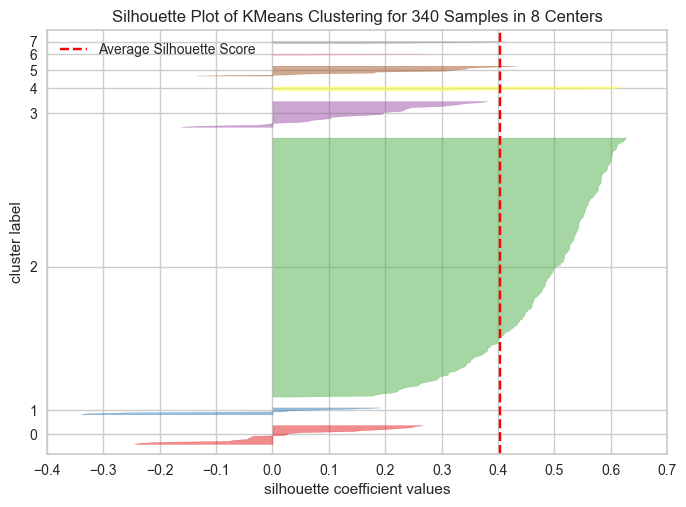

In [106]:
    visualizer = SilhouetteVisualizer(KMeans(8, random_state=1))
    visualizer.fit(df2_scaled)
    visualizer.show();

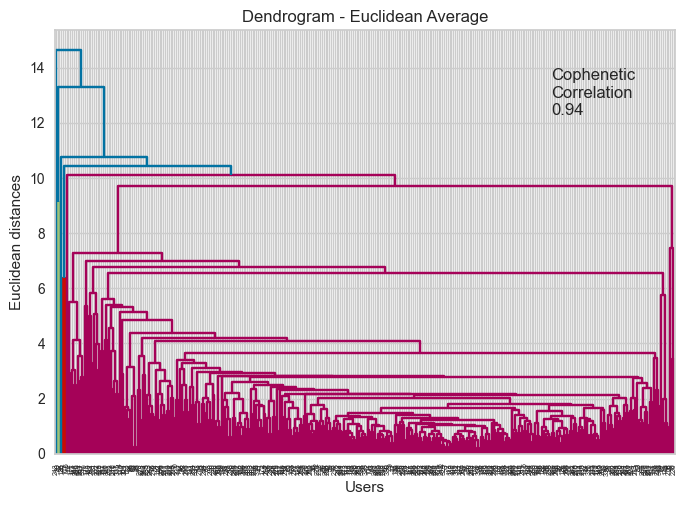

In [107]:
# Dendogram
Z = linkage(df2_scaled, method="average", metric='euclidean')
dendrogram_plot = dendrogram(Z)  
# Dendogram plot
plt.title('Dendrogram - Euclidean Average')
coph_corr, coph_dist = cophenet(Z, pdist(df2_scaled))
plt.annotate(f"Cophenetic\nCorrelation\n{coph_corr:0.2f}", (0.80, 0.80), xycoords="axes fraction")
plt.xlabel('Users')
plt.ylabel('Euclidean distances')
plt.show()

**Notes**
* K-mean's Silhouette Plot and AHC's Dendrogram diagram are both aligned in the sence for neither diagrams can be identified separate and distinct clusters. Instead, it is possible to deduct in both cases there is at least one dominant group concentrating most of observations.


## Consolidated notes on K-means vs Hierarchical Clustering

* Both clustering methods aligned to identify a main cluster with high number of observations, 77% for K-means and 97% for AHC
* This has an impact on the number of observations for the rest of clusters, being single observation clusters in five clusters for AHC, while for K-means observarions per cluster vary between 2 to 27.
* Almost all (263 out of 264) of stocks clustered by k-means as "Average Performance" (where all finantial metrics are on average values without a clear dominant metric) are also clustered by AHC as "Average Performance".
* There are also 5 stocks sharing asigned to same kind of cluster:  "P/E Ratio" (3), "ROE & Volality stocks" (1), and "Cash Ratio" (1)
* Remaining 75 stocks are classified on different clusters depending on clustering method.
* K-mean's Silhouette Plot and AHC's Dendrogram diagram are both aligned in the sence for neither diagrams can be identified separate and distinct clusters. Instead, it is possible to deduct in both cases there is at least one dominant group concentrating most of observations.

## Conclusions

### Report Functions

In [275]:
tendencies_ahc = Clusters_ahc['Tendency'].tolist()
tendencies_km = Clusters_km['Tendency'].tolist()
all_tendencies = tendencies_ahc + tendencies_km
unique_tendencies = list(set(all_tendencies))
print(", ".join(unique_tendencies))

Average perfom, Cash Ratio, P/E Ratio, P/B Ratio, Current Price, Net Cash Flow, Current Price & Earnings Per Share, Estimated Shares Oustanding & Net Income, ROE & Volatility, ROE & Volality, Volatility, ROE


In [231]:
def boxplot_report(df, column, label, outliers):
    
    df_category = df[df[column]==label]
    
    # Melt the dataframe to long format for easier plotting with seaborn
    df_category_melted = df_category.melt(id_vars=['Ticker Symbol'], value_vars=num_cols, var_name='Metrics', value_name='Value')
    
    # Create the boxplot
    sns.boxplot(x='Metrics', y='Value', data=df_category_melted, showfliers=outliers)
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.xlabel('')  # Remove x-axis title
    plt.ylabel('')  # Remove y-axis title
    plt.show()
    #display(df_category_melted)

In [172]:
from rich.console import Console
from rich.text import Text

In [276]:
# Report by Cluster

# Valid inputs
valid_clustering = ["km", "ahc"]
valid_km_metrics = Clusters_km['Tendency'].tolist()  # KM metrics come from Clusters_km
valid_ahc_metrics = Clusters_ahc['Tendency'].tolist()  # AHC metrics come from Clusters_ahc

# Function definition
def cluster_report(df, clustering, metric):
    
    # Validate clustering input
    if clustering not in valid_clustering:
        print(f"Invalid clustering method: {clustering}. Choose either 'km' or 'ahc'.")
        return  # Stop the function if invalid input
    
    # Validate metric input
    if clustering == "km":
        if metric not in valid_km_metrics:
            print(f"Invalid metric: {metric}. Choose one of the following: {', '.join(valid_km_metrics)}")
            return
        segment = 'KM_segments'
        clusters = Clusters_km
    else:
        if metric not in valid_ahc_metrics:
            print(f"Invalid metric: {metric}. Choose one of the following: {', '.join(valid_ahc_metrics)}")
            return
        segment = 'AHC_segments'
        clusters = Clusters_ahc
        
    console = Console()
    cl_nbr = clusters.loc[clusters['Tendency'] == metric, 'Cluster'].values[0]
    
    # Create a formatted title
    title = Text(metric)
    title.stylize("bold white")
    title.stylize("underline")
    
    # Print the formatted title
    console.print(title, style="on blue", justify="center")
    console.print(f"In the stocks group with {clusters.loc[cl_nbr,'Tendency']} tendency, there are {clusters.loc[cl_nbr,'Companies']} companies present.")
    
    # Print the companies
    companies_label = Text("Companies:", style="bold")
    console.print(companies_label, ", ".join(df[df[segment] == cl_nbr]["Security"].unique().tolist()))
    console.print()

    # Print Economic sectors
    sectors_label = Text("Economic Sectors:", style="bold")
    console.print(sectors_label, ", ".join(df[df[segment] == cl_nbr]["GICS Sector"].unique().tolist()))
    console.print()

    #Statistical summary
    stats_label = Text("Statistical summary table", style="bold")
    console.print(stats_label)
    scientific_columns = ['Net Cash Flow', 'Net Income', 'Estimated Shares Outstanding']
    df_summary = df[df[segment] == cl_nbr].describe().T
    def format_value(value, col):
        if col in scientific_columns:
            return "{:.0e}".format(value)  # Use scientific notation
        else:
            return "{:.2f}".format(value)  # Two decimal places
    formatted_output = df_summary.apply(lambda row: [format_value(val, row.name) for val in row], axis=1)
    formatted_df = pd.DataFrame(formatted_output.tolist(), index=df_summary.index, columns=df_summary.columns)
    display(formatted_df)
    console.print()

    #Boxplot
    boxplot_label = Text("Statistical summary boxplot (normalized metrics)", style="bold")
    console.print(boxplot_label)
    boxplot_report(df,segment,cl_nbr, False)

    console.print()
    console.print(" ", style="on blue", justify="center")
    console.print()
# Example usage:
# cluster_report(df, 'kml', 'ROE')


## Actionable Insights and Recommendations
* It is important to maintain a diversified portfolio when investing in stocks in order to maximise earnings under any market condition
* Following reports are presented to allow better stocks analysis across different market segments and help protect against risks that could make the portfolio vulnerable to losses.
* Personalized investment strategies presented in the form of **Stocks Reports**. Each report considers stocks grouped as per the common dominant metric across: Average perfom, Cash Ratio, P/E Ratio, P/B Ratio, Current Price, Net Cash Flow, Current Price & Earnings Per Share, Estimated Shares Oustanding & Net Income stocks, ROE & Volality stocks, Volatility, ROE & Volatility stocks, ROE

### Stocks Reports

                                                    Cash Ratio                                                     

In the stocks group with Cash Ratio tendency, there are 20 companies present.

Companies: Adobe Systems Inc, Analog Devices, Inc., Amgen Inc, Broadcom, Celgene Corp., eBay Inc., Edwards 
Lifesciences, Facebook, First Solar Inc, Frontier Communications, Halliburton Co., McDonald's Corp., Monster 
Beverage, Newmont Mining Corp. (Hldg. Co.), Skyworks Solutions, TripAdvisor, Vertex Pharmaceuticals Inc, Waters 
Corporation, Wynn Resorts Ltd, Yahoo Inc.

Economic Sectors: Information Technology, Health Care, Telecommunications Services, Energy, Consumer Discretionary,
Consumer Staples, Materials

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,20.00,80.15,44.95,4.67,45.75,77.91,118.54,162.33
Price Change,20.00,14.57,14.38,-8.51,10.21,13.95,18.41,55.05
Volatility,20.00,1.83,0.63,0.73,1.54,1.77,2.02,3.79
ROE,20.00,28.10,38.04,2.00,9.75,17.50,26.25,174.00
Cash Ratio,20.00,321.85,189.54,163.00,198.00,258.50,377.75,958.00
Net Cash Flow,2e+01,6e+08,2e+09,-4e+09,2e+07,2e+08,5e+08,8e+09
Net Income,2e+01,9e+08,2e+09,-4e+09,2e+08,5e+08,1e+09,7e+09
Earnings Per Share,20.00,2.01,3.04,-4.64,0.40,1.68,3.83,9.15
Estimated Shares Outstanding,2e+01,8e+08,7e+08,8e+07,2e+08,7e+08,1e+09,3e+09
P/E Ratio,20.00,45.07,39.27,12.18,18.97,31.66,59.91,178.45


Statistical summary boxplot (normalized metrics)

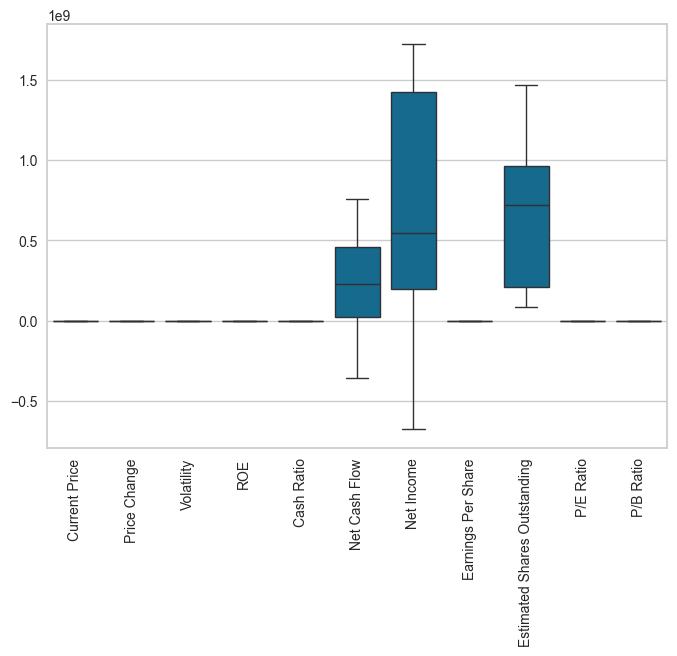

In [287]:
cluster_report (df_cl,'km','Cash Ratio')

                                                   Current Price                                                   

In the stocks group with Current Price tendency, there are 8 companies present.

Companies: Alliance Data Systems, BIOGEN IDEC Inc., Chipotle Mexican Grill, Equinix, Intuitive Surgical Inc., 
Mettler Toledo, Priceline.com Inc, Regeneron

Economic Sectors: Information Technology, Health Care, Consumer Discretionary, Real Estate

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,8.00,508.53,328.78,276.57,305.36,409.49,543.69,1274.95
Price Change,8.00,5.73,16.93,-33.13,4.49,8.10,17.43,18.94
Volatility,8.00,1.50,0.49,1.12,1.12,1.29,1.81,2.47
ROE,8.00,27.25,16.83,7.00,16.25,25.50,32.00,61.00
Cash Ratio,8.00,150.88,100.42,18.00,103.00,148.50,197.25,317.00
Net Cash Flow,8e+00,4e+07,9e+08,-2e+09,-3e+07,1e+08,2e+08,2e+09
Net Income,8e+00,1e+09,1e+09,2e+08,4e+08,6e+08,1e+09,4e+09
Earnings Per Share,8.00,15.96,14.56,3.25,8.22,14.03,15.50,50.09
Estimated Shares Outstanding,8e+00,8e+07,7e+07,3e+07,4e+07,5e+07,8e+07,2e+08
P/E Ratio,8.00,43.73,29.24,19.92,26.31,31.20,47.81,93.05


Statistical summary boxplot (normalized metrics)

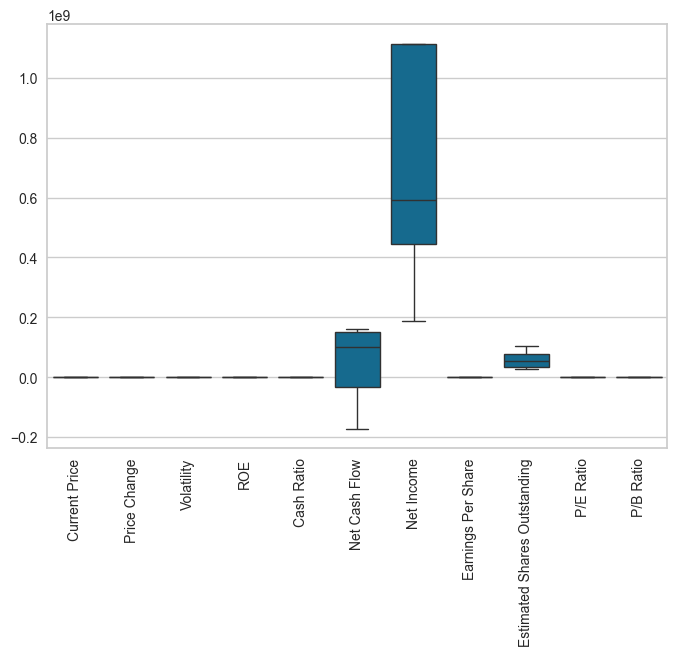

In [288]:
cluster_report (df_cl,'km','Current Price')

                                                    Volatility                                                     

In the stocks group with Volatility tendency, there are 27 companies present.

Companies: Anadarko Petroleum Corp, Arconic Inc, Baker Hughes Inc, Cabot Oil & Gas, Concho Resources, Devon Energy 
Corp., EOG Resources, EQT Corporation, Freeport-McMoran Cp & Gld, Hess Corporation, Hewlett Packard Enterprise, 
Kinder Morgan, The Mosaic Company, Marathon Oil Corp., Murphy Oil, Noble Energy Inc, Newfield Exploration Co, 
National Oilwell Varco Inc., ONEOK, Occidental Petroleum, Quanta Services Inc., Range Resources Corp., Spectra 
Energy Corp., Southwestern Energy, Teradata Corp., Williams Cos., Cimarex Energy

Economic Sectors: Energy, Industrials, Materials, Information Technology

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,27.00,34.23,23.45,6.77,18.97,26.42,47.32,92.86
Price Change,27.00,-15.52,13.07,-47.13,-21.03,-14.40,-6.59,7.30
Volatility,27.00,2.83,0.67,1.59,2.41,2.73,3.23,4.58
ROE,27.00,48.04,69.52,1.00,6.50,16.00,47.50,244.00
Cash Ratio,27.00,47.74,52.54,0.00,6.00,38.00,67.00,201.00
Net Cash Flow,3e+01,-1e+08,2e+09,-6e+09,-4e+08,-4e+07,1e+08,8e+09
Net Income,3e+01,-2e+09,4e+09,-1e+10,-3e+09,-8e+08,8e+07,2e+09
Earnings Per Share,27.00,-6.28,9.25,-35.55,-10.50,-3.26,0.20,2.79
Estimated Shares Outstanding,3e+01,5e+08,5e+08,9e+07,2e+08,4e+08,6e+08,3e+09
P/E Ratio,27.00,75.63,40.95,9.89,28.41,93.09,93.09,171.96


Statistical summary boxplot (normalized metrics)

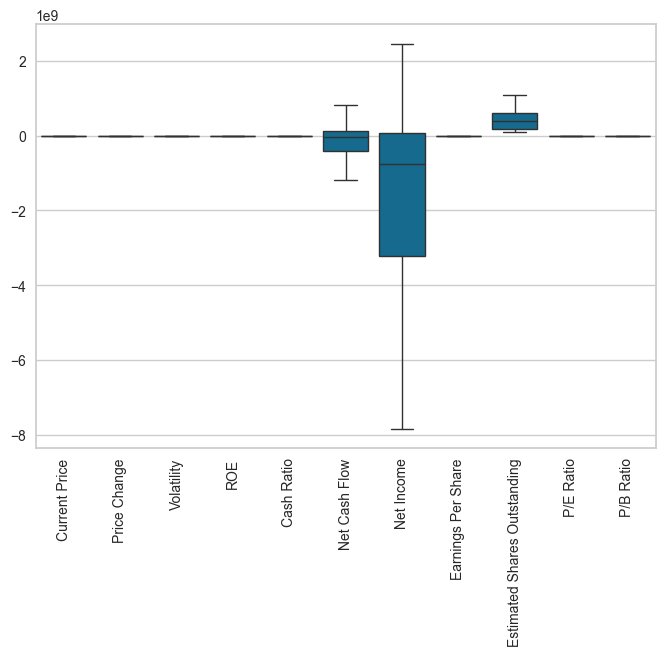

In [289]:
cluster_report (df_cl,'km','Volatility')

                                                        ROE                                                        

In the stocks group with ROE tendency, there are 5 companies present.

Companies: Allegion, Charter Communications, Colgate-Palmolive, Kimberly-Clark, S&P Global, Inc.

Economic Sectors: Industrials, Consumer Discretionary, Consumer Staples, Financials

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,5.00,108.30,48.95,65.92,66.62,98.58,127.30,183.10
Price Change,5.00,10.74,6.17,3.60,4.78,13.75,14.04,17.51
Volatility,5.00,1.17,0.34,0.87,0.90,1.08,1.28,1.70
ROE,5.00,566.20,58.14,463.00,582.00,589.00,596.00,601.00
Cash Ratio,5.00,26.60,21.89,0.00,10.00,27.00,45.00,51.00
Net Cash Flow,5e+00,-3e+08,4e+08,-1e+09,-2e+08,-1e+08,-9e+07,2e+06
Net Income,5e+00,7e+08,7e+08,-3e+08,2e+08,1e+09,1e+09,1e+09
Earnings Per Share,5.00,1.55,2.48,-2.43,1.53,1.60,2.78,4.26
Estimated Shares Outstanding,5e+00,3e+08,3e+08,1e+08,1e+08,3e+08,4e+08,9e+08
P/E Ratio,5.00,34.90,11.93,20.82,23.14,41.20,43.54,45.79


Statistical summary boxplot (normalized metrics)

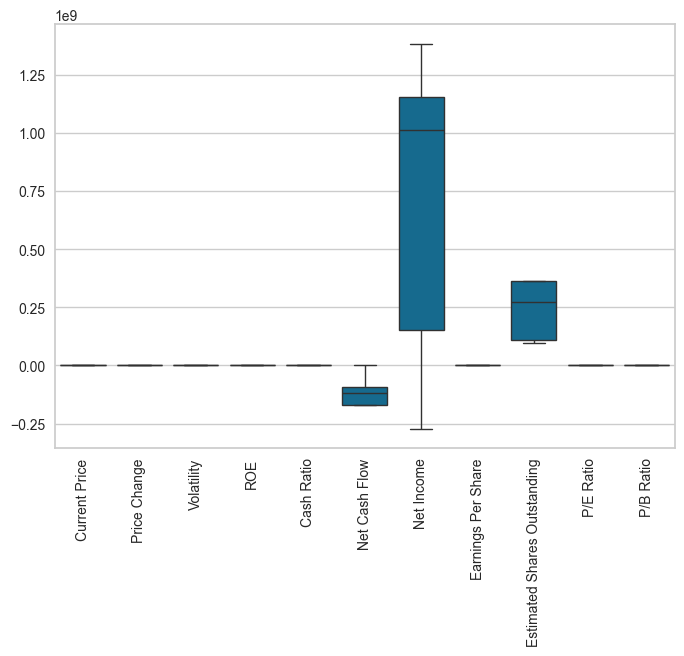

In [290]:
cluster_report (df_cl,'km','ROE')

                                     Estimated Shares Oustanding & Net Income                                      

In the stocks group with Estimated Shares Oustanding & Net Income tendency, there are 11 companies present.

Companies: Citigroup Inc., Ford Motor, Gilead Sciences, Intel Corp., JPMorgan Chase & Co., Coca Cola Company, 
Pfizer Inc., AT&T Inc, Verizon Communications, Wells Fargo, Exxon Mobil Corp.

Economic Sectors: Financials, Consumer Discretionary, Health Care, Information Technology, Consumer Staples, 
Telecommunications Services, Energy

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,11.00,50.52,24.15,14.09,34.43,46.22,60.20,101.19
Price Change,11.00,5.75,3.29,2.40,3.39,5.53,6.54,14.04
Volatility,11.00,1.13,0.22,0.84,0.93,1.15,1.25,1.49
ROE,11.00,31.09,36.55,8.00,10.50,12.00,27.50,109.00
Cash Ratio,11.00,75.91,53.01,7.00,28.50,79.00,99.00,162.00
Net Cash Flow,1e+01,-1e+09,6e+09,-1e+10,-5e+09,-9e+08,2e+09,1e+10
Net Income,1e+01,1e+10,6e+09,7e+09,9e+09,2e+10,2e+10,2e+10
Earnings Per Share,11.00,4.15,3.15,1.13,2.12,3.85,4.89,12.37
Estimated Shares Outstanding,1e+01,4e+09,1e+09,1e+09,4e+09,4e+09,5e+09,6e+09
P/E Ratio,11.00,14.80,7.01,7.58,10.06,13.00,17.38,28.57


Statistical summary boxplot (normalized metrics)

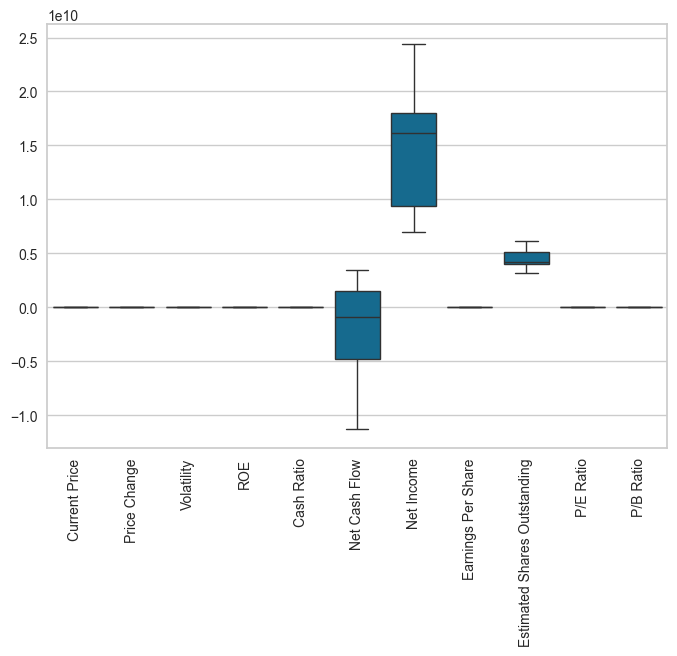

In [291]:
cluster_report (df_cl,'km','Estimated Shares Oustanding & Net Income')

                                                  ROE & Volality                                                   

In the stocks group with ROE & Volality tendency, there are 2 companies present.

Companies: Apache Corporation, Chesapeake Energy

Economic Sectors: Energy

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,2.00,24.49,28.26,4.50,14.49,24.49,34.48,44.47
Price Change,2.00,-13.35,35.00,-38.10,-25.73,-13.35,-0.98,11.40
Volatility,2.00,3.48,1.52,2.41,2.94,3.48,4.02,4.56
ROE,2.00,802.00,162.63,687.00,744.50,802.00,859.50,917.00
Cash Ratio,2.00,51.00,41.01,22.00,36.50,51.00,65.50,80.00
Net Cash Flow,2e+00,-1e+09,3e+09,-3e+09,-2e+09,-1e+09,-3e+08,7e+08
Net Income,2e+00,-2e+10,6e+09,-2e+10,-2e+10,-2e+10,-2e+10,-1e+10
Earnings Per Share,2.00,-41.81,27.41,-61.20,-51.51,-41.81,-32.12,-22.43
Estimated Shares Outstanding,2e+00,5e+08,2e+08,4e+08,5e+08,5e+08,6e+08,7e+08
P/E Ratio,2.00,60.75,45.74,28.41,44.58,60.75,76.92,93.09


Statistical summary boxplot (normalized metrics)

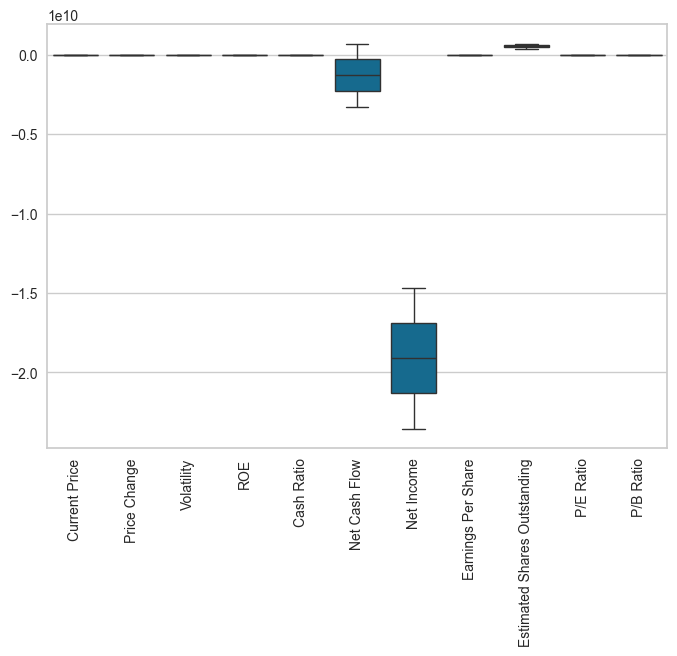

In [295]:
cluster_report (df_cl,'km','ROE & Volality')

                                                     P/E Ratio                                                     

In the stocks group with P/E Ratio tendency, there are 3 companies present.

Companies: Alexion Pharmaceuticals, Amazon.com Inc, Netflix Inc.

Economic Sectors: Health Care, Consumer Discretionary, Information Technology

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,3.00,327.01,304.55,114.38,152.56,190.75,433.32,675.89
Price Change,3.00,21.92,10.57,11.15,16.74,22.34,27.30,32.27
Volatility,3.00,2.03,0.57,1.46,1.74,2.02,2.31,2.61
ROE,3.00,4.00,2.00,2.00,3.00,4.00,5.00,6.00
Cash Ratio,3.00,106.00,77.16,58.00,61.50,65.00,130.00,195.00
Net Cash Flow,3e+00,7e+08,6e+08,7e+07,4e+08,7e+08,1e+09,1e+09
Net Income,3e+00,3e+08,3e+08,1e+08,1e+08,1e+08,4e+08,6e+08
Earnings Per Share,3.00,0.75,0.50,0.29,0.48,0.68,0.98,1.28
Estimated Shares Outstanding,3e+00,4e+08,1e+08,2e+08,3e+08,4e+08,4e+08,5e+08
P/E Ratio,3.00,400.99,123.89,280.51,337.46,394.41,461.23,528.04


Statistical summary boxplot (normalized metrics)

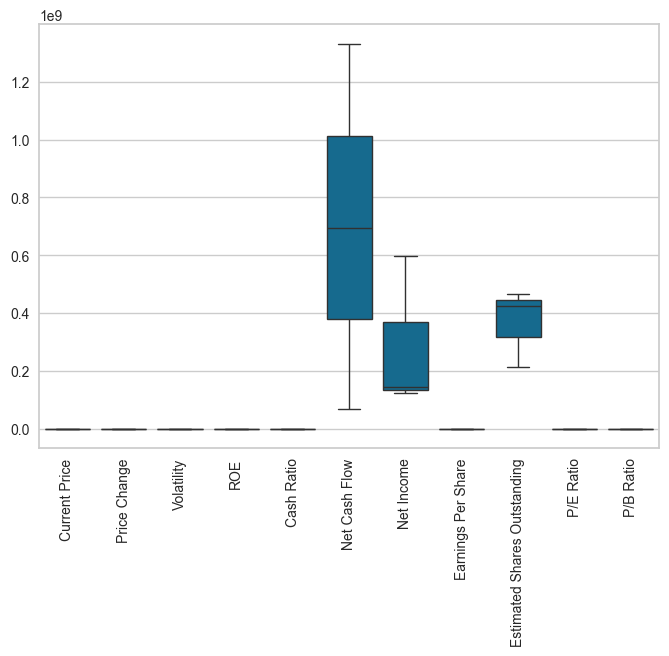

In [293]:
cluster_report (df_cl,'km','P/E Ratio')

                                                     P/E Ratio                                                     

In the stocks group with P/E Ratio tendency, there are 3 companies present.

Companies: Alexion Pharmaceuticals, Amazon.com Inc, Netflix Inc.

Economic Sectors: Health Care, Consumer Discretionary, Information Technology

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,3.00,327.01,304.55,114.38,152.56,190.75,433.32,675.89
Price Change,3.00,21.92,10.57,11.15,16.74,22.34,27.30,32.27
Volatility,3.00,2.03,0.57,1.46,1.74,2.02,2.31,2.61
ROE,3.00,4.00,2.00,2.00,3.00,4.00,5.00,6.00
Cash Ratio,3.00,106.00,77.16,58.00,61.50,65.00,130.00,195.00
Net Cash Flow,3e+00,7e+08,6e+08,7e+07,4e+08,7e+08,1e+09,1e+09
Net Income,3e+00,3e+08,3e+08,1e+08,1e+08,1e+08,4e+08,6e+08
Earnings Per Share,3.00,0.75,0.50,0.29,0.48,0.68,0.98,1.28
Estimated Shares Outstanding,3e+00,4e+08,1e+08,2e+08,3e+08,4e+08,4e+08,5e+08
P/E Ratio,3.00,400.99,123.89,280.51,337.46,394.41,461.23,528.04


Statistical summary boxplot (normalized metrics)

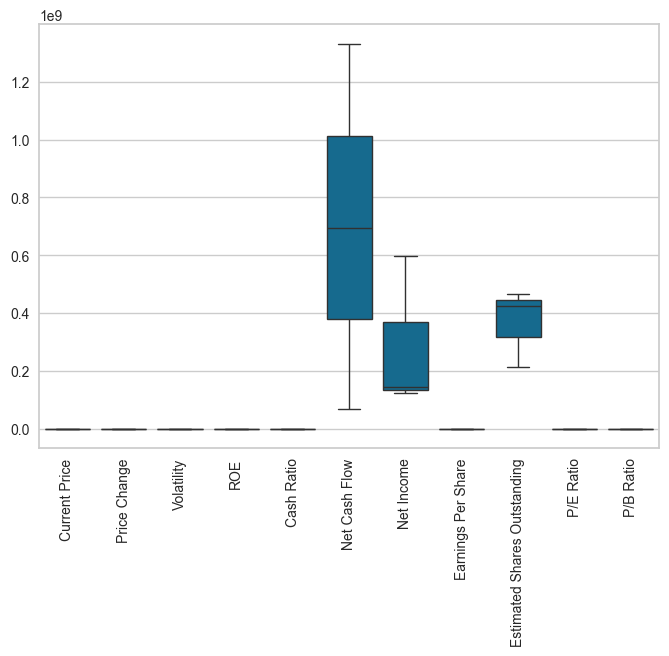

In [294]:
cluster_report (df_cl,'ahc','P/E Ratio')

                                                   Net Cash Flow                                                   

In the stocks group with Net Cash Flow tendency, there are 2 companies present.

Companies: Bank of America Corp, Intel Corp.

Economic Sectors: Financials, Information Technology

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,2.00,25.64,12.46,16.83,21.24,25.64,30.05,34.45
Price Change,2.00,11.24,3.96,8.44,9.84,11.24,12.64,14.04
Volatility,2.00,1.32,0.14,1.23,1.27,1.32,1.37,1.42
ROE,2.00,12.50,9.19,6.00,9.25,12.50,15.75,19.00
Cash Ratio,2.00,130.50,44.55,99.00,114.75,130.50,146.25,162.00
Net Cash Flow,2e+00,2e+10,6e+09,1e+10,1e+10,2e+10,2e+10,2e+10
Net Income,2e+00,1e+10,3e+09,1e+10,1e+10,1e+10,1e+10,2e+10
Earnings Per Share,2.00,3.29,1.25,2.41,2.85,3.29,3.74,4.18
Estimated Shares Outstanding,2e+00,3e+09,3e+09,8e+08,2e+09,3e+09,4e+09,5e+09
P/E Ratio,2.00,13.65,0.91,13.00,13.33,13.65,13.97,14.29


Statistical summary boxplot (normalized metrics)

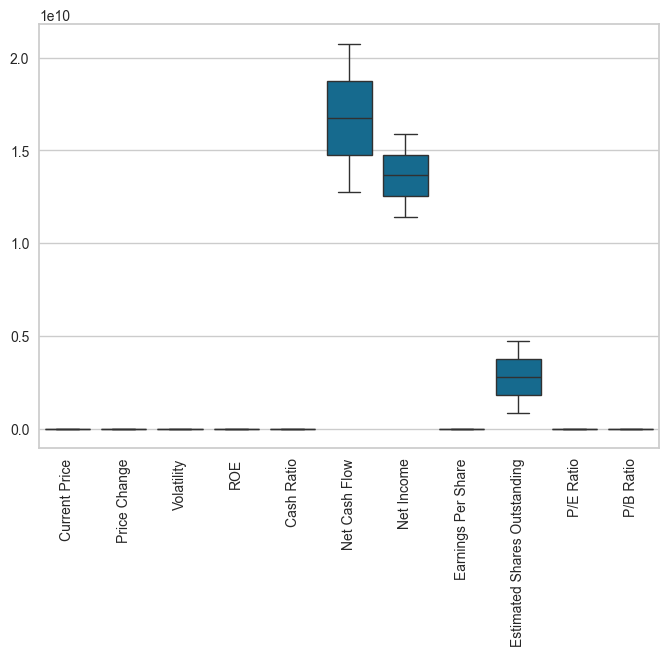

In [283]:
cluster_report (df_cl,'ahc','Net Cash Flow')

                                                    Cash Ratio                                                     

In the stocks group with Cash Ratio tendency, there are 1 companies present.

Companies: Facebook

Economic Sectors: Information Technology

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,104.66,nan,104.66,104.66,104.66,104.66,104.66
Price Change,1.00,16.22,nan,16.22,16.22,16.22,16.22,16.22
Volatility,1.00,1.32,nan,1.32,1.32,1.32,1.32,1.32
ROE,1.00,8.00,nan,8.00,8.00,8.00,8.00,8.00
Cash Ratio,1.00,958.00,nan,958.00,958.00,958.00,958.00,958.00
Net Cash Flow,1e+00,6e+08,nan,6e+08,6e+08,6e+08,6e+08,6e+08
Net Income,1e+00,4e+09,nan,4e+09,4e+09,4e+09,4e+09,4e+09
Earnings Per Share,1.00,1.31,nan,1.31,1.31,1.31,1.31,1.31
Estimated Shares Outstanding,1e+00,3e+09,nan,3e+09,3e+09,3e+09,3e+09,3e+09
P/E Ratio,1.00,79.89,nan,79.89,79.89,79.89,79.89,79.89


Statistical summary boxplot (normalized metrics)

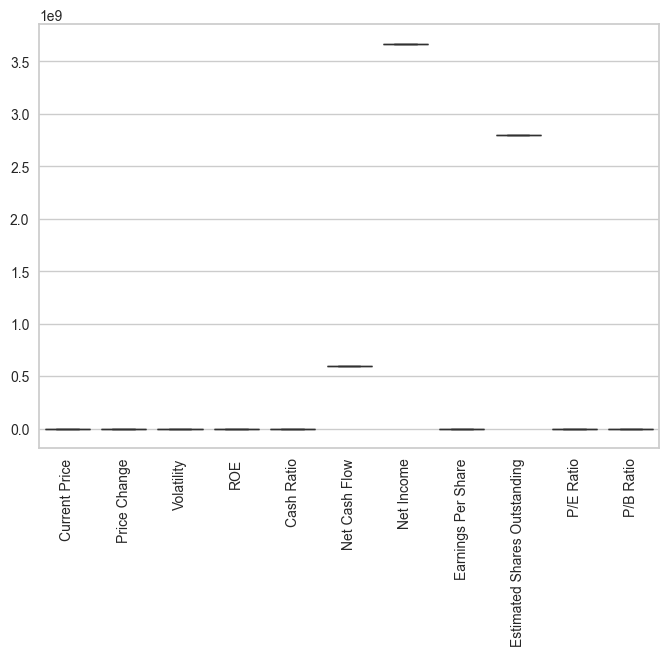

In [284]:
cluster_report (df_cl,'ahc','Cash Ratio')

                                        Current Price & Earnings Per Share                                         

In the stocks group with Current Price & Earnings Per Share tendency, there are 1 companies present.

Companies: Priceline.com Inc

Economic Sectors: Consumer Discretionary

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,1274.95,nan,1274.95,1274.95,1274.95,1274.95,1274.95
Price Change,1.00,3.19,nan,3.19,3.19,3.19,3.19,3.19
Volatility,1.00,1.27,nan,1.27,1.27,1.27,1.27,1.27
ROE,1.00,29.00,nan,29.00,29.00,29.00,29.00,29.00
Cash Ratio,1.00,184.00,nan,184.00,184.00,184.00,184.00,184.00
Net Cash Flow,1e+00,-2e+09,nan,-2e+09,-2e+09,-2e+09,-2e+09,-2e+09
Net Income,1e+00,3e+09,nan,3e+09,3e+09,3e+09,3e+09,3e+09
Earnings Per Share,1.00,50.09,nan,50.09,50.09,50.09,50.09,50.09
Estimated Shares Outstanding,1e+00,5e+07,nan,5e+07,5e+07,5e+07,5e+07,5e+07
P/E Ratio,1.00,25.45,nan,25.45,25.45,25.45,25.45,25.45


Statistical summary boxplot (normalized metrics)

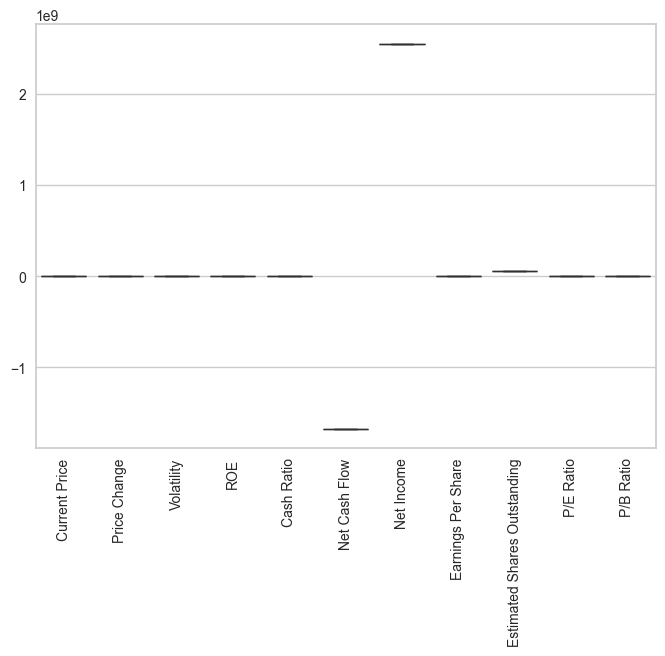

In [285]:
cluster_report (df_cl,'ahc','Current Price & Earnings Per Share')

                                                     P/B Ratio                                                     

In the stocks group with P/B Ratio tendency, there are 1 companies present.

Companies: Alliance Data Systems

Economic Sectors: Information Technology

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,276.57,nan,276.57,276.57,276.57,276.57,276.57
Price Change,1.00,6.19,nan,6.19,6.19,6.19,6.19,6.19
Volatility,1.00,1.12,nan,1.12,1.12,1.12,1.12,1.12
ROE,1.00,30.00,nan,30.00,30.00,30.00,30.00,30.00
Cash Ratio,1.00,25.00,nan,25.00,25.00,25.00,25.00,25.00
Net Cash Flow,1e+00,9e+07,nan,9e+07,9e+07,9e+07,9e+07,9e+07
Net Income,1e+00,6e+08,nan,6e+08,6e+08,6e+08,6e+08,6e+08
Earnings Per Share,1.00,8.91,nan,8.91,8.91,8.91,8.91,8.91
Estimated Shares Outstanding,1e+00,7e+07,nan,7e+07,7e+07,7e+07,7e+07,7e+07
P/E Ratio,1.00,31.04,nan,31.04,31.04,31.04,31.04,31.04


Statistical summary boxplot (normalized metrics)

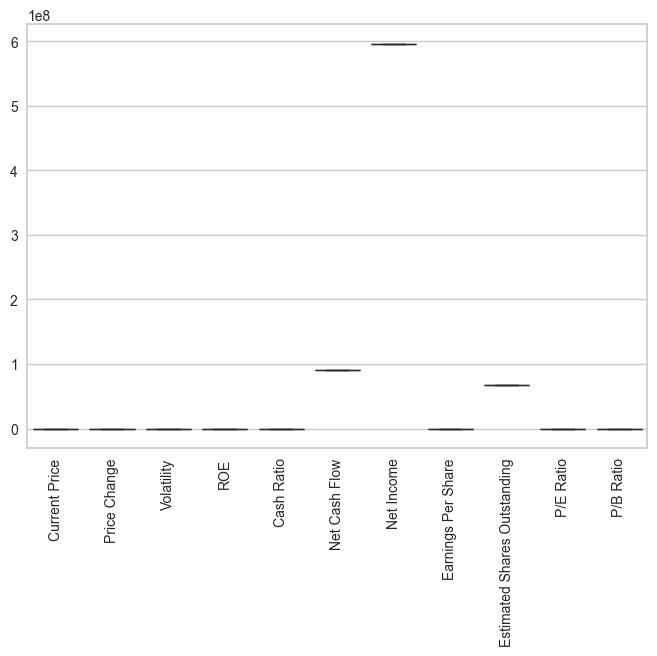

In [297]:
cluster_report (df_cl,'ahc','P/B Ratio')

                                                 ROE & Volatility                                                  

In the stocks group with ROE & Volatility tendency, there are 1 companies present.

Companies: Chesapeake Energy

Economic Sectors: Energy

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,4.50,nan,4.50,4.50,4.50,4.50,4.50
Price Change,1.00,-38.10,nan,-38.10,-38.10,-38.10,-38.10,-38.10
Volatility,1.00,4.56,nan,4.56,4.56,4.56,4.56,4.56
ROE,1.00,687.00,nan,687.00,687.00,687.00,687.00,687.00
Cash Ratio,1.00,22.00,nan,22.00,22.00,22.00,22.00,22.00
Net Cash Flow,1e+00,-3e+09,nan,-3e+09,-3e+09,-3e+09,-3e+09,-3e+09
Net Income,1e+00,-1e+10,nan,-1e+10,-1e+10,-1e+10,-1e+10,-1e+10
Earnings Per Share,1.00,-22.43,nan,-22.43,-22.43,-22.43,-22.43,-22.43
Estimated Shares Outstanding,1e+00,7e+08,nan,7e+08,7e+08,7e+08,7e+08,7e+08
P/E Ratio,1.00,28.41,nan,28.41,28.41,28.41,28.41,28.41


Statistical summary boxplot (normalized metrics)

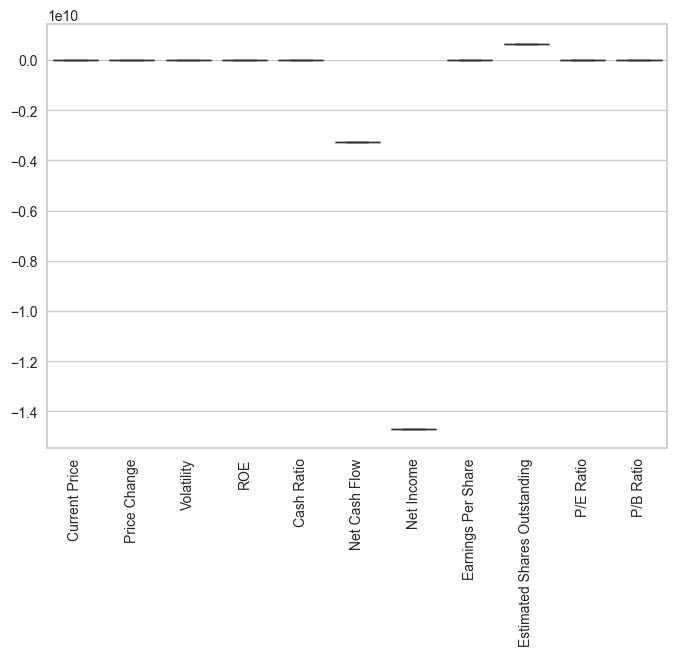

In [299]:
cluster_report (df_cl,'ahc','ROE & Volatility')

                                                        ROE                                                        

In the stocks group with ROE tendency, there are 1 companies present.

Companies: Apache Corporation

Economic Sectors: Energy

Statistical summary table

,count,mean,std,min,25%,50%,75%,max
Current Price,1.00,44.47,nan,44.47,44.47,44.47,44.47,44.47
Price Change,1.00,11.40,nan,11.40,11.40,11.40,11.40,11.40
Volatility,1.00,2.41,nan,2.41,2.41,2.41,2.41,2.41
ROE,1.00,917.00,nan,917.00,917.00,917.00,917.00,917.00
Cash Ratio,1.00,80.00,nan,80.00,80.00,80.00,80.00,80.00
Net Cash Flow,1e+00,7e+08,nan,7e+08,7e+08,7e+08,7e+08,7e+08
Net Income,1e+00,-2e+10,nan,-2e+10,-2e+10,-2e+10,-2e+10,-2e+10
Earnings Per Share,1.00,-61.20,nan,-61.20,-61.20,-61.20,-61.20,-61.20
Estimated Shares Outstanding,1e+00,4e+08,nan,4e+08,4e+08,4e+08,4e+08,4e+08
P/E Ratio,1.00,93.09,nan,93.09,93.09,93.09,93.09,93.09


Statistical summary boxplot (normalized metrics)

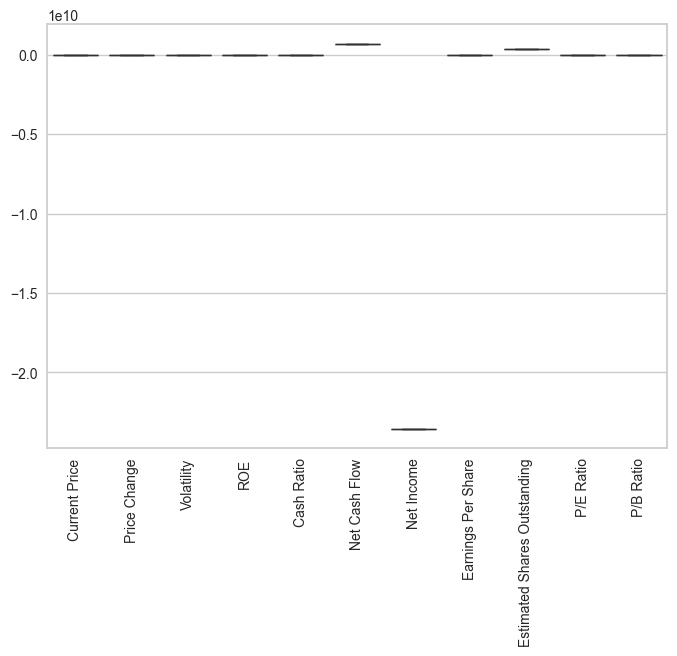

In [300]:
cluster_report (df_cl,'ahc','ROE')

In [301]:

#create html version
!jupyter nbconvert --to html USL_Project_LearnerNotebook_FullCode_CM.ipynb


[NbConvertApp] Converting notebook USL_Project_LearnerNotebook_FullCode_CM.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 173 image(s).
[NbConvertApp] Writing 11774421 bytes to USL_Project_LearnerNotebook_FullCode_CM.html
